***AI Engineer - P8 - Traiter les images pour le système embarqué d'une voiture autonome***

# Importation des modules

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, UpSampling2D
from tensorflow.keras.optimizers import Adadelta, Nadam
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model, Sequence, to_categorical
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing import image
import tensorflow as tf

import cv2

import albumentations as A

In [2]:
# Crée le dossier de logs s'il n'existe pas
log_dir = 'C:\\Users\\steph\\Desktop\\Openclassrooms\\tmp'
os.makedirs(log_dir, exist_ok=True)

# Fonctions

## Fonctions d'analyse des images

In [3]:
def find_images_with_text(directory, text):
    """
    Parcourt récursivement un répertoire pour trouver des fichiers contenant un texte spécifique dans leur nom.

    Paramètres:
    directory: Le répertoire racine à parcourir.
    text: Le texte à rechercher dans les noms de fichiers.
    
    Retourne: 
    Une liste des chemins des fichiers dont le nom contient le texte spécifié.
    """
    image_list = []

    # Utilisation de os.walk pour parcourir tous les sous-dossiers et fichiers
    for root, dirs, files in os.walk(directory):
        for file in files:
            # Vérification si le texte spécifié est dans le nom du fichier
            if text in file:
                # Ajout du chemin complet du fichier à la liste
                image_list.append(os.path.join(root, file))

    return image_list

In [4]:
def show_random_images_with_masks(df, n=1):
    """
    Affiche aléatoirement n images et leurs masques associés à partir d'un DataFrame.

    Paramètres:
    df: DataFrame contenant les colonnes 'image' et 'mask', avec les chemins des images.
    n: Nombre d'images à afficher (par défaut 1).
    """
    # Sélectionne n lignes aléatoires dans le DataFrame
    indices = random.sample(range(len(df)), n)
    selected_rows = df.iloc[indices]
    
    # Parcours des lignes sélectionnées pour afficher les images et les masques
    for _, row in selected_rows.iterrows():
        image_path = row['image']
        mask_path = row['mask']
        color_path = row['color']
        
        # Lecture de l'image et du masque
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Charger le masque en niveaux de gris
        color = cv2.imread(color_path)
        
        # Affichage de l'image et du masque côte à côte
        plt.figure(figsize=(10, 5))
        
        # Affiche l'image
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Image")
        plt.axis("off")
        
        # Affiche le masque
        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Masque en gris")
        plt.axis("off")
        
        # Affiche le masque en couleurs
        plt.subplot(1, 3, 3)
        plt.imshow(color)
        plt.title("Masque en couleurs")
        plt.axis("off")
        
        # Affiche le graphique
        plt.show()

## Fonctions des métriques

In [5]:
def dice_coeff(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(K.cast(y_true, 'float32'))  # Conversion explicite en float32
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))  # Conversion explicite en float32
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    return 1 - dice_coeff(y_true, y_pred)

def total_loss(y_true, y_pred):
    binary_crossentropy_loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return binary_crossentropy_loss + (3 * dice_loss(y_true, y_pred))

def jaccard_score(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(K.cast(y_true, 'float32'))
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

# Fonction pour calculer l'IoU (Jaccard) pour chaque classe
def calculate_iou(true_mask, pred_mask, num_classes):
    ious = []
    for cls in range(num_classes):
        true_cls = (true_mask == cls).astype(int)
        pred_cls = (pred_mask == cls).astype(int)
        iou = jaccard_score(true_cls.flatten(), pred_cls.flatten())
        ious.append(iou)
    return ious

## Fonctions de visualisation

In [6]:
# Fonction de visualisation avec IoU pour chaque classe
def plot_sample_prediction(epoch, logs, idx):
    img = np.expand_dims(images[idx], axis=0)
    pred_mask = model.predict(img)[0]
    pred_mask = np.argmax(pred_mask, axis=-1)
    true_mask = np.argmax(masks[idx], axis=-1)
    
    # Calcul des IoU
    num_classes = len(cats)
    #iou_true = calculate_iou(true_mask, true_mask, num_classes)
    iou_pred = calculate_iou(true_mask, pred_mask, num_classes)

    # Ajustement de la taille et de la disposition de la figure
    fig, ax = plt.subplots(2, 3, figsize=(15, 8))
    fig.suptitle(f"Époque {epoch + 1}")

    # Première ligne : Image d'origine, masque réel, masque prédit
    ax[0, 0].imshow(images[idx])
    ax[0, 0].set_title("Image")
    ax[0, 0].axis('off')
    
    ax[0, 1].imshow(true_mask, cmap='tab10')
    ax[0, 1].set_title("Masque réel")
    ax[0, 1].axis('off')
    
    ax[0, 2].imshow(pred_mask, cmap='tab10')
    ax[0, 2].set_title("Masque prédit")
    ax[0, 2].axis('off')

    # Seconde ligne : Case vide, IoU pour le masque réel, IoU pour le masque prédit
    ax[1, 0].axis('off')  # Case vide
    
    # Graphique IoU pour le masque réel
    #ax[1, 1].bar(range(num_classes), iou_true, color=plt.cm.tab20(range(num_classes)))
    #ax[1, 1].set_ylim(0, 1)
    #ax[1, 1].set_title("IoU pour chaque classe (Masque réel)")
    #ax[1, 1].set_xlabel("Classe")
    #ax[1, 1].set_ylabel("IoU")
    ax[1, 1].axis('off')  # Case vide

    # Graphique IoU pour le masque prédit
    ax[1, 2].bar(range(num_classes), iou_pred, color=plt.cm.tab10(range(num_classes)))
    ax[1, 2].set_ylim(0, 1)
    ax[1, 2].set_title("IoU pour chaque classe (Masque prédit)")
    ax[1, 2].set_xlabel("Classe")
    ax[1, 2].set_ylabel("IoU")
    
    # Ajustement de l'espacement
    plt.subplots_adjust(hspace=0.4, wspace=0.3)  # Réduit l'espacement entre les graphiques
    plt.show()

    # Affichage des IoU après les graphiques
    print("IoU pour chaque classe (Masque prédit) :")
    for i, iou in enumerate(iou_pred):
        print(f"Classe {i} : IoU = {iou:.4f}")

## Autres fonctions

In [7]:
# Chargement et préparation des données avec les dimensions correctes
def load_and_preprocess_image(path, target_size=(256, 512)):
    image = cv2.imread(path)
    image = cv2.resize(image, (target_size[1], target_size[0]))  # Mettre en forme (512, 256) pour (largeur, hauteur)
    image = image / 255.0  # Normalisation
    return image

def load_images(df, target_size=(256, 512)):
    images = np.array([load_and_preprocess_image(img_path, target_size) for img_path in df['image']])
    return images

In [8]:
# Préparation des masques de segmentation
def load_mask(path, target_size=(256, 512)):
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (target_size[1], target_size[0]), interpolation=cv2.INTER_NEAREST)
    mask = np.vectorize(cat_map.get)(mask)  # Remap categories
    return mask

def load_masks(df, target_size=(256, 512)):
    masks = np.array([load_mask(mask_path, target_size) for mask_path in df['mask']])
    masks = to_categorical(masks, num_classes=len(cats))  # One-hot encoding
    return masks

In [9]:
# Callback pour afficher la prédiction et les graphiques IoU après chaque époque
class PredictionCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        # Générer un index aléatoire une seule fois pour toutes les époques
        self.idx = np.random.randint(len(images))
    
    def on_epoch_end(self, epoch, logs=None):
        plot_sample_prediction(epoch, logs, self.idx)

# Chargement des images

In [10]:
image_train_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\train\\"
mask_train_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\train\\"

image_val_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\val\\"
mask_val_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\val\\"

image_test_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\test\\"
mask_test_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\test\\"

In [11]:
search_image_text = "leftImg8bit"

image_train_list = find_images_with_text(image_train_dir, search_image_text)
image_val_list = find_images_with_text(image_val_dir, search_image_text)
image_test_list = find_images_with_text(image_test_dir, search_image_text)

print('Nombre d\'images d\'entraînement :',len(image_train_list))
print('Nombre d\'images de validation :',len(image_val_list))
print('Nombre d\'images de test :',len(image_test_list))

Nombre d'images d'entraînement : 2975
Nombre d'images de validation : 500
Nombre d'images de test : 1525


In [12]:
search_mask_text = "labelIds"

mask_train_list = find_images_with_text(mask_train_dir, search_mask_text)
mask_val_list = find_images_with_text(mask_val_dir, search_mask_text)
mask_test_list = find_images_with_text(mask_test_dir, search_mask_text)

print('Nombre de mask d\'entraînement :',len(mask_train_list))
print('Nombre de mask de validation :',len(mask_val_list))
print('Nombre de mask de test :',len(mask_test_list))

Nombre de mask d'entraînement : 2975
Nombre de mask de validation : 500
Nombre de mask de test : 1525


In [13]:
search_color_text = "color"

color_train_list = find_images_with_text(mask_train_dir, search_color_text)
color_val_list = find_images_with_text(mask_val_dir, search_color_text)
color_test_list = find_images_with_text(mask_test_dir, search_color_text)

print('Nombre d\'images d\'entraînement :',len(color_train_list))
print('Nombre d\'images de validation :',len(color_val_list))
print('Nombre d\'images de test :',len(color_test_list))

Nombre d'images d'entraînement : 2975
Nombre d'images de validation : 500
Nombre d'images de test : 1525


In [14]:
image_train_list.sort()
mask_train_list.sort()
color_train_list.sort()

image_val_list.sort()
mask_val_list.sort()
color_val_list.sort()

image_test_list.sort()
mask_test_list.sort()
color_test_list.sort()

In [15]:
df_train = pd.DataFrame({
    'image': image_train_list,
    'mask': mask_train_list,
    'color': color_train_list
})

In [16]:
df_val = pd.DataFrame({
    'image': image_val_list,
    'mask': mask_val_list,
    'color': color_val_list
})

In [17]:
df_test = pd.DataFrame({
    'image': image_test_list,
    'mask': mask_test_list,
    'color': color_test_list
})

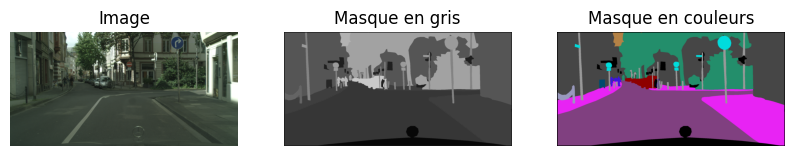

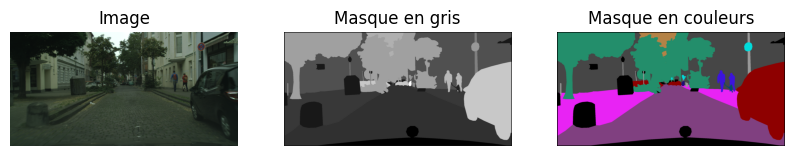

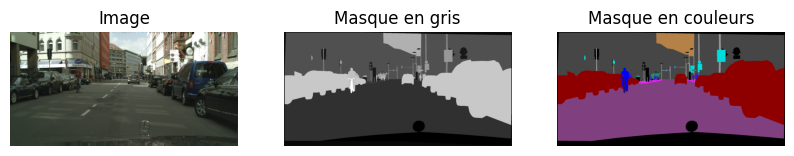

In [18]:
show_random_images_with_masks(df_train, n=3)

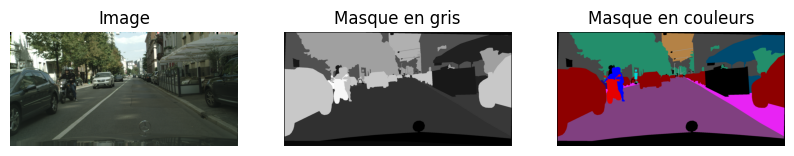

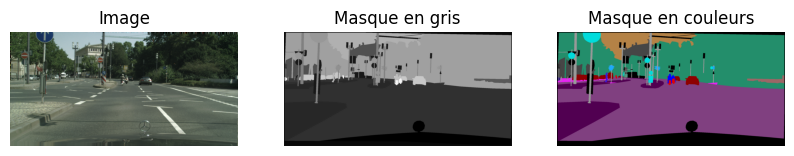

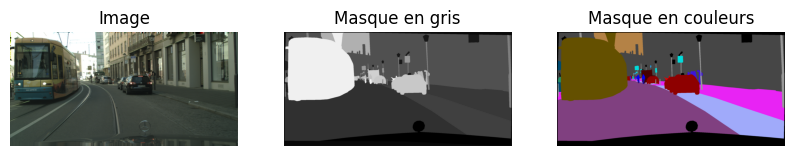

In [19]:
show_random_images_with_masks(df_val, n=3)

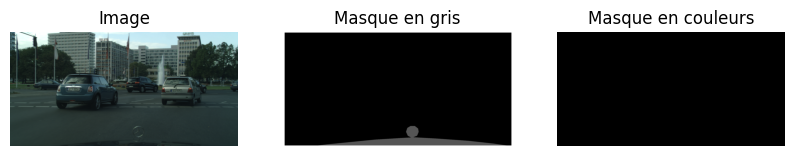

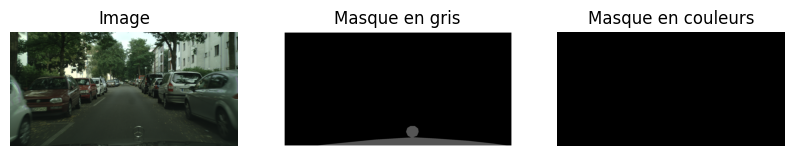

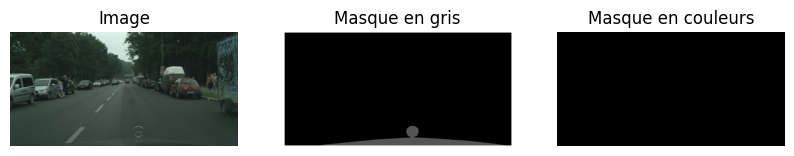

In [20]:
show_random_images_with_masks(df_test, n=3)

In [21]:
image0 = cv2.imread(df_train.iloc[0,0])
mask0 = cv2.imread(df_train.iloc[0,1])

print('Dimension image :', image0.shape)
print('Dimension mask :', mask0.shape)

Dimension image : (1024, 2048, 3)
Dimension mask : (1024, 2048, 3)


In [22]:
df_train_sample = df_train.sample(n=300, random_state=42)

# Catégories

In [23]:
cats = {
    'void': [0, 1, 2, 3, 4, 5, 6],
    'flat': [7, 8, 9, 10],
    'construction': [11, 12, 13, 14, 15, 16],
    'object': [17, 18, 19, 20],
    'nature': [21, 22],
    'sky': [23],
    'human': [24, 25],
    'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
}

In [24]:
# Création d'une carte de catégories pour les masques
cat_map = {}
for i, (cat, ids) in enumerate(cats.items()):
    for id_ in ids:
        cat_map[id_] = i

# Entrainement avec VGG16

## Avec 10 époques

In [25]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 512, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
output = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model = Model(inputs=base_model.input, outputs=output)

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy'])

# Entraînement du modèle avec le callback
# history = model.fit(
#     images,
#     masks,
#     batch_size=8,
#     epochs=10,
#     validation_split=0.2,
#     callbacks=[PredictionCallback()]
# )

## Avec 20 époques

In [26]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [27]:
filename = f"best_model_without_data_augmentation.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 14s/step - accuracy: 0.2299 - dice_coeff: 0.1841 - dice_loss: 0.8159 - jaccard_score: 0.1035 - loss: 5.1534 - total_loss: 4.2600 
Epoch 1: val_jaccard_score improved from -inf to 0.19439, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


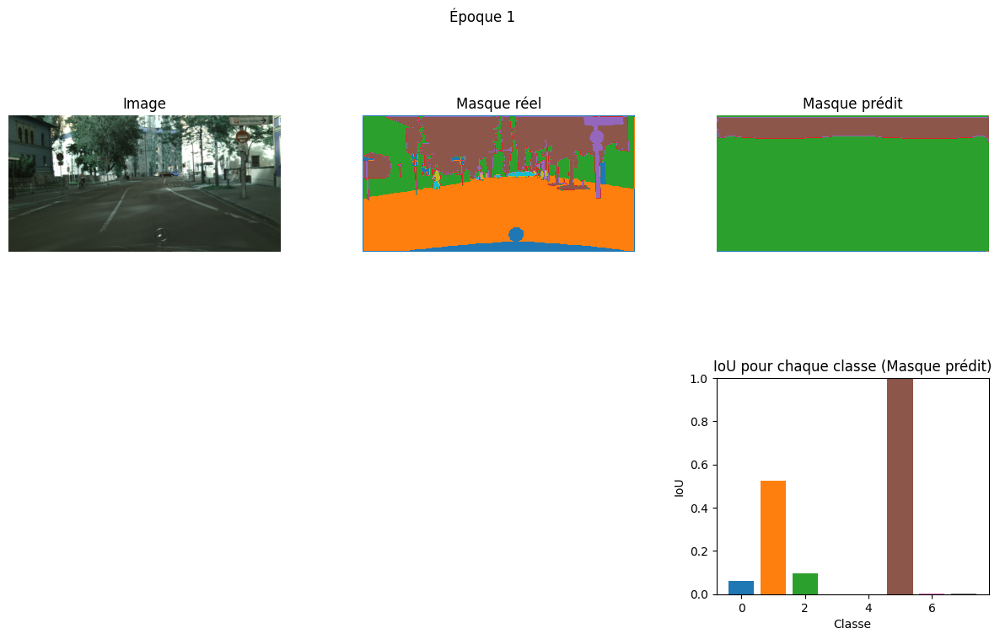

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.0596
Classe 1 : IoU = 0.5255
Classe 2 : IoU = 0.0972
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0015
30/30 ━━━━━━━━━━━━━━━━━━━━ 465s 15s/step - accuracy: 0.2321 - dice_coeff: 0.1849 - dice_loss: 0.8151 - jaccard_score: 0.1040 - loss: 5.0832 - total_loss: 4.2425 - val_accuracy: 0.4389 - val_dice_coeff: 0.3254 - val_dice_loss: 0.6746 - val_jaccard_score: 0.1944 - val_loss: 1.5140 - val_total_loss: 3.2862
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.4978 - dice_coeff: 0.3325 - dice_loss: 0.6675 - jaccard_score: 0.2009 - loss: 1.4911 - total_loss: 3.3182 
Epoch 2: val_jaccard_score did not improve from 0.19439
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


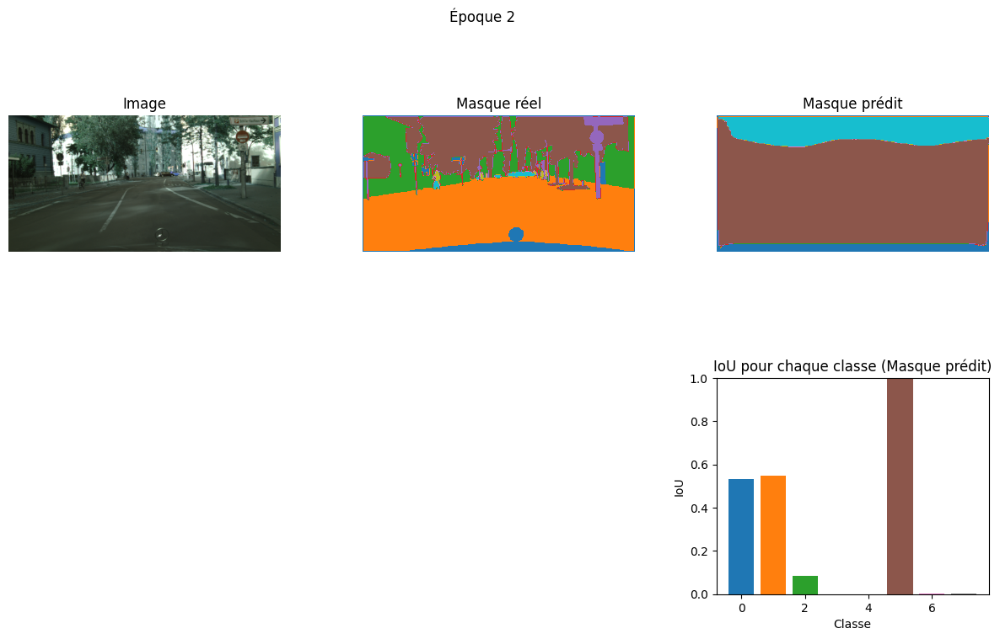

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5340
Classe 1 : IoU = 0.5494
Classe 2 : IoU = 0.0860
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0015
30/30 ━━━━━━━━━━━━━━━━━━━━ 541s 18s/step - accuracy: 0.4972 - dice_coeff: 0.3322 - dice_loss: 0.6678 - jaccard_score: 0.2007 - loss: 1.4928 - total_loss: 3.3201 - val_accuracy: 0.4861 - val_dice_coeff: 0.3248 - val_dice_loss: 0.6752 - val_jaccard_score: 0.1940 - val_loss: 1.4789 - val_total_loss: 3.2851
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.5299 - dice_coeff: 0.3816 - dice_loss: 0.6184 - jaccard_score: 0.2373 - loss: 1.3105 - total_loss: 3.2103 
Epoch 3: val_jaccard_score improved from 0.19439 to 0.30695, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


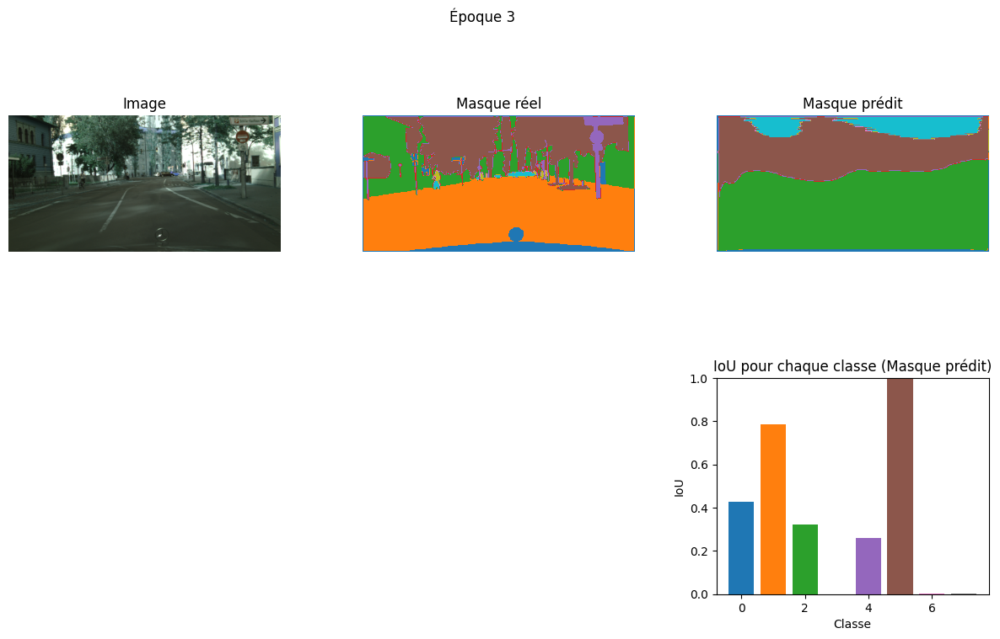

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4288
Classe 1 : IoU = 0.7875
Classe 2 : IoU = 0.3217
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.2617
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0015
30/30 ━━━━━━━━━━━━━━━━━━━━ 554s 19s/step - accuracy: 0.5308 - dice_coeff: 0.3830 - dice_loss: 0.6170 - jaccard_score: 0.2384 - loss: 1.3073 - total_loss: 3.2109 - val_accuracy: 0.5777 - val_dice_coeff: 0.4695 - val_dice_loss: 0.5305 - val_jaccard_score: 0.3070 - val_loss: 1.1120 - val_total_loss: 3.2611
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.6263 - dice_coeff: 0.5074 - dice_loss: 0.4926 - jaccard_score: 0.3403 - loss: 1.0117 - total_loss: 3.1196 
Epoch 4: val_jaccard_score improved from 0.30695 to 0.36377, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


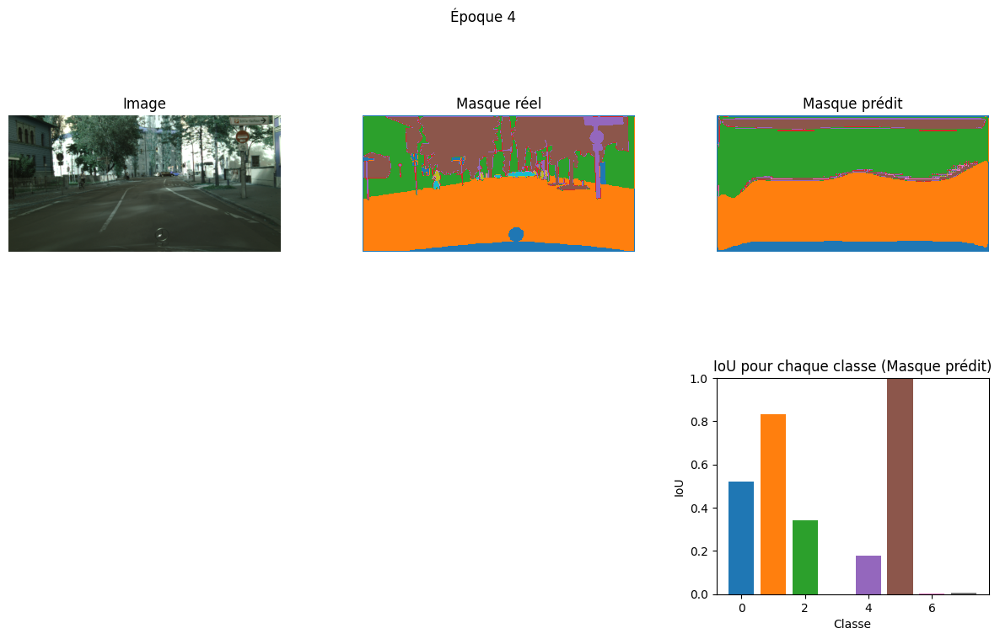

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5200
Classe 1 : IoU = 0.8319
Classe 2 : IoU = 0.3400
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.1774
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0063
30/30 ━━━━━━━━━━━━━━━━━━━━ 563s 19s/step - accuracy: 0.6261 - dice_coeff: 0.5078 - dice_loss: 0.4922 - jaccard_score: 0.3407 - loss: 1.0108 - total_loss: 3.1188 - val_accuracy: 0.6028 - val_dice_coeff: 0.5332 - val_dice_loss: 0.4668 - val_jaccard_score: 0.3638 - val_loss: 0.9745 - val_total_loss: 3.1464
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.6269 - dice_coeff: 0.5449 - dice_loss: 0.4551 - jaccard_score: 0.3747 - loss: 0.9173 - total_loss: 3.0823 
Epoch 5: val_jaccard_score improved from 0.36377 to 0.37880, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


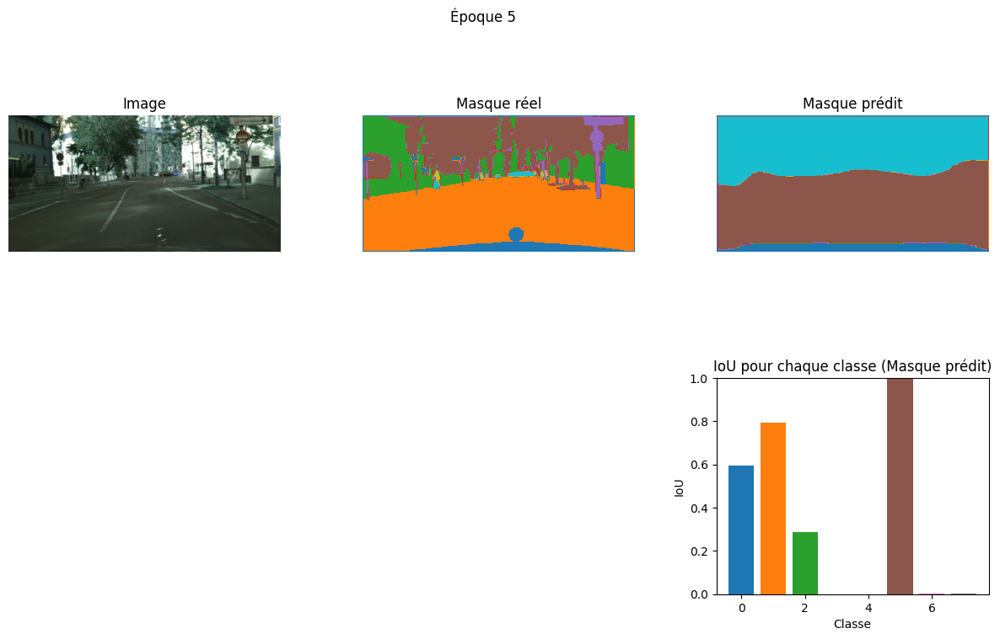

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5958
Classe 1 : IoU = 0.7932
Classe 2 : IoU = 0.2855
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0015
30/30 ━━━━━━━━━━━━━━━━━━━━ 567s 19s/step - accuracy: 0.6270 - dice_coeff: 0.5448 - dice_loss: 0.4552 - jaccard_score: 0.3746 - loss: 0.9177 - total_loss: 3.0814 - val_accuracy: 0.6116 - val_dice_coeff: 0.5491 - val_dice_loss: 0.4509 - val_jaccard_score: 0.3788 - val_loss: 0.9700 - val_total_loss: 2.9858
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6562 - dice_coeff: 0.5697 - dice_loss: 0.4303 - jaccard_score: 0.3987 - loss: 0.8728 - total_loss: 3.0300 
Epoch 6: val_jaccard_score improved from 0.37880 to 0.41586, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


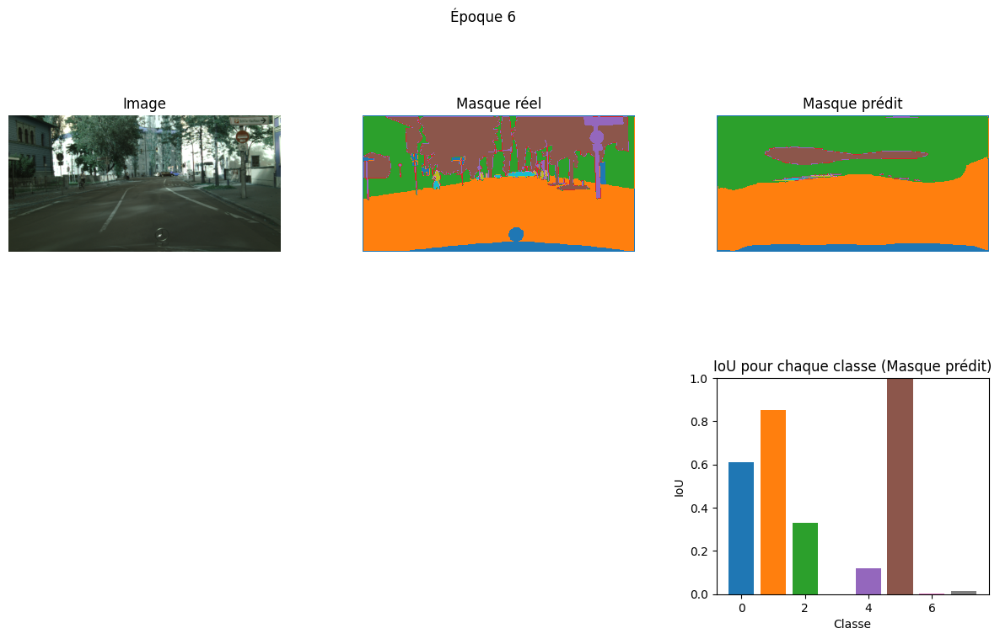

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6119
Classe 1 : IoU = 0.8539
Classe 2 : IoU = 0.3318
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.1178
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0126
30/30 ━━━━━━━━━━━━━━━━━━━━ 554s 19s/step - accuracy: 0.6563 - dice_coeff: 0.5697 - dice_loss: 0.4303 - jaccard_score: 0.3987 - loss: 0.8727 - total_loss: 3.0301 - val_accuracy: 0.6321 - val_dice_coeff: 0.5870 - val_dice_loss: 0.4130 - val_jaccard_score: 0.4159 - val_loss: 0.9219 - val_total_loss: 3.0736
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6708 - dice_coeff: 0.5941 - dice_loss: 0.4059 - jaccard_score: 0.4227 - loss: 0.8258 - total_loss: 2.9838 
Epoch 7: val_jaccard_score did not improve from 0.41586
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


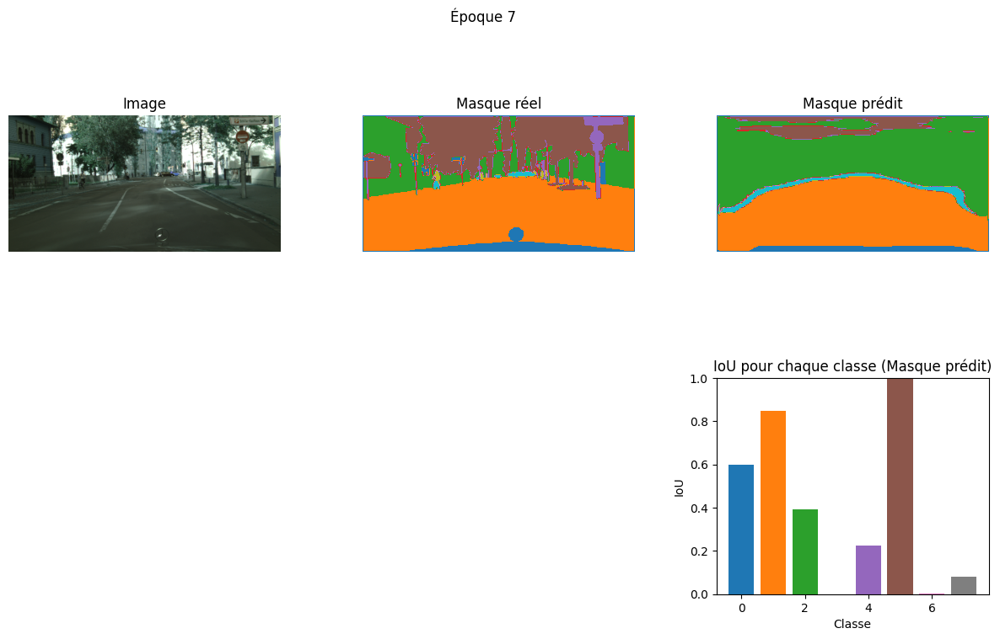

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5996
Classe 1 : IoU = 0.8473
Classe 2 : IoU = 0.3939
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.2235
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0808
30/30 ━━━━━━━━━━━━━━━━━━━━ 551s 18s/step - accuracy: 0.6709 - dice_coeff: 0.5941 - dice_loss: 0.4059 - jaccard_score: 0.4227 - loss: 0.8257 - total_loss: 2.9831 - val_accuracy: 0.6539 - val_dice_coeff: 0.5536 - val_dice_loss: 0.4464 - val_jaccard_score: 0.3830 - val_loss: 0.8752 - val_total_loss: 2.9486
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6635 - dice_coeff: 0.5826 - dice_loss: 0.4174 - jaccard_score: 0.4117 - loss: 0.8363 - total_loss: 2.9217 
Epoch 8: val_jaccard_score improved from 0.41586 to 0.42775, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


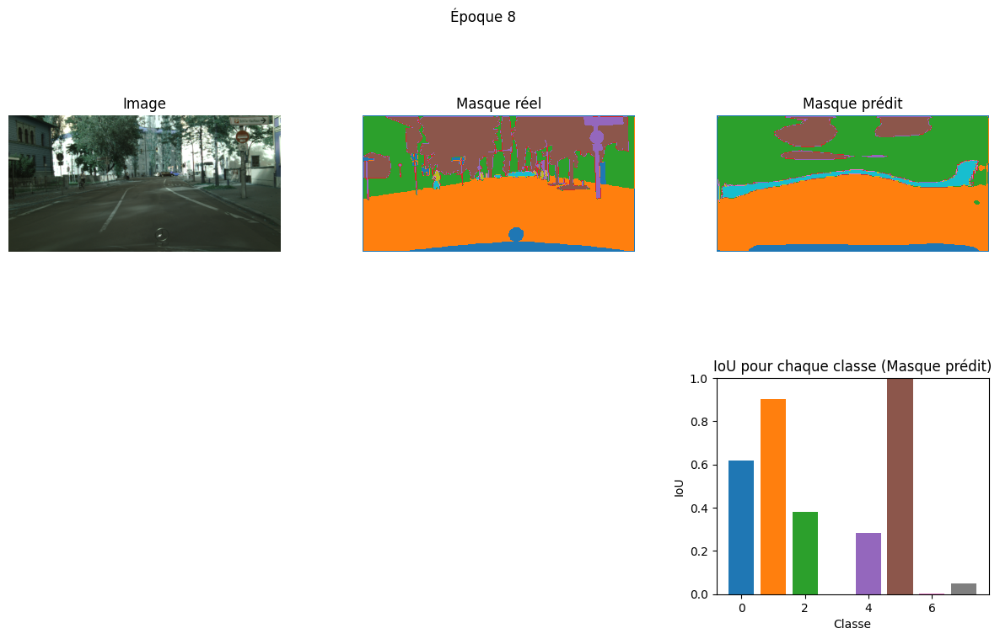

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6198
Classe 1 : IoU = 0.9018
Classe 2 : IoU = 0.3800
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.2815
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0514
30/30 ━━━━━━━━━━━━━━━━━━━━ 548s 18s/step - accuracy: 0.6639 - dice_coeff: 0.5829 - dice_loss: 0.4171 - jaccard_score: 0.4120 - loss: 0.8358 - total_loss: 2.9197 - val_accuracy: 0.6843 - val_dice_coeff: 0.5989 - val_dice_loss: 0.4011 - val_jaccard_score: 0.4277 - val_loss: 0.8203 - val_total_loss: 2.8551
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7082 - dice_coeff: 0.6203 - dice_loss: 0.3797 - jaccard_score: 0.4502 - loss: 0.7795 - total_loss: 2.8813 
Epoch 9: val_jaccard_score did not improve from 0.42775
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


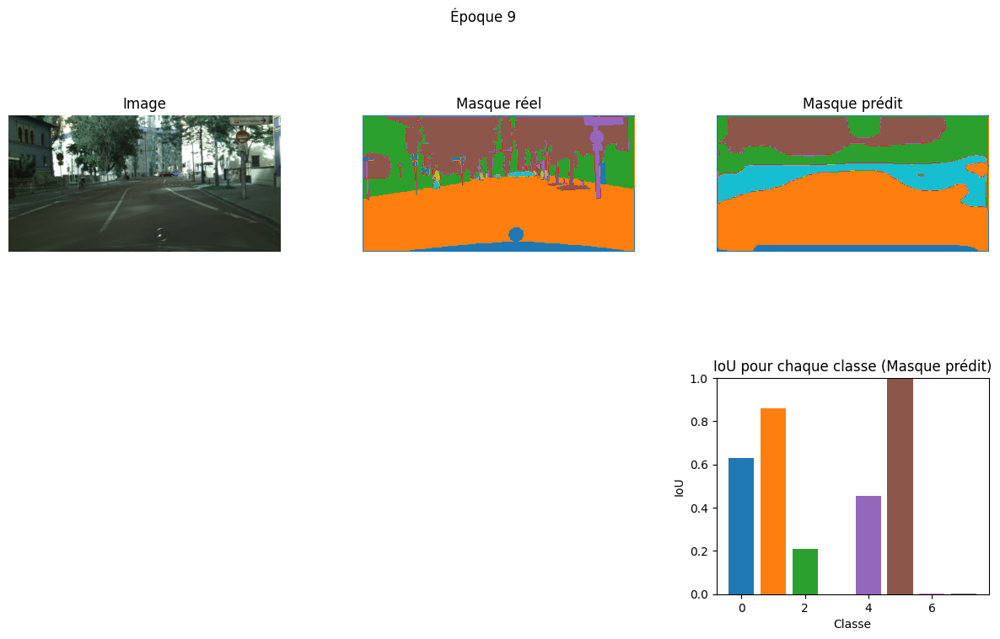

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6320
Classe 1 : IoU = 0.8588
Classe 2 : IoU = 0.2082
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.4532
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0015
30/30 ━━━━━━━━━━━━━━━━━━━━ 552s 18s/step - accuracy: 0.7080 - dice_coeff: 0.6201 - dice_loss: 0.3799 - jaccard_score: 0.4500 - loss: 0.7801 - total_loss: 2.8813 - val_accuracy: 0.7058 - val_dice_coeff: 0.5754 - val_dice_loss: 0.4246 - val_jaccard_score: 0.4042 - val_loss: 0.8342 - val_total_loss: 2.8335
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7207 - dice_coeff: 0.6097 - dice_loss: 0.3903 - jaccard_score: 0.4390 - loss: 0.7774 - total_loss: 2.8299 
Epoch 10: val_jaccard_score improved from 0.42775 to 0.46819, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


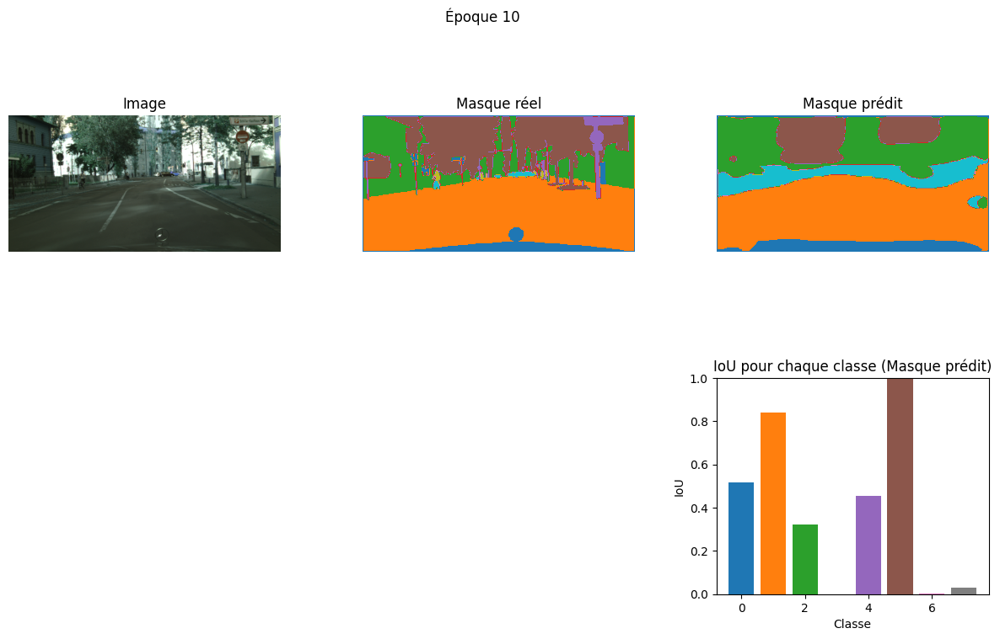

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5187
Classe 1 : IoU = 0.8399
Classe 2 : IoU = 0.3204
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.4536
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0315
30/30 ━━━━━━━━━━━━━━━━━━━━ 550s 18s/step - accuracy: 0.7207 - dice_coeff: 0.6101 - dice_loss: 0.3899 - jaccard_score: 0.4395 - loss: 0.7772 - total_loss: 2.8291 - val_accuracy: 0.7210 - val_dice_coeff: 0.6375 - val_dice_loss: 0.3625 - val_jaccard_score: 0.4682 - val_loss: 0.7729 - val_total_loss: 2.8750
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7441 - dice_coeff: 0.6555 - dice_loss: 0.3445 - jaccard_score: 0.4882 - loss: 0.7248 - total_loss: 2.7882 
Epoch 11: val_jaccard_score did not improve from 0.46819
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


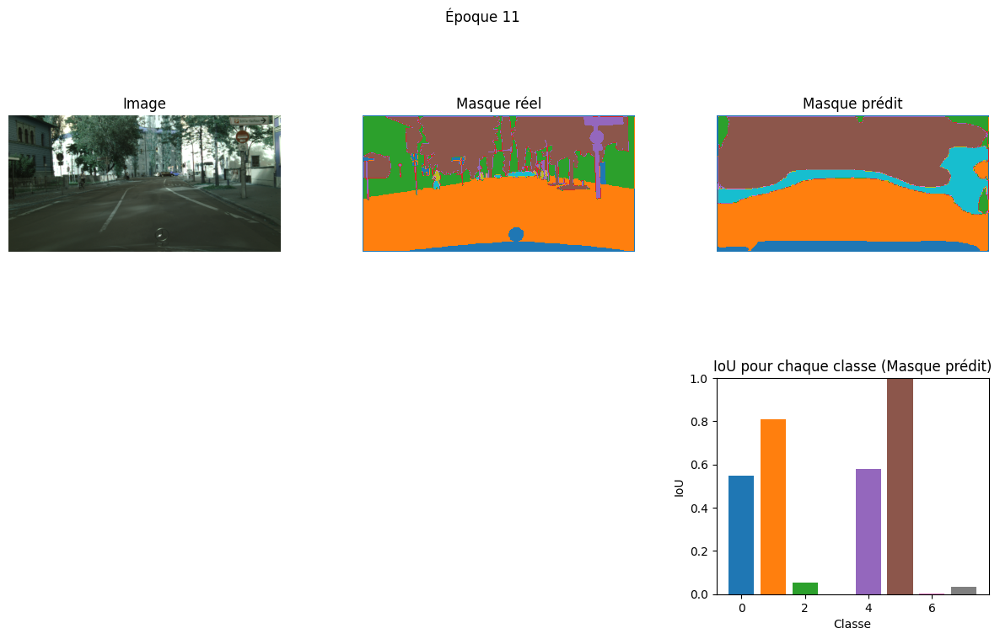

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5479
Classe 1 : IoU = 0.8079
Classe 2 : IoU = 0.0531
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5813
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0354
30/30 ━━━━━━━━━━━━━━━━━━━━ 549s 18s/step - accuracy: 0.7440 - dice_coeff: 0.6552 - dice_loss: 0.3448 - jaccard_score: 0.4879 - loss: 0.7254 - total_loss: 2.7883 - val_accuracy: 0.7189 - val_dice_coeff: 0.6032 - val_dice_loss: 0.3968 - val_jaccard_score: 0.4323 - val_loss: 0.7882 - val_total_loss: 2.7558
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7436 - dice_coeff: 0.6532 - dice_loss: 0.3468 - jaccard_score: 0.4858 - loss: 0.7262 - total_loss: 2.7076 
Epoch 12: val_jaccard_score improved from 0.46819 to 0.48728, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


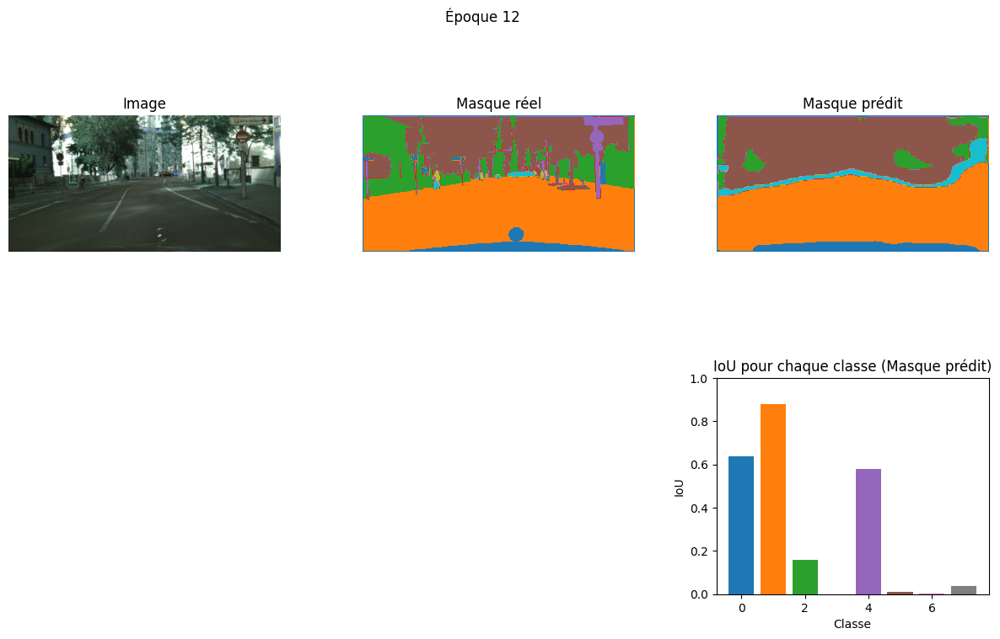

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6377
Classe 1 : IoU = 0.8780
Classe 2 : IoU = 0.1573
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5785
Classe 5 : IoU = 0.0112
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0372
30/30 ━━━━━━━━━━━━━━━━━━━━ 549s 18s/step - accuracy: 0.7435 - dice_coeff: 0.6532 - dice_loss: 0.3468 - jaccard_score: 0.4858 - loss: 0.7265 - total_loss: 2.7084 - val_accuracy: 0.7511 - val_dice_coeff: 0.6549 - val_dice_loss: 0.3451 - val_jaccard_score: 0.4873 - val_loss: 0.7466 - val_total_loss: 2.8201
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7451 - dice_coeff: 0.6562 - dice_loss: 0.3438 - jaccard_score: 0.4887 - loss: 0.7257 - total_loss: 2.8040 
Epoch 13: val_jaccard_score improved from 0.48728 to 0.52515, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


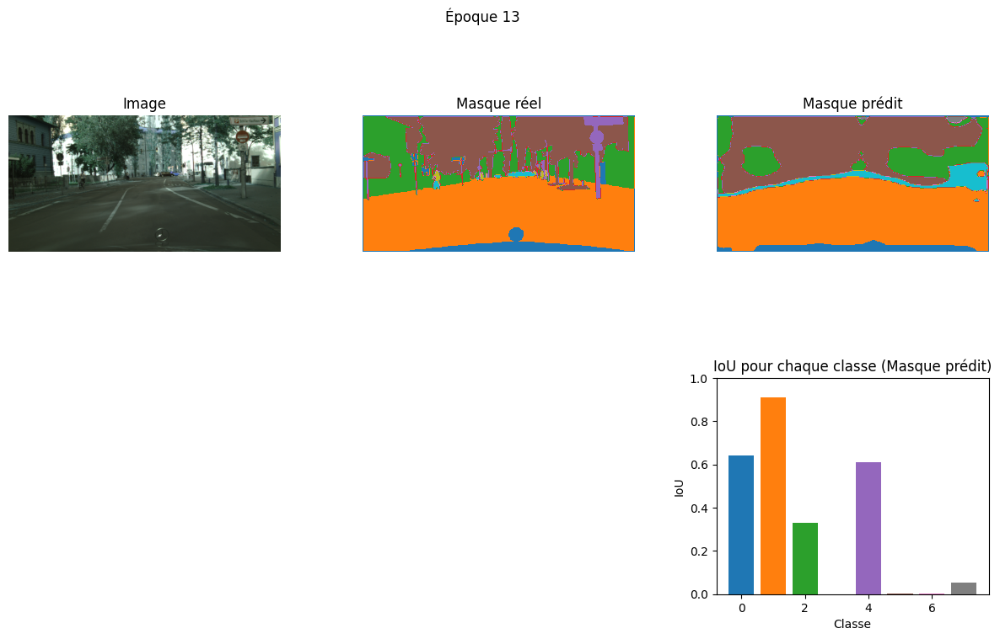

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6437
Classe 1 : IoU = 0.9124
Classe 2 : IoU = 0.3312
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.6089
Classe 5 : IoU = 0.0023
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0553
30/30 ━━━━━━━━━━━━━━━━━━━━ 545s 18s/step - accuracy: 0.7454 - dice_coeff: 0.6564 - dice_loss: 0.3436 - jaccard_score: 0.4890 - loss: 0.7252 - total_loss: 2.8017 - val_accuracy: 0.7710 - val_dice_coeff: 0.6883 - val_dice_loss: 0.3117 - val_jaccard_score: 0.5251 - val_loss: 0.7135 - val_total_loss: 2.7760
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7828 - dice_coeff: 0.6988 - dice_loss: 0.3012 - jaccard_score: 0.5375 - loss: 0.6436 - total_loss: 2.7226 
Epoch 14: val_jaccard_score improved from 0.52515 to 0.53003, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


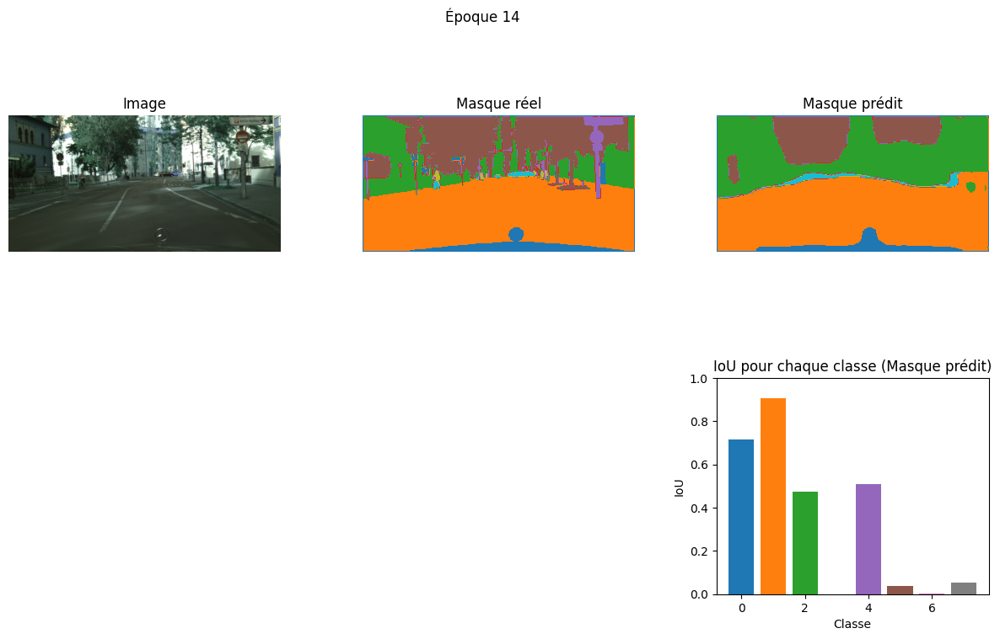

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.7175
Classe 1 : IoU = 0.9073
Classe 2 : IoU = 0.4727
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5082
Classe 5 : IoU = 0.0385
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0529
30/30 ━━━━━━━━━━━━━━━━━━━━ 546s 18s/step - accuracy: 0.7827 - dice_coeff: 0.6986 - dice_loss: 0.3014 - jaccard_score: 0.5373 - loss: 0.6440 - total_loss: 2.7218 - val_accuracy: 0.7462 - val_dice_coeff: 0.6923 - val_dice_loss: 0.3077 - val_jaccard_score: 0.5300 - val_loss: 0.7565 - val_total_loss: 2.7831
Epoch 15/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.7798 - dice_coeff: 0.6972 - dice_loss: 0.3028 - jaccard_score: 0.5359 - loss: 0.6451 - total_loss: 2.7305 
Epoch 15: val_jaccard_score did not improve from 0.53003
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


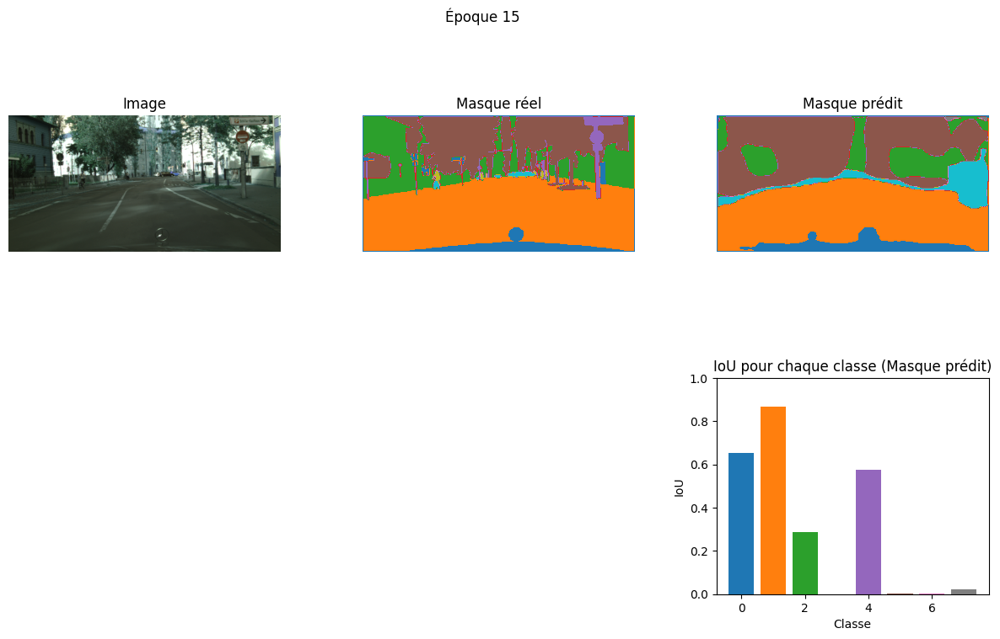

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6518
Classe 1 : IoU = 0.8676
Classe 2 : IoU = 0.2889
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5763
Classe 5 : IoU = 0.0037
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0226
30/30 ━━━━━━━━━━━━━━━━━━━━ 552s 19s/step - accuracy: 0.7799 - dice_coeff: 0.6973 - dice_loss: 0.3027 - jaccard_score: 0.5360 - loss: 0.6450 - total_loss: 2.7297 - val_accuracy: 0.7662 - val_dice_coeff: 0.6685 - val_dice_loss: 0.3315 - val_jaccard_score: 0.5025 - val_loss: 0.6948 - val_total_loss: 2.7868
Epoch 16/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.8018 - dice_coeff: 0.7166 - dice_loss: 0.2834 - jaccard_score: 0.5590 - loss: 0.5913 - total_loss: 2.6802 
Epoch 16: val_jaccard_score did not improve from 0.53003
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


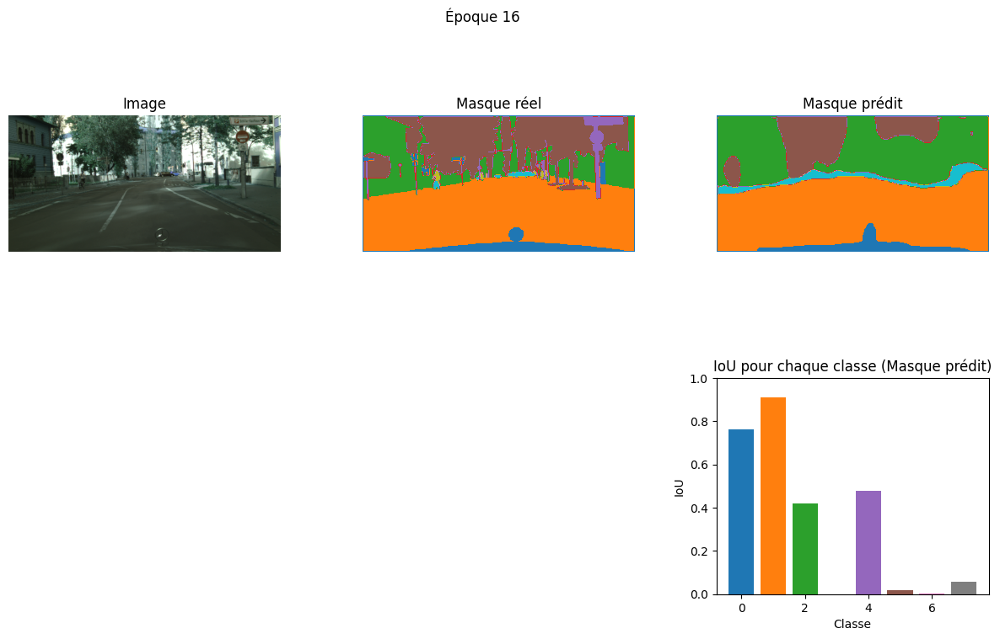

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.7644
Classe 1 : IoU = 0.9103
Classe 2 : IoU = 0.4207
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.4779
Classe 5 : IoU = 0.0175
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0561
30/30 ━━━━━━━━━━━━━━━━━━━━ 545s 18s/step - accuracy: 0.8019 - dice_coeff: 0.7167 - dice_loss: 0.2833 - jaccard_score: 0.5591 - loss: 0.5915 - total_loss: 2.6808 - val_accuracy: 0.7676 - val_dice_coeff: 0.6916 - val_dice_loss: 0.3084 - val_jaccard_score: 0.5290 - val_loss: 0.7099 - val_total_loss: 2.6970
Epoch 17/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.7952 - dice_coeff: 0.7121 - dice_loss: 0.2879 - jaccard_score: 0.5540 - loss: 0.6247 - total_loss: 2.7401 
Epoch 17: val_jaccard_score improved from 0.53003 to 0.55945, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


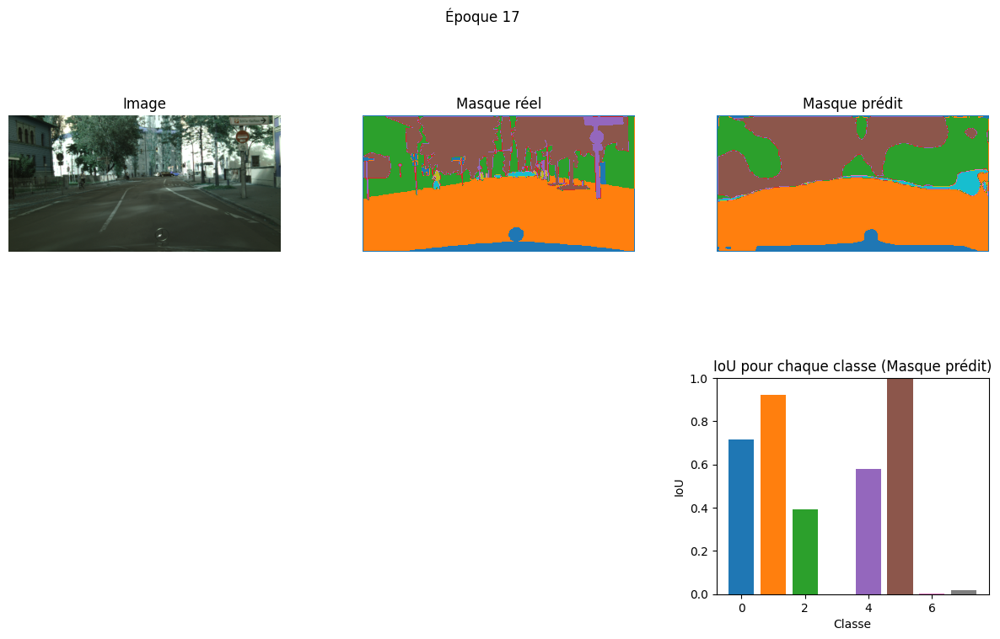

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.7145
Classe 1 : IoU = 0.9211
Classe 2 : IoU = 0.3906
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5791
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0192
30/30 ━━━━━━━━━━━━━━━━━━━━ 551s 18s/step - accuracy: 0.7954 - dice_coeff: 0.7124 - dice_loss: 0.2876 - jaccard_score: 0.5542 - loss: 0.6242 - total_loss: 2.7388 - val_accuracy: 0.7934 - val_dice_coeff: 0.7171 - val_dice_loss: 0.2829 - val_jaccard_score: 0.5595 - val_loss: 0.6552 - val_total_loss: 2.6518
Epoch 18/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.8004 - dice_coeff: 0.7219 - dice_loss: 0.2781 - jaccard_score: 0.5657 - loss: 0.6016 - total_loss: 2.6445 
Epoch 18: val_jaccard_score improved from 0.55945 to 0.56153, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


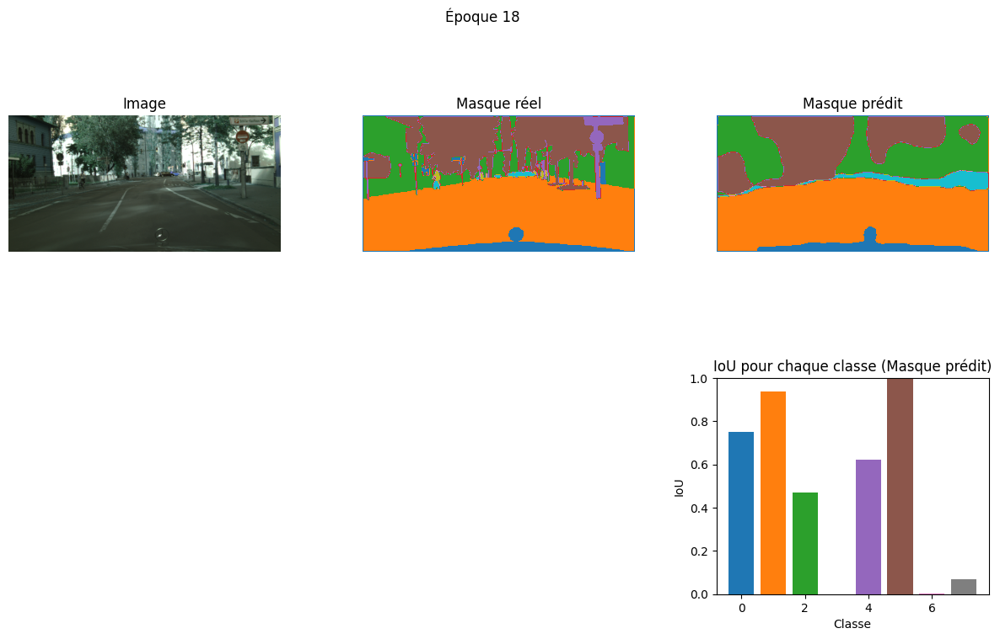

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.7525
Classe 1 : IoU = 0.9370
Classe 2 : IoU = 0.4708
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.6207
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0698
30/30 ━━━━━━━━━━━━━━━━━━━━ 551s 18s/step - accuracy: 0.8005 - dice_coeff: 0.7218 - dice_loss: 0.2782 - jaccard_score: 0.5656 - loss: 0.6017 - total_loss: 2.6446 - val_accuracy: 0.8121 - val_dice_coeff: 0.7188 - val_dice_loss: 0.2812 - val_jaccard_score: 0.5615 - val_loss: 0.6021 - val_total_loss: 2.5745
Epoch 19/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.8295 - dice_coeff: 0.7512 - dice_loss: 0.2488 - jaccard_score: 0.6022 - loss: 0.5359 - total_loss: 2.6277 
Epoch 19: val_jaccard_score did not improve from 0.56153
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


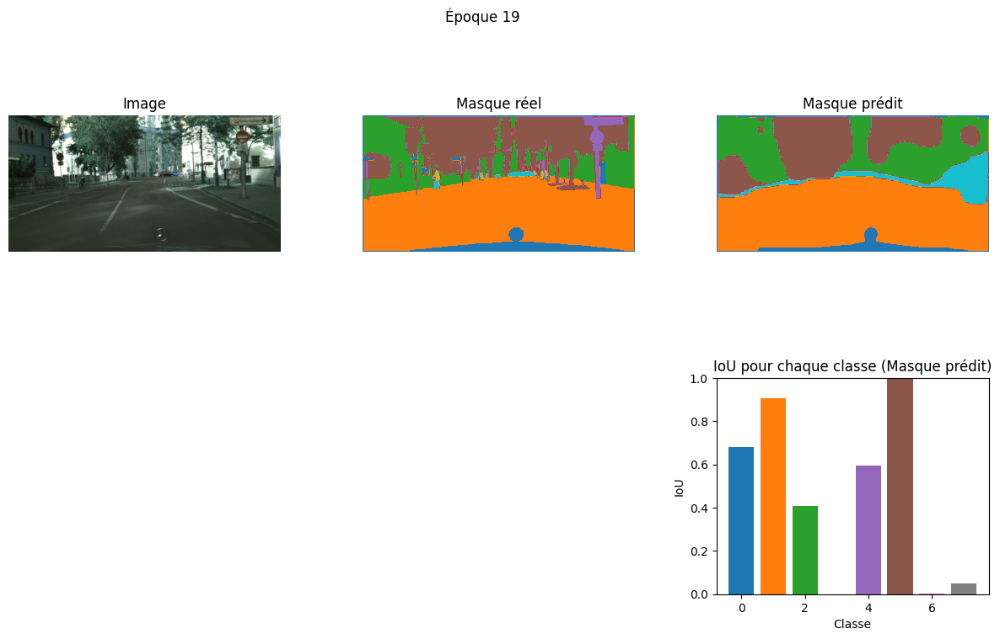

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6816
Classe 1 : IoU = 0.9067
Classe 2 : IoU = 0.4085
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5969
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0488
30/30 ━━━━━━━━━━━━━━━━━━━━ 543s 18s/step - accuracy: 0.8292 - dice_coeff: 0.7508 - dice_loss: 0.2492 - jaccard_score: 0.6017 - loss: 0.5369 - total_loss: 2.6281 - val_accuracy: 0.8040 - val_dice_coeff: 0.7038 - val_dice_loss: 0.2962 - val_jaccard_score: 0.5433 - val_loss: 0.6116 - val_total_loss: 2.5597
Epoch 20/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.8205 - dice_coeff: 0.7316 - dice_loss: 0.2684 - jaccard_score: 0.5772 - loss: 0.5654 - total_loss: 2.5754 
Epoch 20: val_jaccard_score improved from 0.56153 to 0.60000, saving model to best_model_without_data_augmentation.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


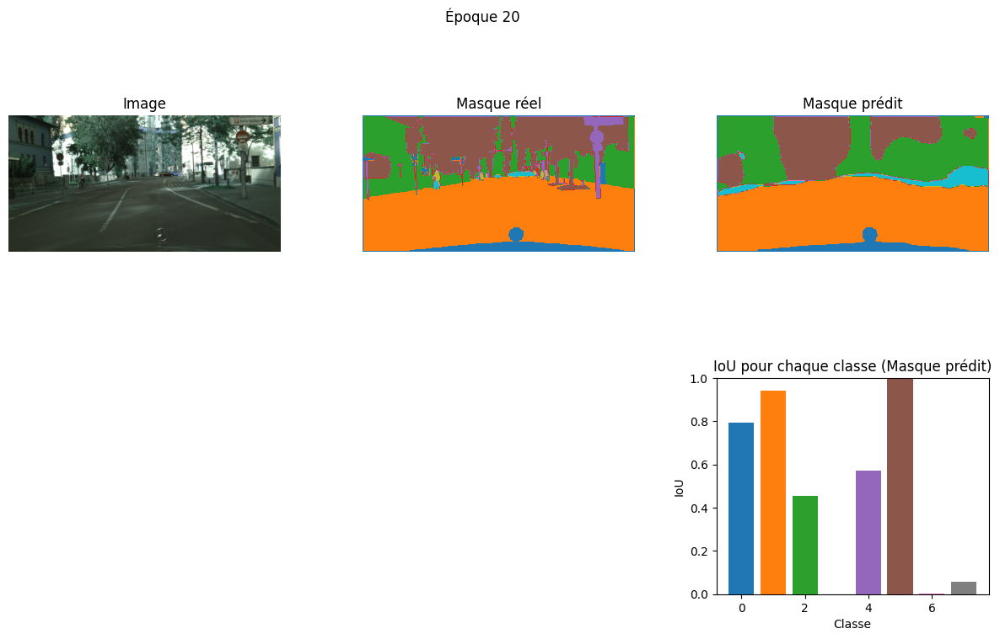

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.7932
Classe 1 : IoU = 0.9414
Classe 2 : IoU = 0.4554
Classe 3 : IoU = 0.0002
Classe 4 : IoU = 0.5733
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 0.0020
Classe 7 : IoU = 0.0582
30/30 ━━━━━━━━━━━━━━━━━━━━ 556s 19s/step - accuracy: 0.8204 - dice_coeff: 0.7317 - dice_loss: 0.2683 - jaccard_score: 0.5773 - loss: 0.5656 - total_loss: 2.5762 - val_accuracy: 0.8182 - val_dice_coeff: 0.7496 - val_dice_loss: 0.2504 - val_jaccard_score: 0.6000 - val_loss: 0.6173 - val_total_loss: 2.6717
Restoring model weights from the end of the best epoch: 20.


In [28]:
# Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 512, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
output = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model = Model(inputs=base_model.input, outputs=output)

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy'])

# Entraînement du modèle avec le callback
history = model.fit(
    images,
    masks,
    batch_size=8,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback()]
)

# Data augmentation

## Avec Albumentations

### Fonctions

In [29]:
# Fonction de data augmentation avec albumentations
def augment_data_albumentations(df):
    images = load_images(df)
    masks = load_masks(df)
    
    # Définir les transformations avec redimensionnement
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),            # Flip horizontal avec probabilité 50%
        A.VerticalFlip(p=0.2),              # Flip vertical avec probabilité 20%
        A.Rotate(limit=10),                 # Rotation aléatoire entre -10 et 10 degrés
        A.RandomScale(scale_limit=0.2),     # Zoom de 80% à 120%
        A.Resize(256, 512)                  # Redimensionnement pour garantir une taille constante
    ])
    
    # Appliquer les transformations sur les images et masques
    images_aug, masks_aug = [], []
    for img, mask in zip(images, masks):
        augmented = transform(image=img, mask=mask)
        images_aug.append(augmented['image'])
        masks_aug.append(augmented['mask'])
    
    return np.array(images_aug), np.array(masks_aug)

In [30]:
# Fonction de data augmentation avec transformations supplémentaires
def augment_data_albumentations_extended(df):
    images = load_images(df)
    masks = load_masks(df)
    
    # Définir les transformations avec des manipulations supplémentaires
    transform = A.Compose([
        # Transformations de la première fonction
        A.HorizontalFlip(p=0.5),                # Flip horizontal avec probabilité 50%
        A.VerticalFlip(p=0.2),                  # Flip vertical avec probabilité 20%
        A.Rotate(limit=10),                     # Rotation aléatoire entre -10 et 10 degrés
        A.RandomScale(scale_limit=0.2),         # Zoom de 80% à 120%
        
        # Transformations supplémentaires
        A.RandomBrightnessContrast(p=0.2),      # Ajuste la luminosité et le contraste
        A.GaussianBlur(blur_limit=(3, 7), p=0.2), # Applique un flou gaussien avec une certaine probabilité
        A.HueSaturationValue(p=0.3),            # Modifie la teinte, la saturation et la valeur des couleurs
        A.ElasticTransform(p=0.1),              # Applique des distorsions élastiques (déformation non linéaire)
        A.GridDistortion(p=0.1),                # Applique une distorsion en grille pour un effet de déformation
        A.Resize(256, 512)                      # Redimensionnement pour garantir une taille constante
    ])
    
    # Appliquer les transformations sur les images et masques
    images_aug, masks_aug = [], []
    for img, mask in zip(images, masks):
        augmented = transform(image=img, mask=mask)
        images_aug.append(augmented['image'])
        masks_aug.append(augmented['mask'])
    
    return np.array(images_aug), np.array(masks_aug)

### Entraînement du modèle

#### Entraînement 1

In [31]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [32]:
filename = f"best_model_albumentations_1.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [33]:
# Utilisation de la fonction d'augmentation avec albumentations
images_aug, masks_aug = augment_data_albumentations(df_train_sample)

Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.6193 - dice_coeff: 0.4951 - dice_loss: 0.5049 - jaccard_score: 0.3356 - loss: 1.2945 - total_loss: 2.8567 
Epoch 1: val_jaccard_score improved from -inf to 0.16670, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


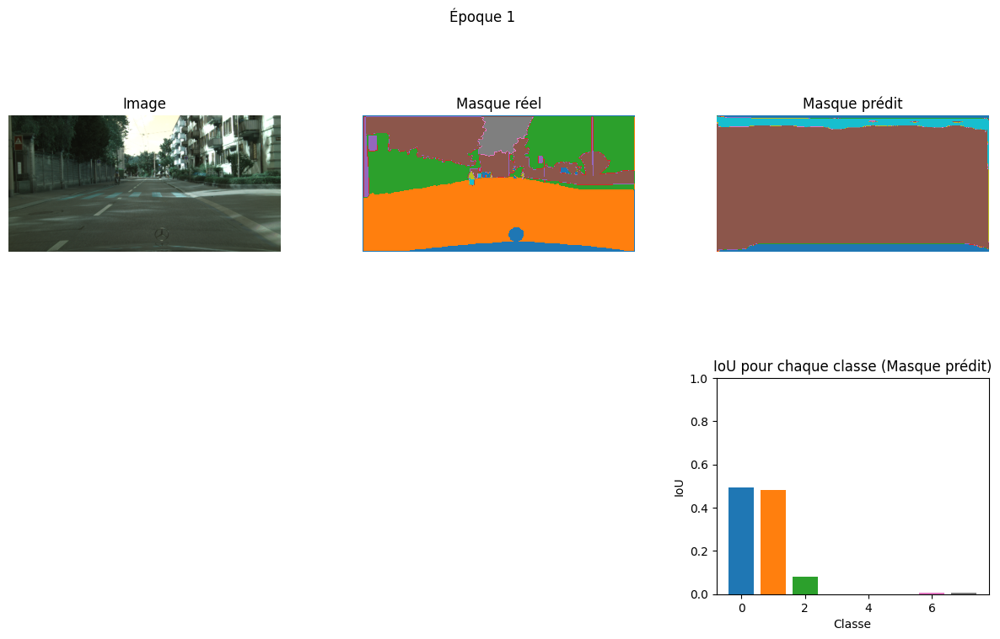

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4921
Classe 1 : IoU = 0.4819
Classe 2 : IoU = 0.0798
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 0.0002
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0058
30/30 ━━━━━━━━━━━━━━━━━━━━ 558s 19s/step - accuracy: 0.6170 - dice_coeff: 0.4926 - dice_loss: 0.5074 - jaccard_score: 0.3335 - loss: 1.2971 - total_loss: 2.8588 - val_accuracy: 0.4230 - val_dice_coeff: 0.2856 - val_dice_loss: 0.7144 - val_jaccard_score: 0.1667 - val_loss: 1.5887 - val_total_loss: 3.2507
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4389 - dice_coeff: 0.2999 - dice_loss: 0.7001 - jaccard_score: 0.1771 - loss: 1.5327 - total_loss: 3.2262 
Epoch 2: val_jaccard_score improved from 0.16670 to 0.23389, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


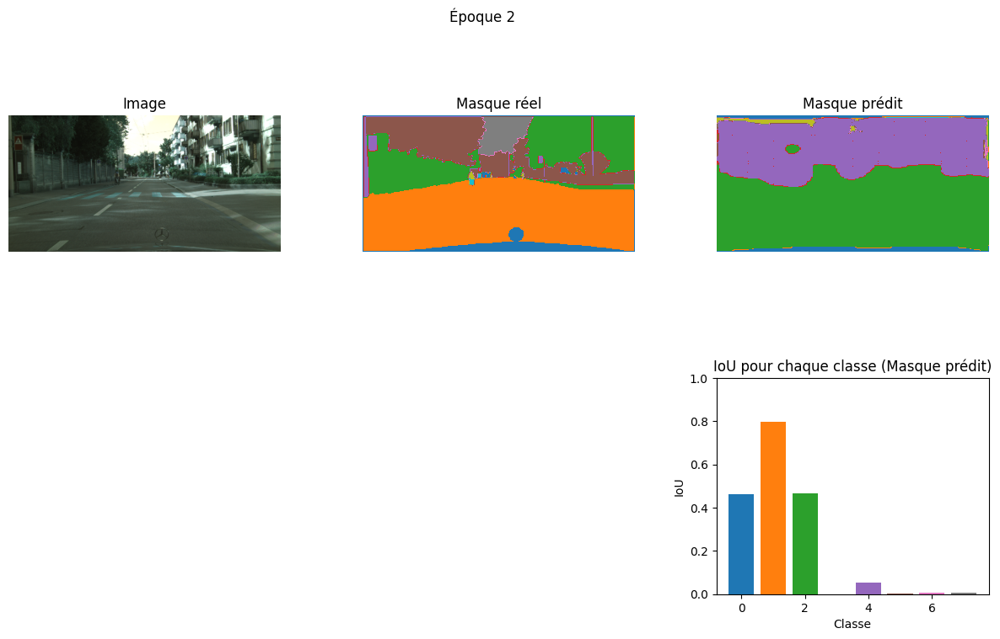

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4638
Classe 1 : IoU = 0.7964
Classe 2 : IoU = 0.4646
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.0553
Classe 5 : IoU = 0.0028
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0058
30/30 ━━━━━━━━━━━━━━━━━━━━ 554s 19s/step - accuracy: 0.4398 - dice_coeff: 0.3008 - dice_loss: 0.6992 - jaccard_score: 0.1777 - loss: 1.5304 - total_loss: 3.2252 - val_accuracy: 0.5150 - val_dice_coeff: 0.3786 - val_dice_loss: 0.6214 - val_jaccard_score: 0.2339 - val_loss: 1.3165 - val_total_loss: 3.0509
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.5488 - dice_coeff: 0.4382 - dice_loss: 0.5618 - jaccard_score: 0.2818 - loss: 1.2204 - total_loss: 2.9441 
Epoch 3: val_jaccard_score improved from 0.23389 to 0.30368, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


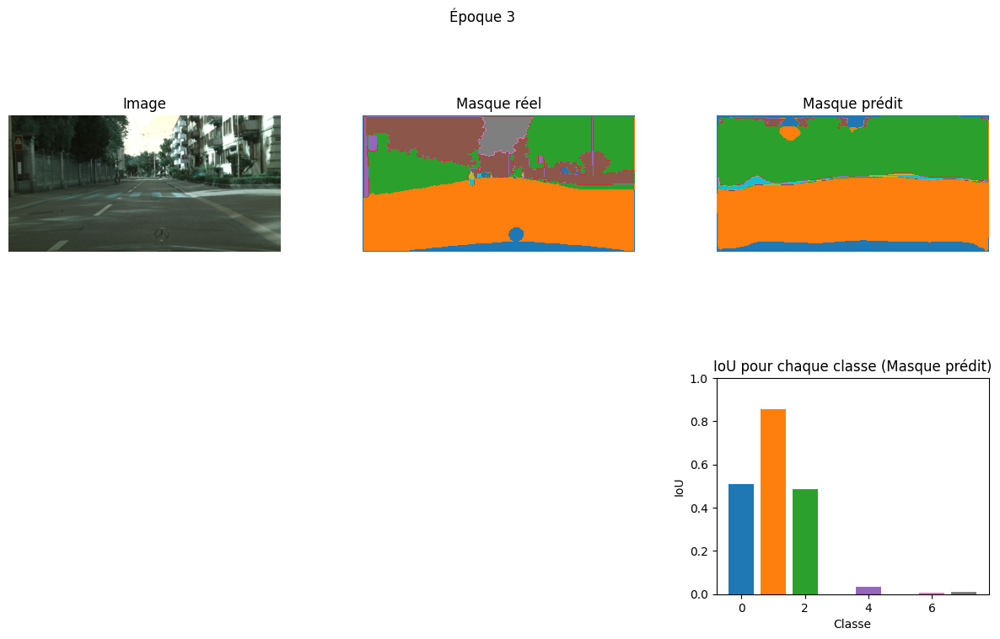

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5112
Classe 1 : IoU = 0.8549
Classe 2 : IoU = 0.4856
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.0351
Classe 5 : IoU = 0.0002
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0087
30/30 ━━━━━━━━━━━━━━━━━━━━ 547s 18s/step - accuracy: 0.5493 - dice_coeff: 0.4390 - dice_loss: 0.5610 - jaccard_score: 0.2824 - loss: 1.2189 - total_loss: 2.9411 - val_accuracy: 0.5634 - val_dice_coeff: 0.4653 - val_dice_loss: 0.5347 - val_jaccard_score: 0.3037 - val_loss: 1.1706 - val_total_loss: 2.4872
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6025 - dice_coeff: 0.4962 - dice_loss: 0.5038 - jaccard_score: 0.3307 - loss: 1.0619 - total_loss: 2.5924 
Epoch 4: val_jaccard_score improved from 0.30368 to 0.32269, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


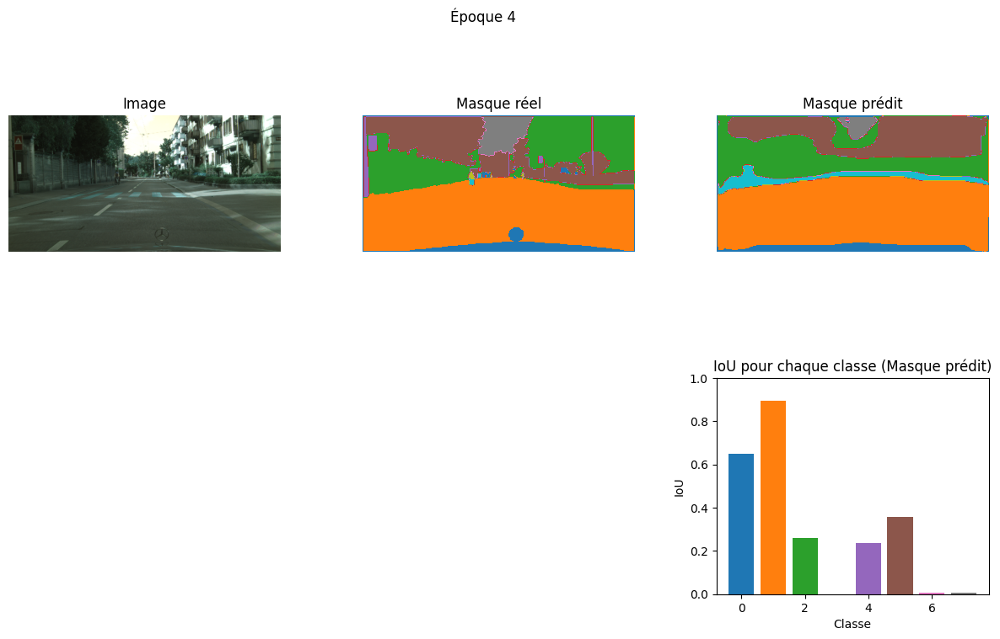

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6496
Classe 1 : IoU = 0.8933
Classe 2 : IoU = 0.2605
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.2351
Classe 5 : IoU = 0.3592
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0070
30/30 ━━━━━━━━━━━━━━━━━━━━ 544s 18s/step - accuracy: 0.6026 - dice_coeff: 0.4965 - dice_loss: 0.5035 - jaccard_score: 0.3310 - loss: 1.0614 - total_loss: 2.5964 - val_accuracy: 0.6000 - val_dice_coeff: 0.4874 - val_dice_loss: 0.5126 - val_jaccard_score: 0.3227 - val_loss: 1.0283 - val_total_loss: 2.7830
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6326 - dice_coeff: 0.5231 - dice_loss: 0.4769 - jaccard_score: 0.3547 - loss: 0.9800 - total_loss: 2.7897 
Epoch 5: val_jaccard_score improved from 0.32269 to 0.40557, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


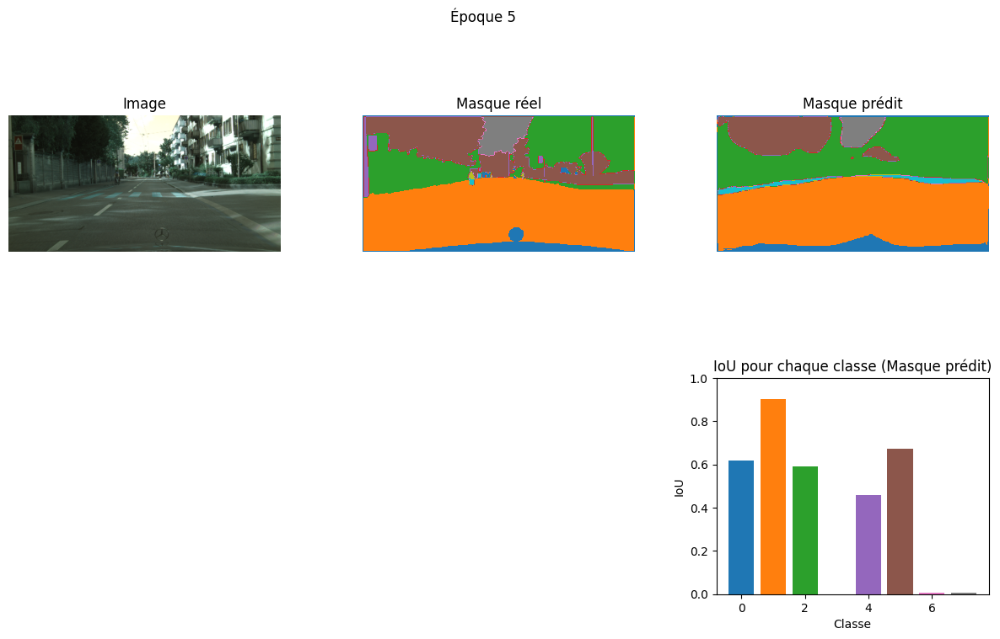

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6201
Classe 1 : IoU = 0.9031
Classe 2 : IoU = 0.5901
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.4604
Classe 5 : IoU = 0.6736
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0057
30/30 ━━━━━━━━━━━━━━━━━━━━ 546s 18s/step - accuracy: 0.6332 - dice_coeff: 0.5237 - dice_loss: 0.4763 - jaccard_score: 0.3553 - loss: 0.9791 - total_loss: 2.7891 - val_accuracy: 0.6874 - val_dice_coeff: 0.5760 - val_dice_loss: 0.4240 - val_jaccard_score: 0.4056 - val_loss: 0.8731 - val_total_loss: 2.6360
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6831 - dice_coeff: 0.5723 - dice_loss: 0.4277 - jaccard_score: 0.4033 - loss: 0.9173 - total_loss: 2.6919 
Epoch 6: val_jaccard_score did not improve from 0.40557
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


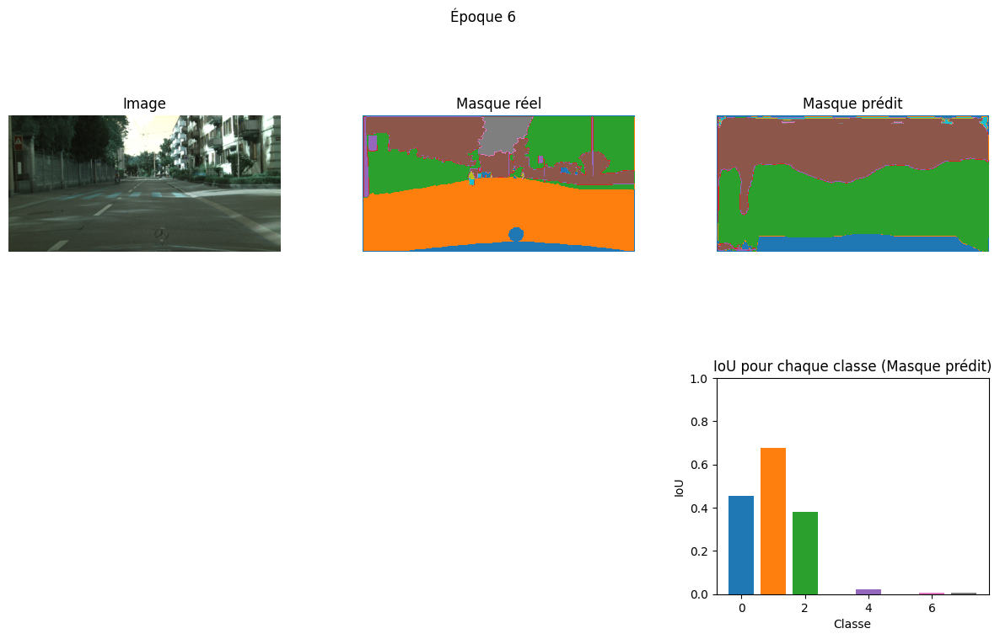

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4554
Classe 1 : IoU = 0.6775
Classe 2 : IoU = 0.3800
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.0220
Classe 5 : IoU = 0.0002
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0058
30/30 ━━━━━━━━━━━━━━━━━━━━ 546s 18s/step - accuracy: 0.6812 - dice_coeff: 0.5704 - dice_loss: 0.4296 - jaccard_score: 0.4017 - loss: 0.9245 - total_loss: 2.6961 - val_accuracy: 0.4957 - val_dice_coeff: 0.2577 - val_dice_loss: 0.7423 - val_jaccard_score: 0.1481 - val_loss: 1.5581 - val_total_loss: 3.1031
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.4958 - dice_coeff: 0.3204 - dice_loss: 0.6796 - jaccard_score: 0.1932 - loss: 1.4722 - total_loss: 3.1378 
Epoch 7: val_jaccard_score did not improve from 0.40557
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


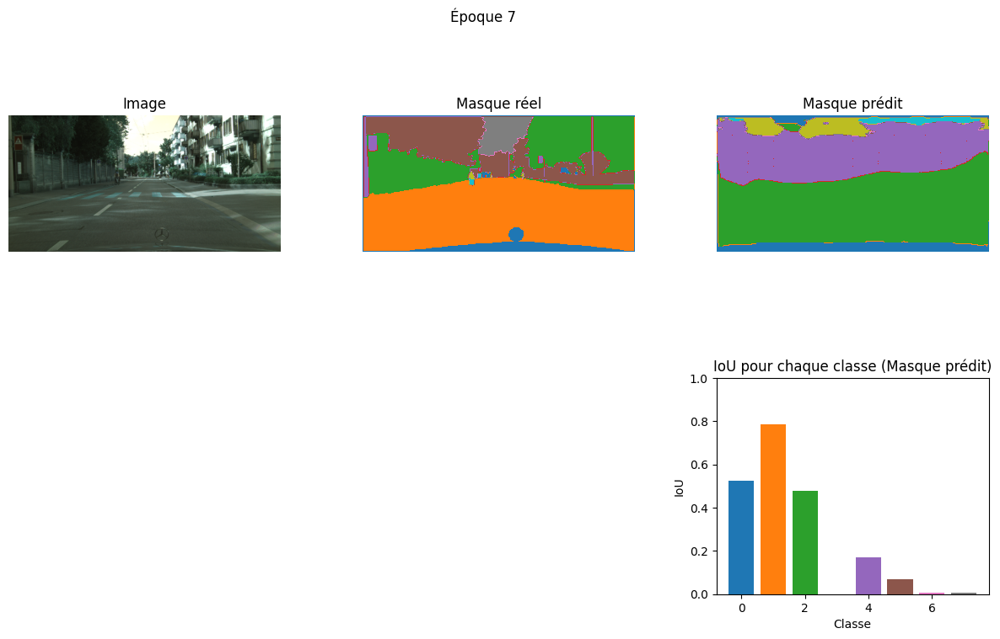

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5238
Classe 1 : IoU = 0.7853
Classe 2 : IoU = 0.4791
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.1722
Classe 5 : IoU = 0.0686
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0058
30/30 ━━━━━━━━━━━━━━━━━━━━ 547s 18s/step - accuracy: 0.4967 - dice_coeff: 0.3223 - dice_loss: 0.6777 - jaccard_score: 0.1946 - loss: 1.4682 - total_loss: 3.1378 - val_accuracy: 0.5622 - val_dice_coeff: 0.4618 - val_dice_loss: 0.5382 - val_jaccard_score: 0.3008 - val_loss: 1.2133 - val_total_loss: 3.4053
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.5375 - dice_coeff: 0.4160 - dice_loss: 0.5840 - jaccard_score: 0.2647 - loss: 1.2842 - total_loss: 3.2119 
Epoch 8: val_jaccard_score did not improve from 0.40557
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


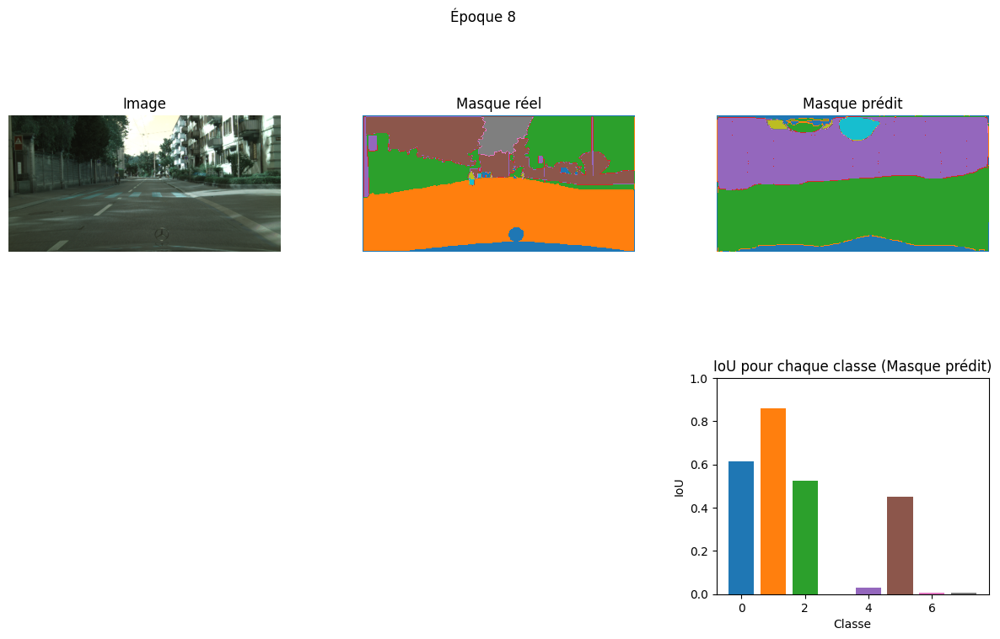

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6155
Classe 1 : IoU = 0.8581
Classe 2 : IoU = 0.5232
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.0320
Classe 5 : IoU = 0.4527
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0058
30/30 ━━━━━━━━━━━━━━━━━━━━ 573s 19s/step - accuracy: 0.5386 - dice_coeff: 0.4170 - dice_loss: 0.5830 - jaccard_score: 0.2656 - loss: 1.2810 - total_loss: 3.2057 - val_accuracy: 0.5821 - val_dice_coeff: 0.4996 - val_dice_loss: 0.5004 - val_jaccard_score: 0.3336 - val_loss: 1.1102 - val_total_loss: 2.9011
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.6113 - dice_coeff: 0.5046 - dice_loss: 0.4954 - jaccard_score: 0.3377 - loss: 1.0576 - total_loss: 2.8376 
Epoch 9: val_jaccard_score did not improve from 0.40557
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


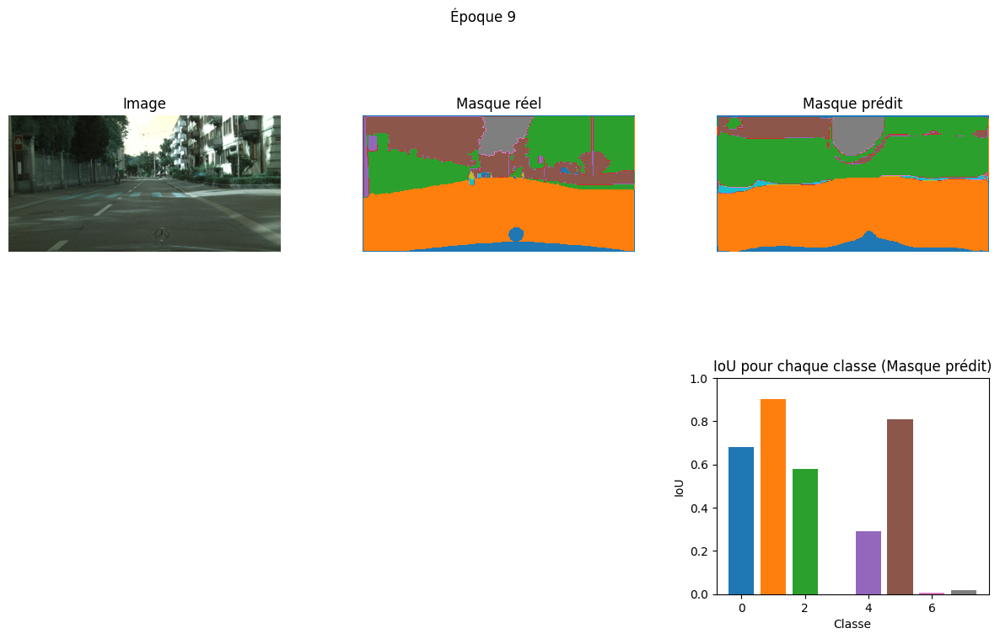

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6804
Classe 1 : IoU = 0.9043
Classe 2 : IoU = 0.5776
Classe 3 : IoU = 0.0004
Classe 4 : IoU = 0.2921
Classe 5 : IoU = 0.8081
Classe 6 : IoU = 0.0050
Classe 7 : IoU = 0.0169
30/30 ━━━━━━━━━━━━━━━━━━━━ 559s 19s/step - accuracy: 0.6116 - dice_coeff: 0.5049 - dice_loss: 0.4951 - jaccard_score: 0.3380 - loss: 1.0564 - total_loss: 2.8378 - val_accuracy: 0.6343 - val_dice_coeff: 0.5247 - val_dice_loss: 0.4753 - val_jaccard_score: 0.3562 - val_loss: 0.9508 - val_total_loss: 2.7458
Epoch 9: early stopping
Restoring model weights from the end of the best epoch: 5.


In [34]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback()]
)

#### Entraînement 2

In [35]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [36]:
filename = f"best_model_albumentations_2.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [37]:
# Utilisation de la fonction d'augmentation avec transformations supplémentaires avec albumentations
images_aug, masks_aug = augment_data_albumentations_extended(df_train_sample)

Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.6542 - dice_coeff: 0.5466 - dice_loss: 0.4534 - jaccard_score: 0.3767 - loss: 0.9729 - total_loss: 2.7211 
Epoch 1: val_jaccard_score improved from -inf to 0.35072, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


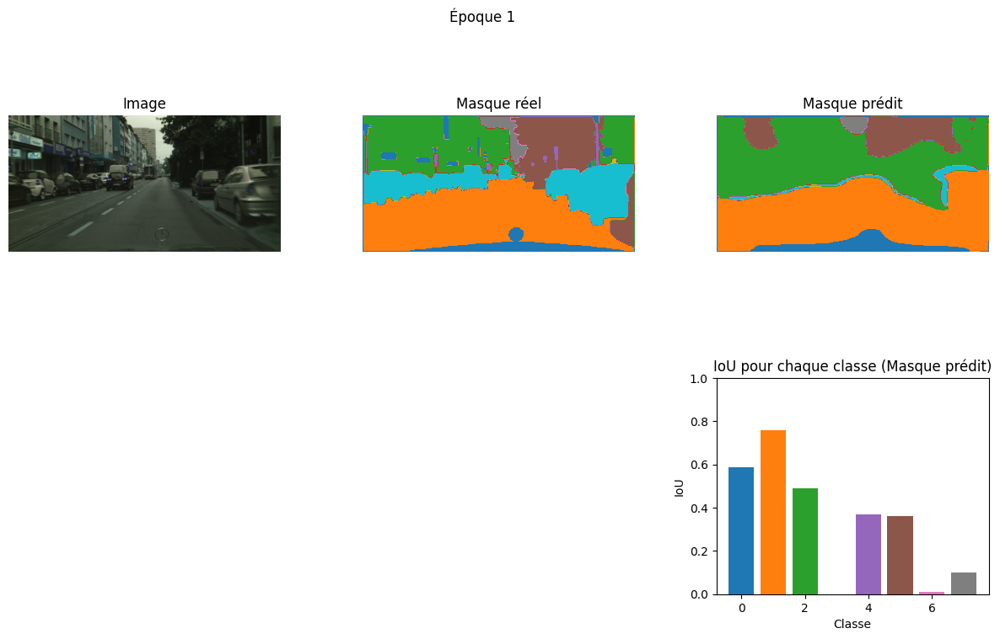

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5855
Classe 1 : IoU = 0.7585
Classe 2 : IoU = 0.4880
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.3675
Classe 5 : IoU = 0.3626
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.1004
30/30 ━━━━━━━━━━━━━━━━━━━━ 583s 19s/step - accuracy: 0.6544 - dice_coeff: 0.5466 - dice_loss: 0.4534 - jaccard_score: 0.3767 - loss: 0.9724 - total_loss: 2.7230 - val_accuracy: 0.6378 - val_dice_coeff: 0.5189 - val_dice_loss: 0.4811 - val_jaccard_score: 0.3507 - val_loss: 0.9595 - val_total_loss: 2.7234
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.6667 - dice_coeff: 0.5600 - dice_loss: 0.4400 - jaccard_score: 0.3895 - loss: 0.9177 - total_loss: 2.7163 
Epoch 2: val_jaccard_score improved from 0.35072 to 0.38737, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


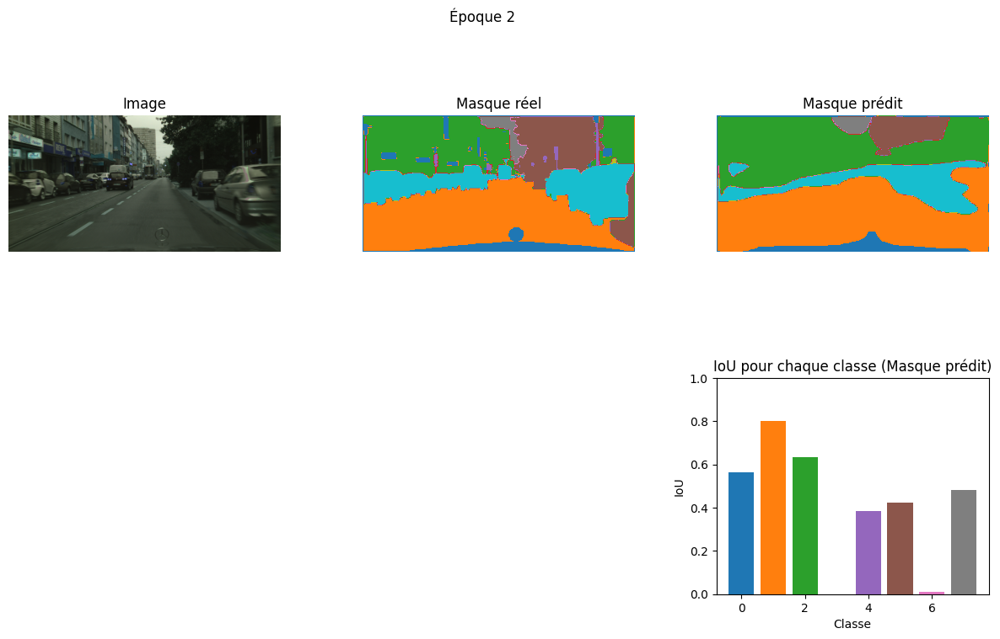

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5647
Classe 1 : IoU = 0.8005
Classe 2 : IoU = 0.6347
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.3830
Classe 5 : IoU = 0.4251
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.4819
30/30 ━━━━━━━━━━━━━━━━━━━━ 571s 19s/step - accuracy: 0.6670 - dice_coeff: 0.5603 - dice_loss: 0.4397 - jaccard_score: 0.3898 - loss: 0.9173 - total_loss: 2.7162 - val_accuracy: 0.6858 - val_dice_coeff: 0.5580 - val_dice_loss: 0.4420 - val_jaccard_score: 0.3874 - val_loss: 0.8892 - val_total_loss: 2.6348
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.7046 - dice_coeff: 0.5954 - dice_loss: 0.4046 - jaccard_score: 0.4242 - loss: 0.8391 - total_loss: 2.6587 
Epoch 3: val_jaccard_score improved from 0.38737 to 0.44714, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


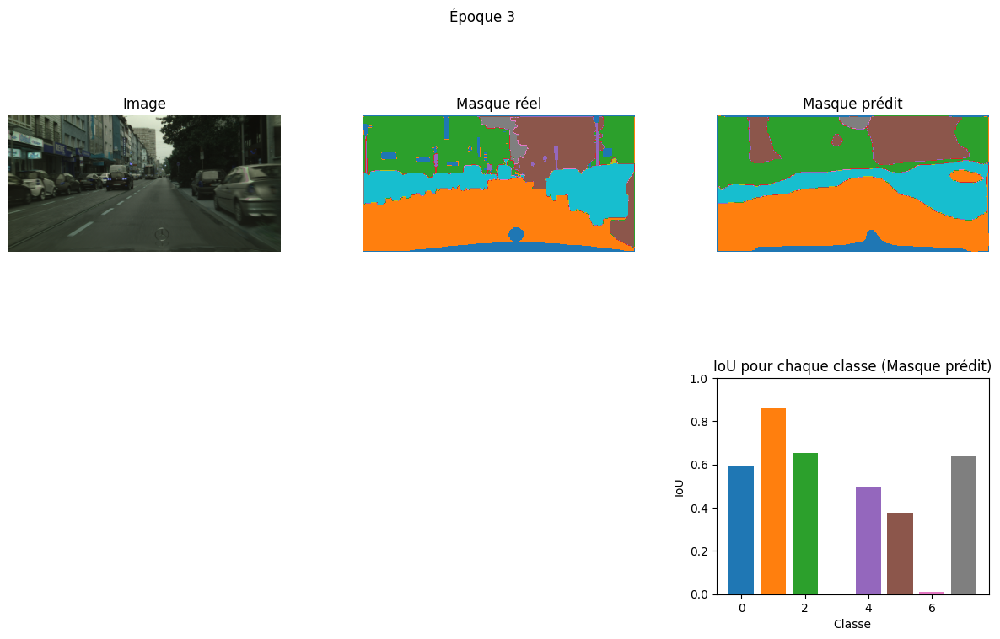

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5897
Classe 1 : IoU = 0.8602
Classe 2 : IoU = 0.6518
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.4963
Classe 5 : IoU = 0.3776
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.6395
30/30 ━━━━━━━━━━━━━━━━━━━━ 585s 20s/step - accuracy: 0.7049 - dice_coeff: 0.5958 - dice_loss: 0.4042 - jaccard_score: 0.4246 - loss: 0.8384 - total_loss: 2.6582 - val_accuracy: 0.7182 - val_dice_coeff: 0.6176 - val_dice_loss: 0.3824 - val_jaccard_score: 0.4471 - val_loss: 0.8205 - val_total_loss: 2.6750
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7198 - dice_coeff: 0.6168 - dice_loss: 0.3832 - jaccard_score: 0.4467 - loss: 0.8137 - total_loss: 2.6442 
Epoch 4: val_jaccard_score did not improve from 0.44714
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


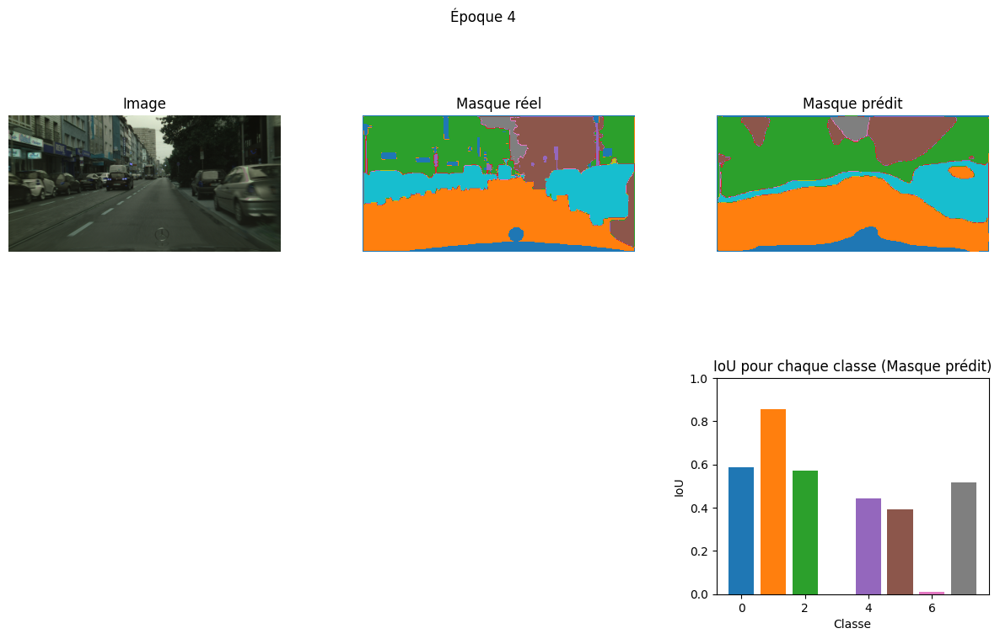

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5889
Classe 1 : IoU = 0.8573
Classe 2 : IoU = 0.5735
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.4445
Classe 5 : IoU = 0.3917
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.5168
30/30 ━━━━━━━━━━━━━━━━━━━━ 546s 18s/step - accuracy: 0.7196 - dice_coeff: 0.6166 - dice_loss: 0.3834 - jaccard_score: 0.4465 - loss: 0.8141 - total_loss: 2.6442 - val_accuracy: 0.7108 - val_dice_coeff: 0.5888 - val_dice_loss: 0.4112 - val_jaccard_score: 0.4178 - val_loss: 0.8296 - val_total_loss: 2.6841
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7260 - dice_coeff: 0.6220 - dice_loss: 0.3780 - jaccard_score: 0.4521 - loss: 0.7946 - total_loss: 2.6948 
Epoch 5: val_jaccard_score did not improve from 0.44714
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


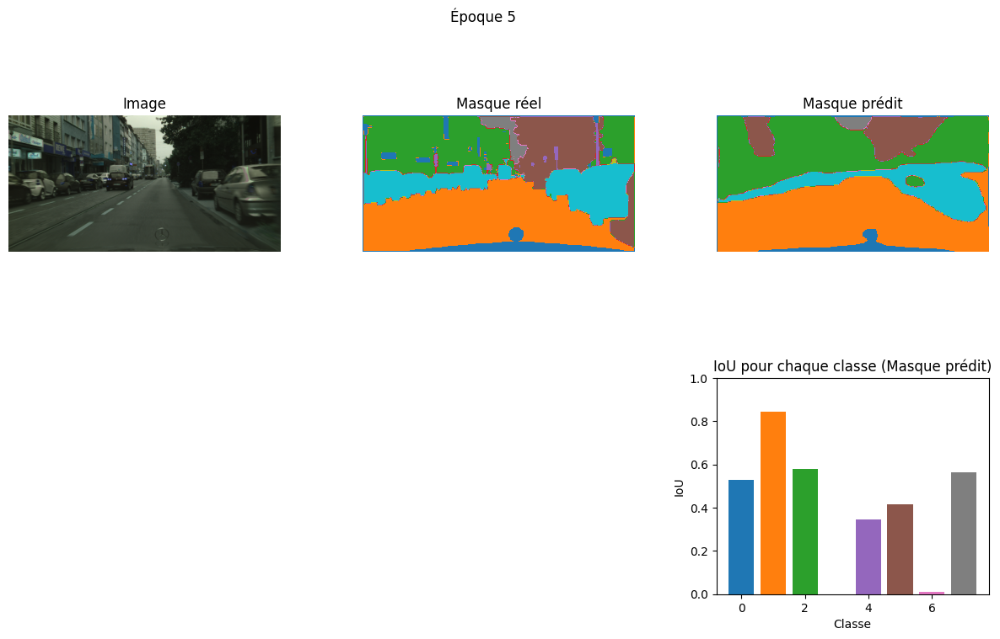

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5279
Classe 1 : IoU = 0.8434
Classe 2 : IoU = 0.5798
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.3442
Classe 5 : IoU = 0.4157
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.5643
30/30 ━━━━━━━━━━━━━━━━━━━━ 555s 18s/step - accuracy: 0.7252 - dice_coeff: 0.6212 - dice_loss: 0.3788 - jaccard_score: 0.4513 - loss: 0.7965 - total_loss: 2.6950 - val_accuracy: 0.6681 - val_dice_coeff: 0.5360 - val_dice_loss: 0.4640 - val_jaccard_score: 0.3665 - val_loss: 0.9327 - val_total_loss: 2.7213
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7244 - dice_coeff: 0.6016 - dice_loss: 0.3984 - jaccard_score: 0.4312 - loss: 0.8170 - total_loss: 2.6840 
Epoch 6: val_jaccard_score did not improve from 0.44714
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


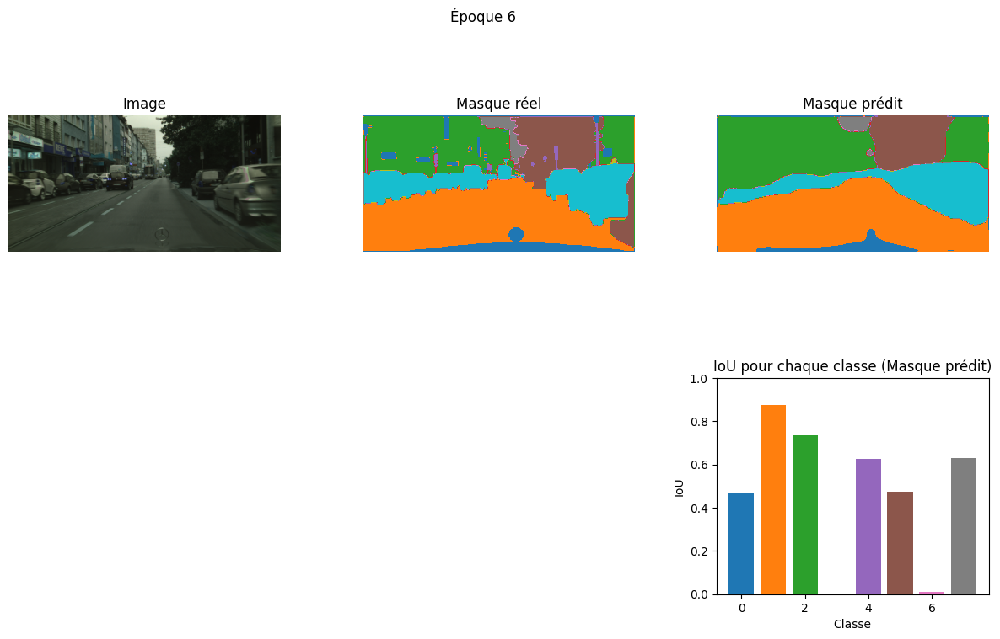

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4685
Classe 1 : IoU = 0.8748
Classe 2 : IoU = 0.7336
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6257
Classe 5 : IoU = 0.4728
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.6293
30/30 ━━━━━━━━━━━━━━━━━━━━ 544s 18s/step - accuracy: 0.7246 - dice_coeff: 0.6021 - dice_loss: 0.3979 - jaccard_score: 0.4317 - loss: 0.8167 - total_loss: 2.6821 - val_accuracy: 0.7211 - val_dice_coeff: 0.6061 - val_dice_loss: 0.3939 - val_jaccard_score: 0.4351 - val_loss: 0.8102 - val_total_loss: 2.5505
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.7407 - dice_coeff: 0.6397 - dice_loss: 0.3603 - jaccard_score: 0.4711 - loss: 0.7692 - total_loss: 2.5311 
Epoch 7: val_jaccard_score improved from 0.44714 to 0.46248, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


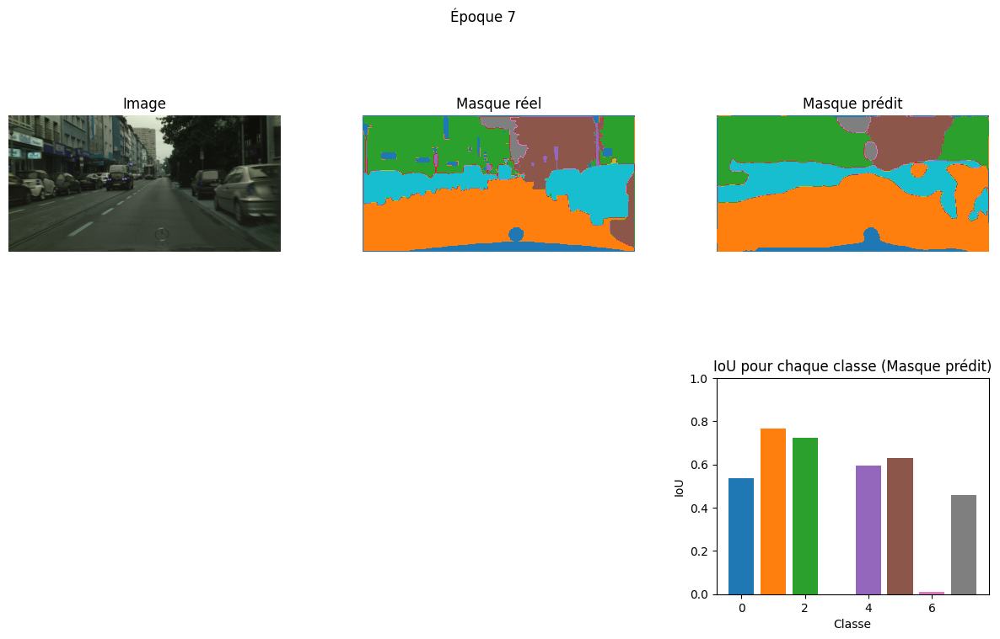

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5376
Classe 1 : IoU = 0.7652
Classe 2 : IoU = 0.7230
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.5951
Classe 5 : IoU = 0.6318
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.4569
30/30 ━━━━━━━━━━━━━━━━━━━━ 569s 19s/step - accuracy: 0.7409 - dice_coeff: 0.6398 - dice_loss: 0.3602 - jaccard_score: 0.4712 - loss: 0.7690 - total_loss: 2.5311 - val_accuracy: 0.7406 - val_dice_coeff: 0.6322 - val_dice_loss: 0.3678 - val_jaccard_score: 0.4625 - val_loss: 0.7776 - val_total_loss: 2.4977
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.7639 - dice_coeff: 0.6632 - dice_loss: 0.3368 - jaccard_score: 0.4967 - loss: 0.7072 - total_loss: 2.4747 
Epoch 8: val_jaccard_score improved from 0.46248 to 0.48970, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


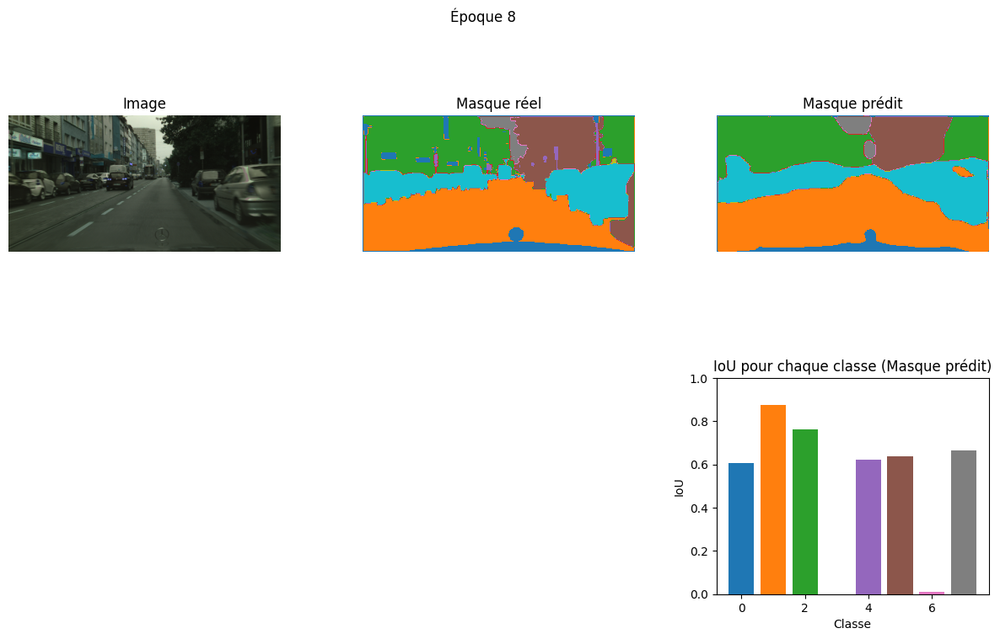

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6064
Classe 1 : IoU = 0.8737
Classe 2 : IoU = 0.7633
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6205
Classe 5 : IoU = 0.6368
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.6652
30/30 ━━━━━━━━━━━━━━━━━━━━ 591s 20s/step - accuracy: 0.7638 - dice_coeff: 0.6632 - dice_loss: 0.3368 - jaccard_score: 0.4967 - loss: 0.7074 - total_loss: 2.4741 - val_accuracy: 0.7567 - val_dice_coeff: 0.6572 - val_dice_loss: 0.3428 - val_jaccard_score: 0.4897 - val_loss: 0.7371 - val_total_loss: 2.4302
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.7745 - dice_coeff: 0.6774 - dice_loss: 0.3226 - jaccard_score: 0.5127 - loss: 0.6802 - total_loss: 2.4383 
Epoch 9: val_jaccard_score improved from 0.48970 to 0.49963, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


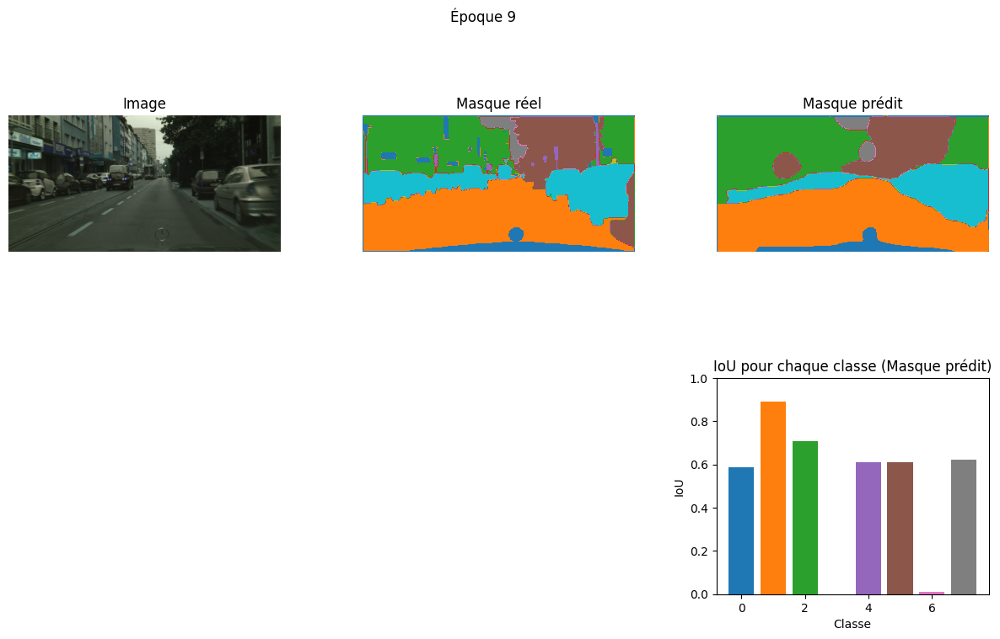

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5881
Classe 1 : IoU = 0.8893
Classe 2 : IoU = 0.7077
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6107
Classe 5 : IoU = 0.6102
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.6224
30/30 ━━━━━━━━━━━━━━━━━━━━ 552s 18s/step - accuracy: 0.7743 - dice_coeff: 0.6772 - dice_loss: 0.3228 - jaccard_score: 0.5124 - loss: 0.6807 - total_loss: 2.4392 - val_accuracy: 0.7427 - val_dice_coeff: 0.6658 - val_dice_loss: 0.3342 - val_jaccard_score: 0.4996 - val_loss: 0.7801 - val_total_loss: 2.6573
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.7756 - dice_coeff: 0.6833 - dice_loss: 0.3167 - jaccard_score: 0.5195 - loss: 0.6800 - total_loss: 2.4861 
Epoch 10: val_jaccard_score improved from 0.49963 to 0.50872, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


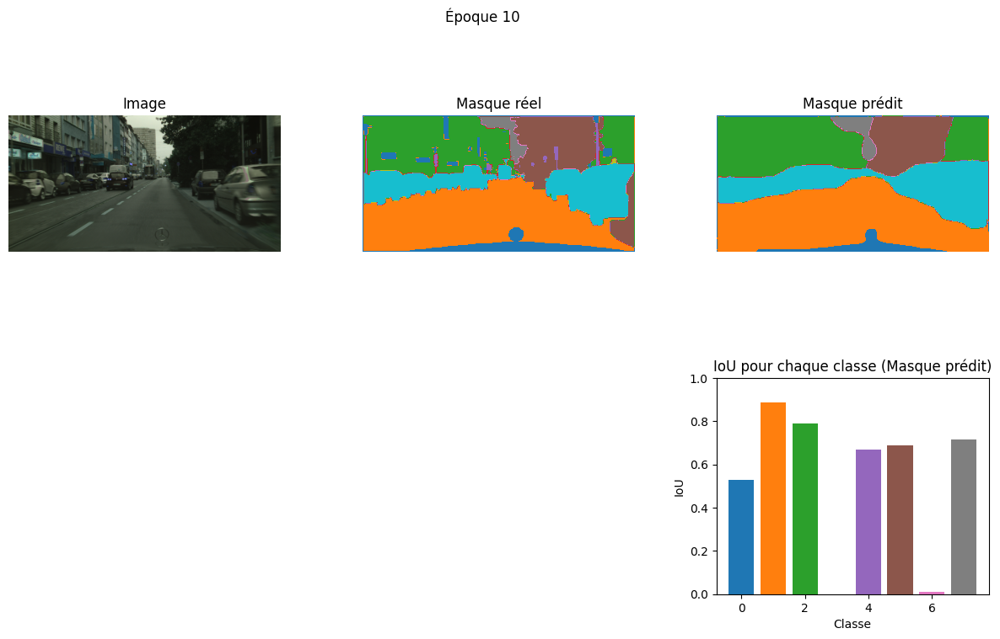

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5277
Classe 1 : IoU = 0.8872
Classe 2 : IoU = 0.7910
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6710
Classe 5 : IoU = 0.6870
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7155
30/30 ━━━━━━━━━━━━━━━━━━━━ 604s 20s/step - accuracy: 0.7756 - dice_coeff: 0.6832 - dice_loss: 0.3168 - jaccard_score: 0.5194 - loss: 0.6801 - total_loss: 2.4851 - val_accuracy: 0.7674 - val_dice_coeff: 0.6740 - val_dice_loss: 0.3260 - val_jaccard_score: 0.5087 - val_loss: 0.7105 - val_total_loss: 2.4576
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.7790 - dice_coeff: 0.6856 - dice_loss: 0.3144 - jaccard_score: 0.5222 - loss: 0.6618 - total_loss: 2.5274 
Epoch 11: val_jaccard_score did not improve from 0.50872
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


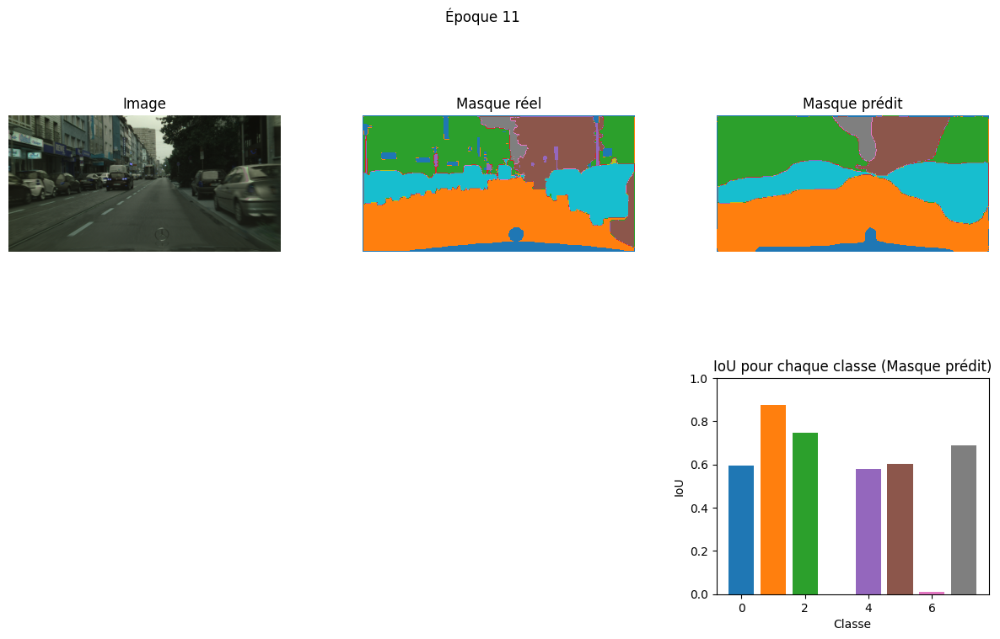

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5932
Classe 1 : IoU = 0.8747
Classe 2 : IoU = 0.7482
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.5811
Classe 5 : IoU = 0.6048
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.6897
30/30 ━━━━━━━━━━━━━━━━━━━━ 561s 19s/step - accuracy: 0.7789 - dice_coeff: 0.6855 - dice_loss: 0.3145 - jaccard_score: 0.5221 - loss: 0.6622 - total_loss: 2.5282 - val_accuracy: 0.7632 - val_dice_coeff: 0.6716 - val_dice_loss: 0.3284 - val_jaccard_score: 0.5059 - val_loss: 0.7359 - val_total_loss: 2.4517
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.7847 - dice_coeff: 0.6872 - dice_loss: 0.3128 - jaccard_score: 0.5242 - loss: 0.6589 - total_loss: 2.4483 
Epoch 12: val_jaccard_score did not improve from 0.50872
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


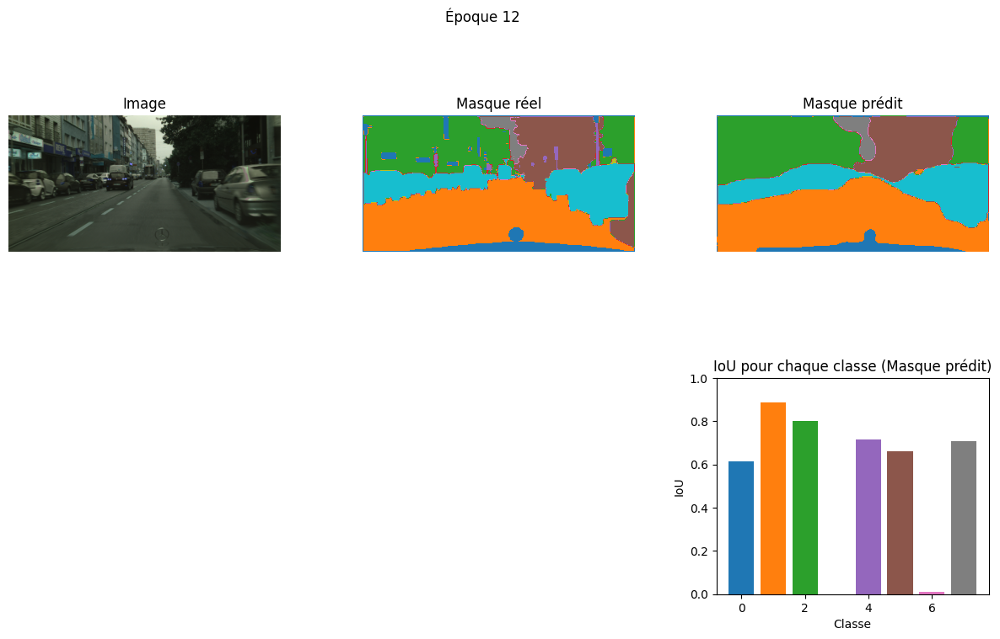

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6162
Classe 1 : IoU = 0.8874
Classe 2 : IoU = 0.8018
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.7154
Classe 5 : IoU = 0.6623
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7087
30/30 ━━━━━━━━━━━━━━━━━━━━ 580s 19s/step - accuracy: 0.7847 - dice_coeff: 0.6874 - dice_loss: 0.3126 - jaccard_score: 0.5243 - loss: 0.6587 - total_loss: 2.4492 - val_accuracy: 0.7722 - val_dice_coeff: 0.6711 - val_dice_loss: 0.3289 - val_jaccard_score: 0.5053 - val_loss: 0.7024 - val_total_loss: 2.5159
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.8085 - dice_coeff: 0.7168 - dice_loss: 0.2832 - jaccard_score: 0.5594 - loss: 0.5882 - total_loss: 2.4409 
Epoch 13: val_jaccard_score improved from 0.50872 to 0.52064, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


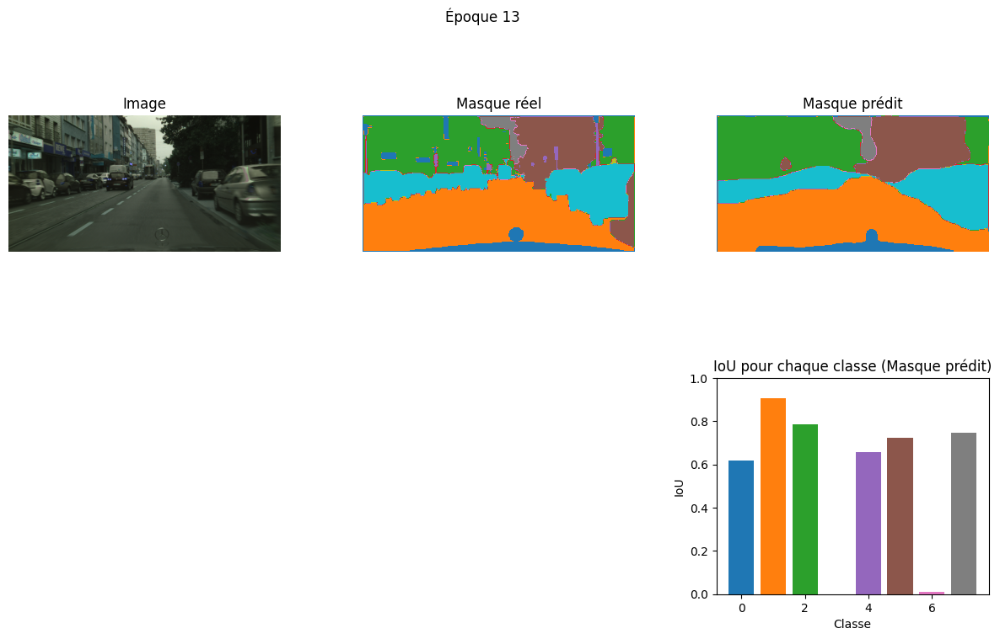

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6168
Classe 1 : IoU = 0.9078
Classe 2 : IoU = 0.7870
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6579
Classe 5 : IoU = 0.7250
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7482
30/30 ━━━━━━━━━━━━━━━━━━━━ 585s 20s/step - accuracy: 0.8082 - dice_coeff: 0.7167 - dice_loss: 0.2833 - jaccard_score: 0.5592 - loss: 0.5888 - total_loss: 2.4416 - val_accuracy: 0.7654 - val_dice_coeff: 0.6845 - val_dice_loss: 0.3155 - val_jaccard_score: 0.5206 - val_loss: 0.7108 - val_total_loss: 2.6758
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.7978 - dice_coeff: 0.7120 - dice_loss: 0.2880 - jaccard_score: 0.5532 - loss: 0.6138 - total_loss: 2.5250 
Epoch 14: val_jaccard_score improved from 0.52064 to 0.53562, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


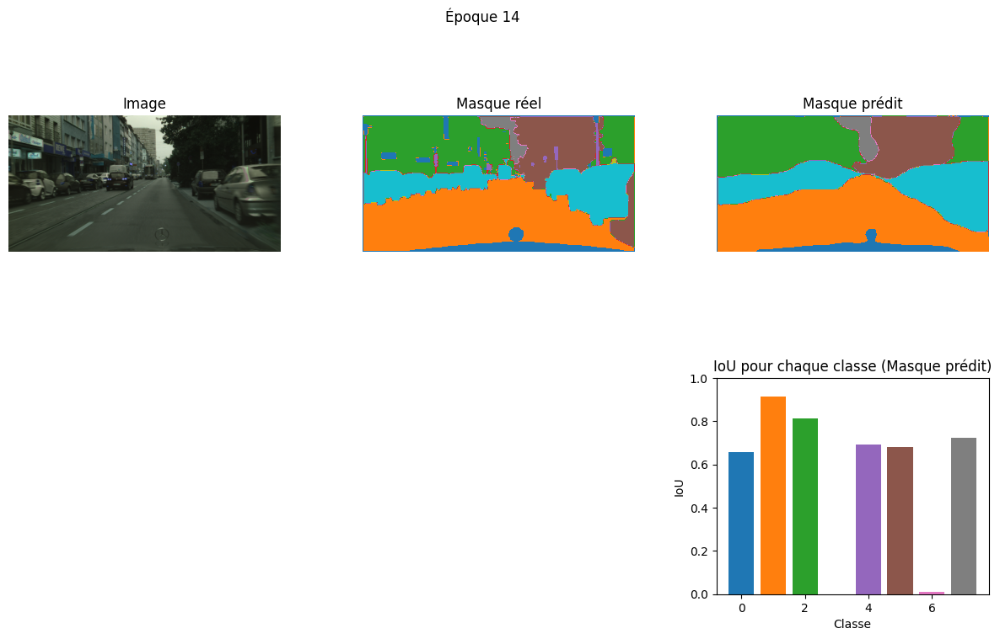

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6580
Classe 1 : IoU = 0.9126
Classe 2 : IoU = 0.8151
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6936
Classe 5 : IoU = 0.6807
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7242
30/30 ━━━━━━━━━━━━━━━━━━━━ 602s 20s/step - accuracy: 0.7979 - dice_coeff: 0.7120 - dice_loss: 0.2880 - jaccard_score: 0.5533 - loss: 0.6134 - total_loss: 2.5247 - val_accuracy: 0.7783 - val_dice_coeff: 0.6973 - val_dice_loss: 0.3027 - val_jaccard_score: 0.5356 - val_loss: 0.6885 - val_total_loss: 2.6341
Epoch 15/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.8060 - dice_coeff: 0.7230 - dice_loss: 0.2770 - jaccard_score: 0.5672 - loss: 0.5948 - total_loss: 2.5057 
Epoch 15: val_jaccard_score did not improve from 0.53562
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


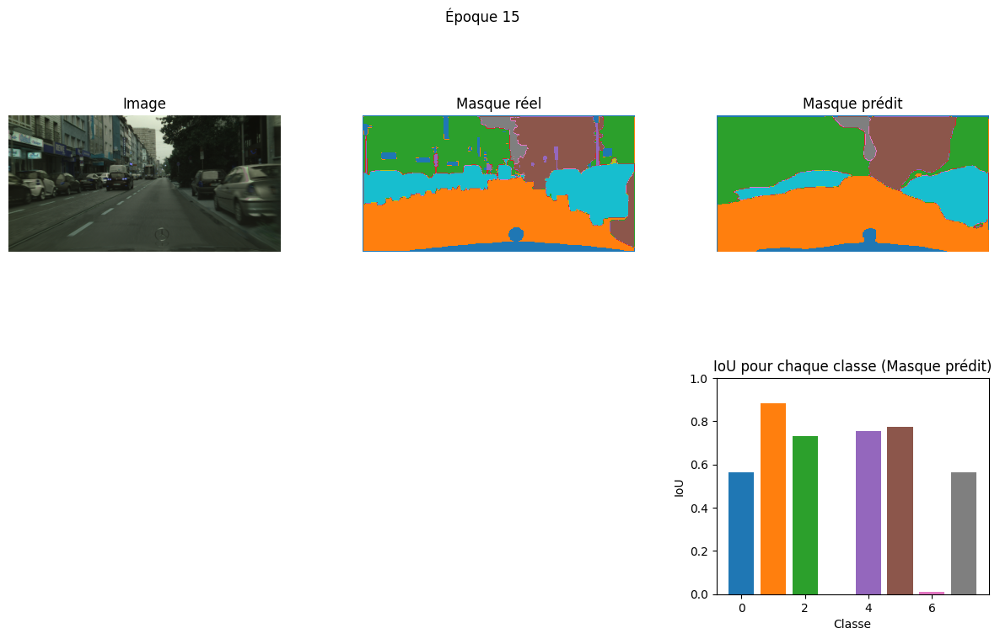

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5656
Classe 1 : IoU = 0.8849
Classe 2 : IoU = 0.7323
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.7540
Classe 5 : IoU = 0.7756
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.5655
30/30 ━━━━━━━━━━━━━━━━━━━━ 568s 19s/step - accuracy: 0.8058 - dice_coeff: 0.7227 - dice_loss: 0.2773 - jaccard_score: 0.5669 - loss: 0.5953 - total_loss: 2.5065 - val_accuracy: 0.7633 - val_dice_coeff: 0.6837 - val_dice_loss: 0.3163 - val_jaccard_score: 0.5198 - val_loss: 0.7186 - val_total_loss: 2.6276
Epoch 16/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.8058 - dice_coeff: 0.7144 - dice_loss: 0.2856 - jaccard_score: 0.5566 - loss: 0.5922 - total_loss: 2.4990 
Epoch 16: val_jaccard_score improved from 0.53562 to 0.54986, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


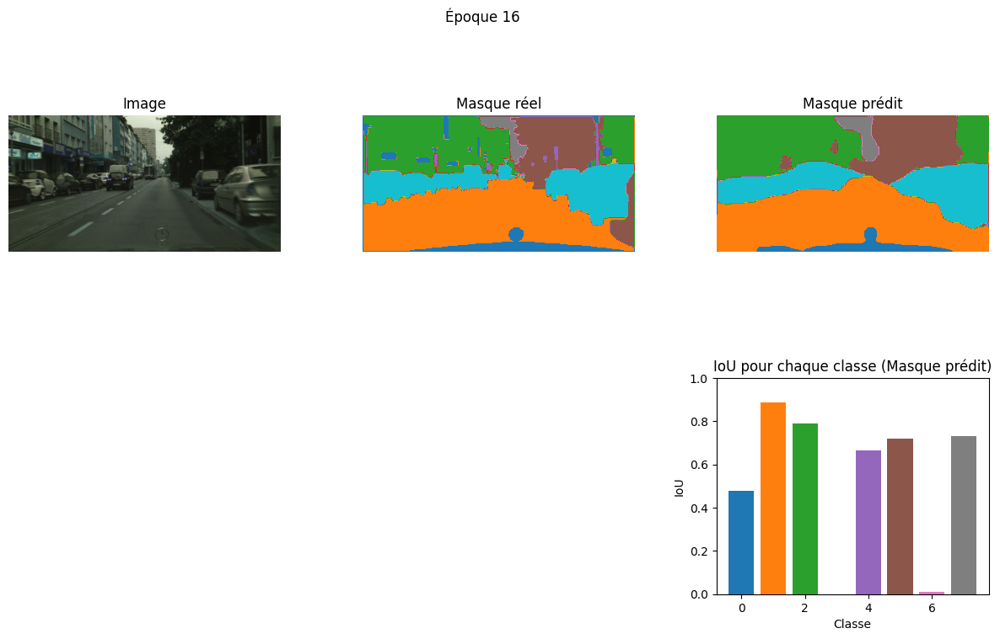

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4799
Classe 1 : IoU = 0.8876
Classe 2 : IoU = 0.7908
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6664
Classe 5 : IoU = 0.7211
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7315
30/30 ━━━━━━━━━━━━━━━━━━━━ 609s 20s/step - accuracy: 0.8059 - dice_coeff: 0.7147 - dice_loss: 0.2853 - jaccard_score: 0.5570 - loss: 0.5918 - total_loss: 2.4985 - val_accuracy: 0.7822 - val_dice_coeff: 0.7092 - val_dice_loss: 0.2908 - val_jaccard_score: 0.5499 - val_loss: 0.6920 - val_total_loss: 2.6238
Epoch 17/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.8059 - dice_coeff: 0.7214 - dice_loss: 0.2786 - jaccard_score: 0.5656 - loss: 0.6025 - total_loss: 2.4677 
Epoch 17: val_jaccard_score did not improve from 0.54986
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


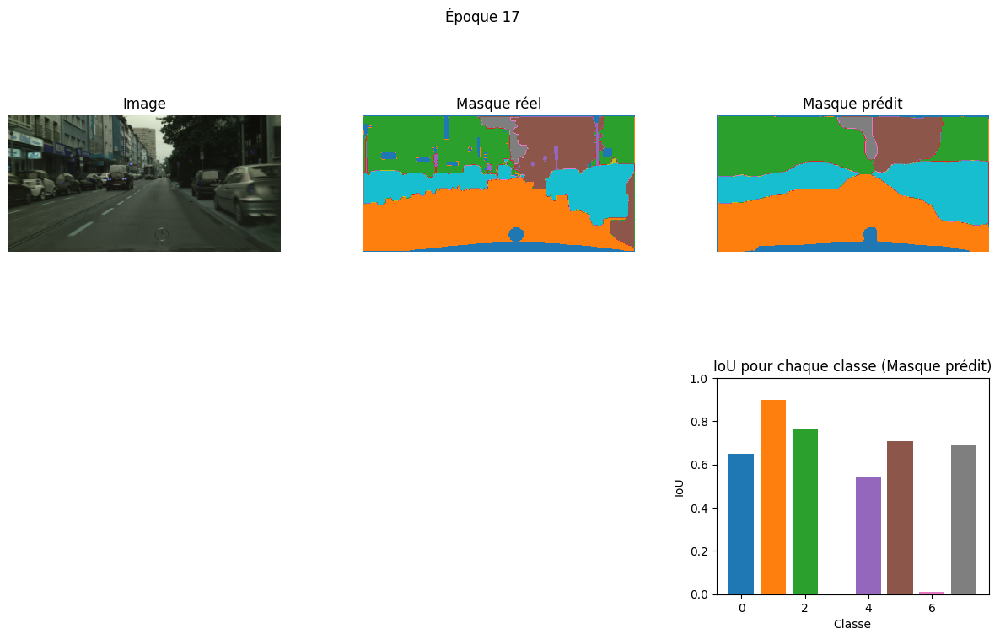

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6488
Classe 1 : IoU = 0.8975
Classe 2 : IoU = 0.7681
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.5391
Classe 5 : IoU = 0.7062
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.6943
30/30 ━━━━━━━━━━━━━━━━━━━━ 577s 19s/step - accuracy: 0.8056 - dice_coeff: 0.7210 - dice_loss: 0.2790 - jaccard_score: 0.5651 - loss: 0.6033 - total_loss: 2.4682 - val_accuracy: 0.7702 - val_dice_coeff: 0.6856 - val_dice_loss: 0.3144 - val_jaccard_score: 0.5220 - val_loss: 0.7073 - val_total_loss: 2.4758
Epoch 18/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.8139 - dice_coeff: 0.7265 - dice_loss: 0.2735 - jaccard_score: 0.5708 - loss: 0.5665 - total_loss: 2.3843 
Epoch 18: val_jaccard_score did not improve from 0.54986
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


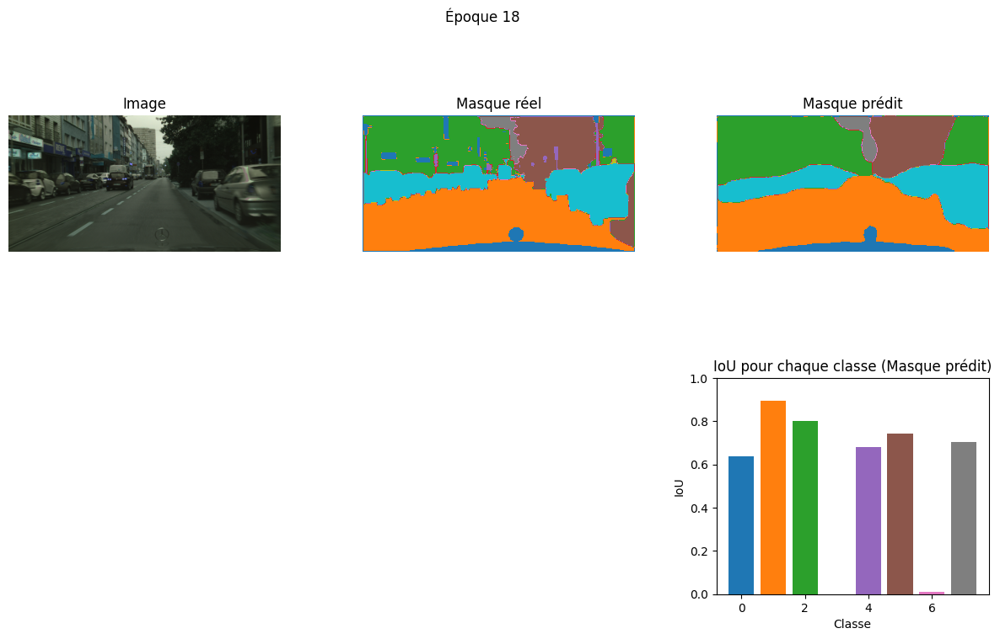

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6386
Classe 1 : IoU = 0.8965
Classe 2 : IoU = 0.8012
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6826
Classe 5 : IoU = 0.7432
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7023
30/30 ━━━━━━━━━━━━━━━━━━━━ 602s 20s/step - accuracy: 0.8138 - dice_coeff: 0.7264 - dice_loss: 0.2736 - jaccard_score: 0.5708 - loss: 0.5669 - total_loss: 2.3862 - val_accuracy: 0.7827 - val_dice_coeff: 0.7028 - val_dice_loss: 0.2972 - val_jaccard_score: 0.5421 - val_loss: 0.6895 - val_total_loss: 2.5053
Epoch 19/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.8280 - dice_coeff: 0.7467 - dice_loss: 0.2533 - jaccard_score: 0.5962 - loss: 0.5280 - total_loss: 2.4437 
Epoch 19: val_jaccard_score improved from 0.54986 to 0.56886, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


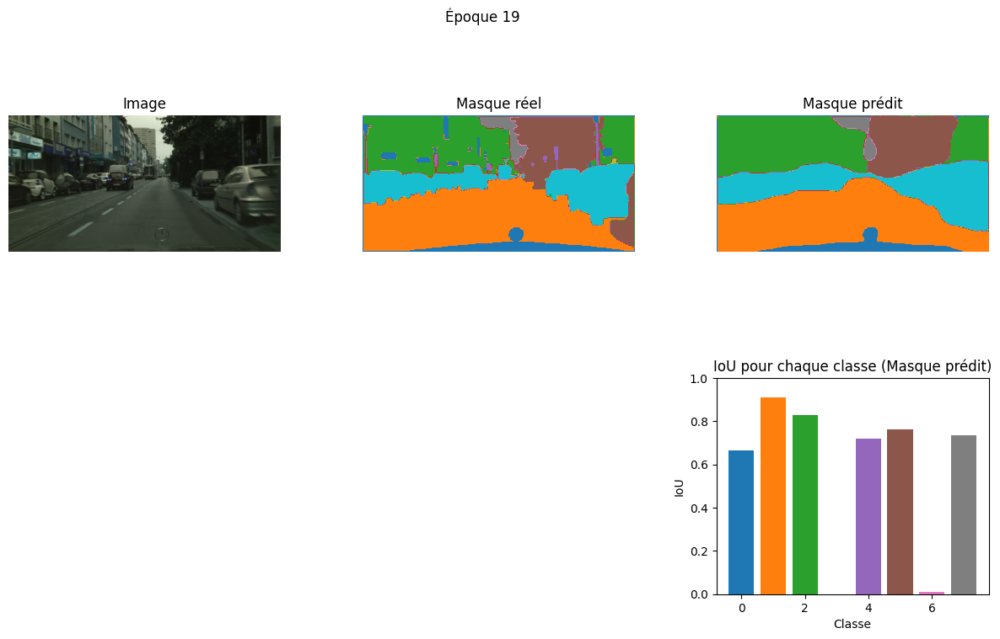

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6646
Classe 1 : IoU = 0.9120
Classe 2 : IoU = 0.8305
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.7195
Classe 5 : IoU = 0.7607
Classe 6 : IoU = 0.0094
Classe 7 : IoU = 0.7351
30/30 ━━━━━━━━━━━━━━━━━━━━ 606s 20s/step - accuracy: 0.8279 - dice_coeff: 0.7467 - dice_loss: 0.2533 - jaccard_score: 0.5962 - loss: 0.5283 - total_loss: 2.4453 - val_accuracy: 0.7956 - val_dice_coeff: 0.7248 - val_dice_loss: 0.2752 - val_jaccard_score: 0.5689 - val_loss: 0.6469 - val_total_loss: 2.6826
Epoch 20/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.8256 - dice_coeff: 0.7459 - dice_loss: 0.2541 - jaccard_score: 0.5951 - loss: 0.5250 - total_loss: 2.5075 
Epoch 20: val_jaccard_score did not improve from 0.56886
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


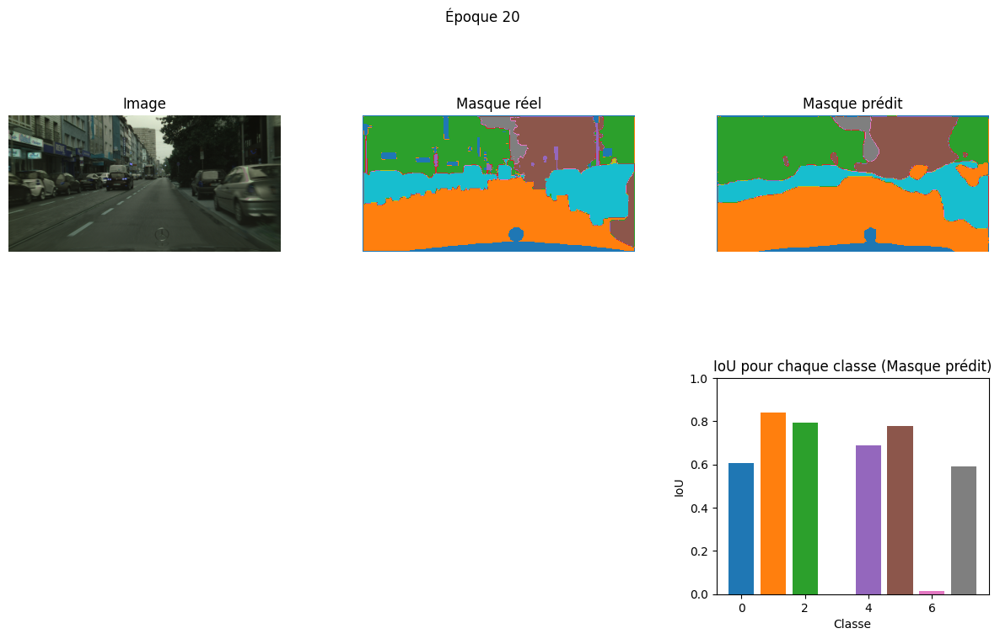

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6060
Classe 1 : IoU = 0.8419
Classe 2 : IoU = 0.7943
Classe 3 : IoU = 0.0008
Classe 4 : IoU = 0.6901
Classe 5 : IoU = 0.7766
Classe 6 : IoU = 0.0157
Classe 7 : IoU = 0.5899
30/30 ━━━━━━━━━━━━━━━━━━━━ 578s 19s/step - accuracy: 0.8256 - dice_coeff: 0.7460 - dice_loss: 0.2540 - jaccard_score: 0.5952 - loss: 0.5250 - total_loss: 2.5079 - val_accuracy: 0.7735 - val_dice_coeff: 0.6780 - val_dice_loss: 0.3220 - val_jaccard_score: 0.5134 - val_loss: 0.7284 - val_total_loss: 2.5864
Restoring model weights from the end of the best epoch: 19.


In [38]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback()]
)

## Avec TensorFlow

### Fonctions

In [39]:
# Fonction pour effectuer une rotation sans tensorflow-addons
def rotate_image_and_mask(image, mask, angle):
    # Calculer k, le nombre de rotations de 90 degrés à effectuer
    k = angle // 90
    image = tf.image.rot90(image, k=k)
    mask = tf.image.rot90(mask, k=k)
    return image, mask

In [40]:
# Fonction de data augmentation avec TensorFlow (sans tensorflow-addons)
def augment_data_tf(images, masks):
    def augment_image_and_mask(image, mask):
        # Flip horizontal avec probabilité de 50%
        image = tf.image.random_flip_left_right(image)
        mask = tf.image.random_flip_left_right(mask)

        # Flip vertical avec probabilité de 20%
        image = tf.image.random_flip_up_down(image)
        mask = tf.image.random_flip_up_down(mask)

        # Rotation aléatoire par multiples de 90 degrés
        angle = tf.random.uniform([], -90, 90, dtype=tf.int32)
        image, mask = rotate_image_and_mask(image, mask, angle)

        # Zoom de 80% à 120%
        scale = tf.random.uniform([], 0.8, 1.2)
        image = tf.image.resize(image, (int(256 * scale), int(512 * scale)))
        mask = tf.image.resize(mask, (int(256 * scale), int(512 * scale)))

        # Redimensionner pour la taille d'origine
        image = tf.image.resize(image, (256, 512))
        mask = tf.image.resize(mask, (256, 512))
        
        return image, mask

    # Appliquer la data augmentation
    images_aug = []
    masks_aug = []
    for img, msk in zip(images, masks):
        img_aug, msk_aug = augment_image_and_mask(img, msk)
        images_aug.append(img_aug)
        masks_aug.append(msk_aug)

    # Convertir en tensors de type tf.Tensor
    images_aug = tf.convert_to_tensor(images_aug)
    masks_aug = tf.convert_to_tensor(masks_aug)
    
    return images_aug, masks_aug

In [41]:
# Fonction avancée de data augmentation avec TensorFlow (sans tensorflow-addons)
def augment_data_tf_extended(images, masks):
    def augment_image_and_mask(image, mask):
        # Flip horizontal avec probabilité de 50%
        image = tf.image.random_flip_left_right(image)
        mask = tf.image.random_flip_left_right(mask)

        # Flip vertical avec probabilité de 20%
        image = tf.image.random_flip_up_down(image)
        mask = tf.image.random_flip_up_down(mask)

        # Rotation aléatoire par multiples de 90 degrés
        angle = tf.random.uniform([], -90, 90, dtype=tf.int32)
        image, mask = rotate_image_and_mask(image, mask, angle)

        # Zoom de 80% à 120%
        scale = tf.random.uniform([], 0.8, 1.2)
        image = tf.image.resize(image, (int(256 * scale), int(512 * scale)))
        mask = tf.image.resize(mask, (int(256 * scale), int(512 * scale)))

        # Redimensionner pour la taille d'origine
        image = tf.image.resize(image, (256, 512))
        mask = tf.image.resize(mask, (256, 512))

        # Ajout de transformations supplémentaires

        # Ajuste la luminosité
        image = tf.image.random_brightness(image, max_delta=0.2)  # delta de luminosité max de 20%

        # Ajuste le contraste
        image = tf.image.random_contrast(image, lower=0.8, upper=1.2)  # Contraste entre 80% et 120%

        # Ajuste la saturation (pour les images en couleur)
        image = tf.image.random_saturation(image, lower=0.8, upper=1.2)  # Saturation entre 80% et 120%

        # Ajuste la teinte
        image = tf.image.random_hue(image, max_delta=0.1)  # Variation de teinte max de 10%

        return image, mask

    # Appliquer la data augmentation
    images_aug = []
    masks_aug = []
    for img, msk in zip(images, masks):
        img_aug, msk_aug = augment_image_and_mask(img, msk)
        images_aug.append(img_aug)
        masks_aug.append(msk_aug)

    # Convertir en tensors de type tf.Tensor
    images_aug = tf.convert_to_tensor(images_aug)
    masks_aug = tf.convert_to_tensor(masks_aug)
    
    return images_aug, masks_aug

### Entraînement du modèle

In [42]:
# Chargement des images et masques
images = load_images(df_train_sample)
masks = load_masks(df_train_sample)

#### Entraînement 1

In [43]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [44]:
filename = f"best_model_tensorflow_1.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [45]:
# Appliquer la data augmentation
images_aug, masks_aug = augment_data_tf(images, masks)

Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.4006 - dice_coeff: 0.2680 - dice_loss: 0.7320 - jaccard_score: 0.1551 - loss: 2.0360 - total_loss: 3.5318 
Epoch 1: val_jaccard_score improved from -inf to 0.14532, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


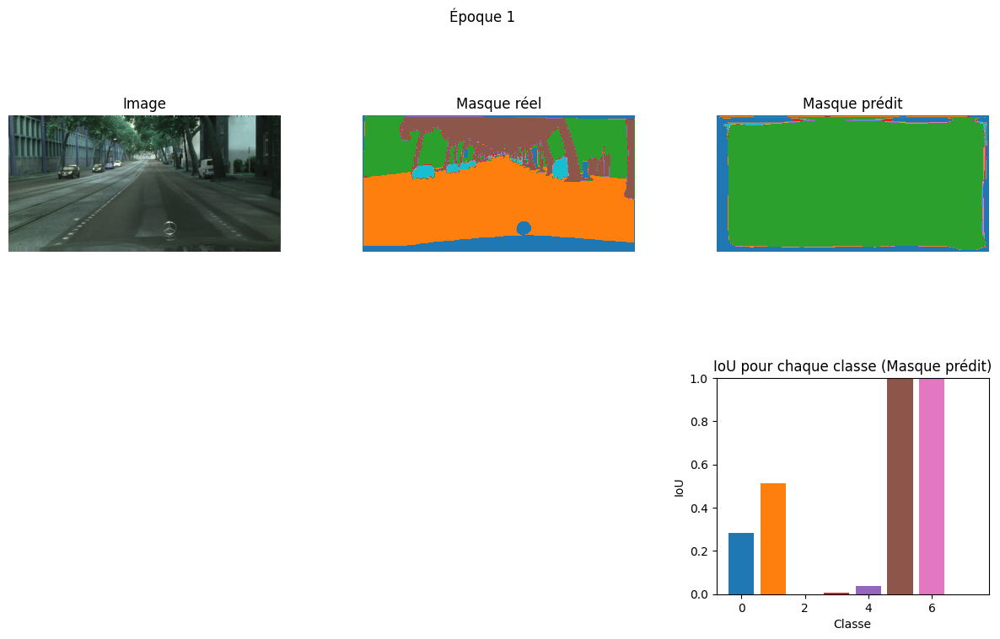

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.2837
Classe 1 : IoU = 0.5117
Classe 2 : IoU = 0.0000
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.0379
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 670s 22s/step - accuracy: 0.4008 - dice_coeff: 0.2678 - dice_loss: 0.7322 - jaccard_score: 0.1550 - loss: 2.0258 - total_loss: 3.5268 - val_accuracy: 0.3964 - val_dice_coeff: 0.2537 - val_dice_loss: 0.7463 - val_jaccard_score: 0.1453 - val_loss: 1.6241 - val_total_loss: 3.2781
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 20s/step - accuracy: 0.4184 - dice_coeff: 0.2754 - dice_loss: 0.7246 - jaccard_score: 0.1598 - loss: 1.5568 - total_loss: 3.2751 
Epoch 2: val_jaccard_score improved from 0.14532 to 0.15319, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


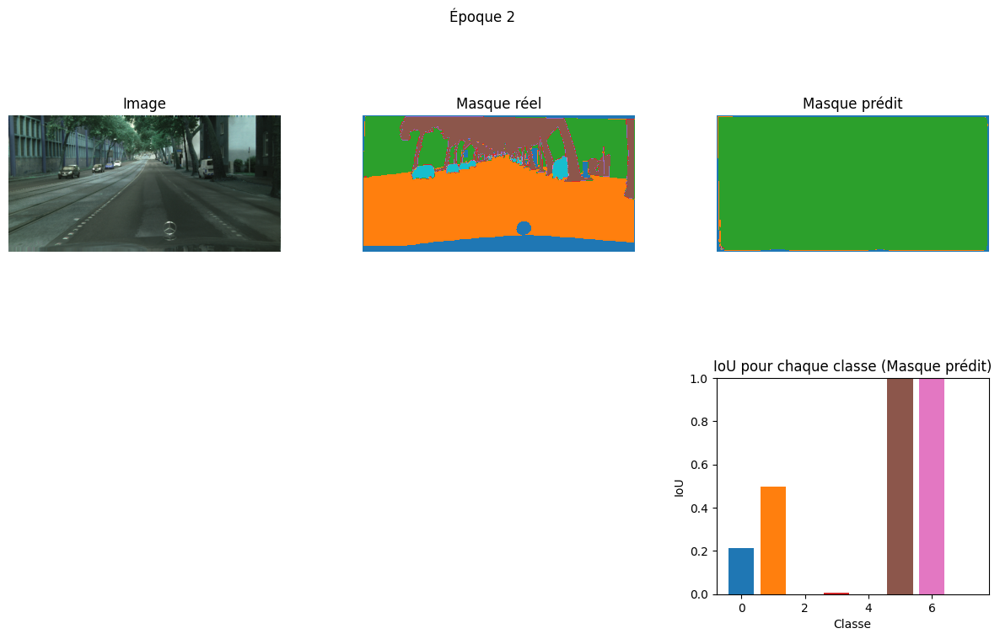

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.2114
Classe 1 : IoU = 0.4990
Classe 2 : IoU = 0.0000
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 641s 21s/step - accuracy: 0.4185 - dice_coeff: 0.2753 - dice_loss: 0.7247 - jaccard_score: 0.1598 - loss: 1.5571 - total_loss: 3.2746 - val_accuracy: 0.3924 - val_dice_coeff: 0.2656 - val_dice_loss: 0.7344 - val_jaccard_score: 0.1532 - val_loss: 1.6291 - val_total_loss: 3.2592
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 20s/step - accuracy: 0.4240 - dice_coeff: 0.2809 - dice_loss: 0.7191 - jaccard_score: 0.1635 - loss: 1.5347 - total_loss: 3.2247 
Epoch 3: val_jaccard_score did not improve from 0.15319
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


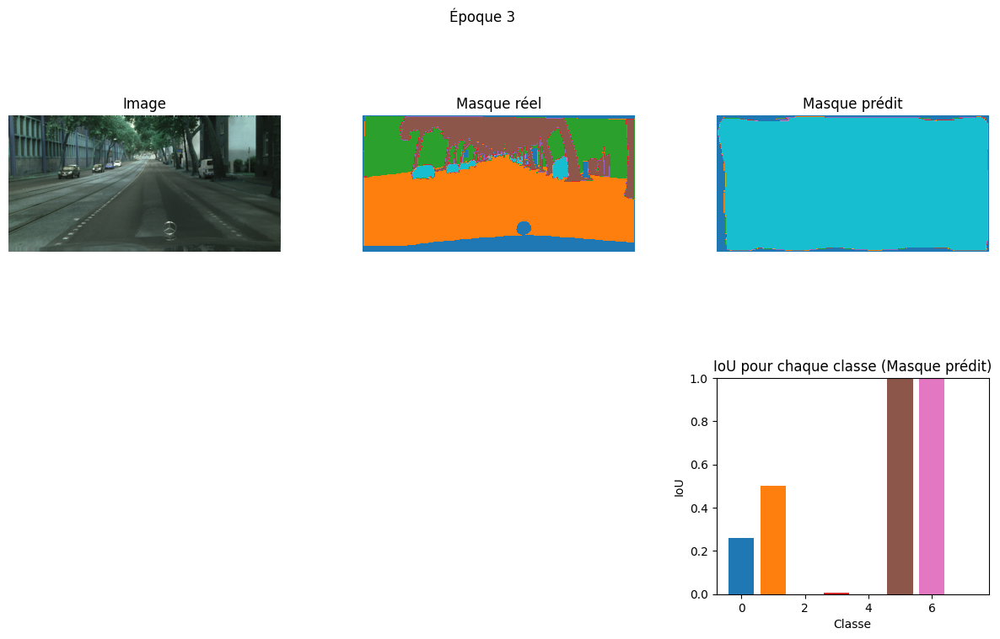

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.2613
Classe 1 : IoU = 0.5001
Classe 2 : IoU = 0.0000
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 639s 21s/step - accuracy: 0.4239 - dice_coeff: 0.2809 - dice_loss: 0.7191 - jaccard_score: 0.1634 - loss: 1.5350 - total_loss: 3.2249 - val_accuracy: 0.3994 - val_dice_coeff: 0.2544 - val_dice_loss: 0.7456 - val_jaccard_score: 0.1458 - val_loss: 1.6081 - val_total_loss: 3.2067
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.4266 - dice_coeff: 0.2794 - dice_loss: 0.7206 - jaccard_score: 0.1624 - loss: 1.5409 - total_loss: 3.1935 
Epoch 4: val_jaccard_score improved from 0.15319 to 0.15482, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


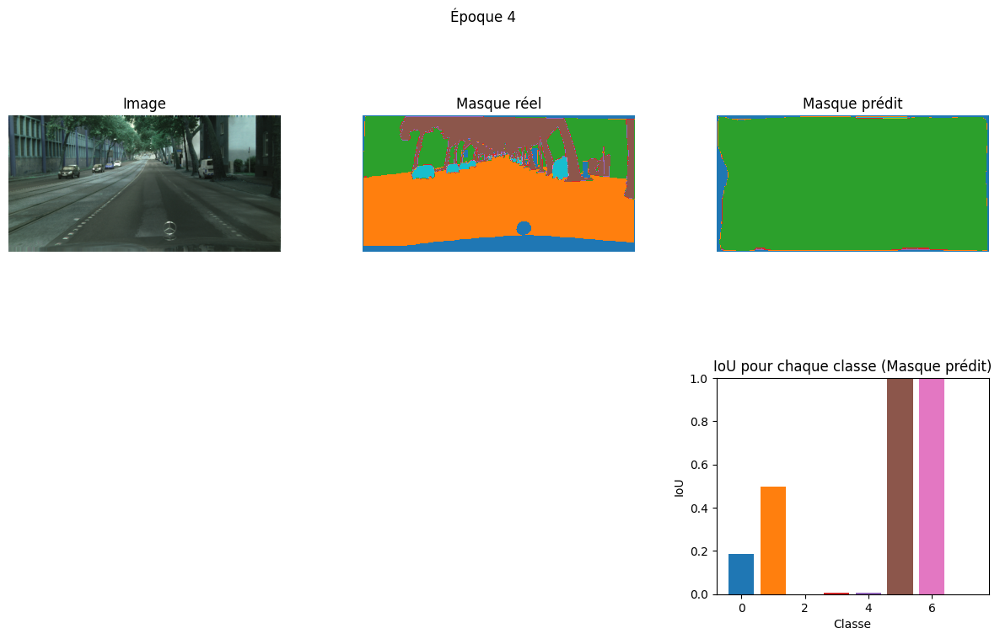

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.1874
Classe 1 : IoU = 0.4985
Classe 2 : IoU = 0.0005
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.0067
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 605s 20s/step - accuracy: 0.4266 - dice_coeff: 0.2795 - dice_loss: 0.7205 - jaccard_score: 0.1625 - loss: 1.5405 - total_loss: 3.1942 - val_accuracy: 0.3950 - val_dice_coeff: 0.2681 - val_dice_loss: 0.7319 - val_jaccard_score: 0.1548 - val_loss: 1.6305 - val_total_loss: 3.3701
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 20s/step - accuracy: 0.4186 - dice_coeff: 0.2817 - dice_loss: 0.7183 - jaccard_score: 0.1640 - loss: 1.5311 - total_loss: 3.2585 
Epoch 5: val_jaccard_score improved from 0.15482 to 0.15485, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


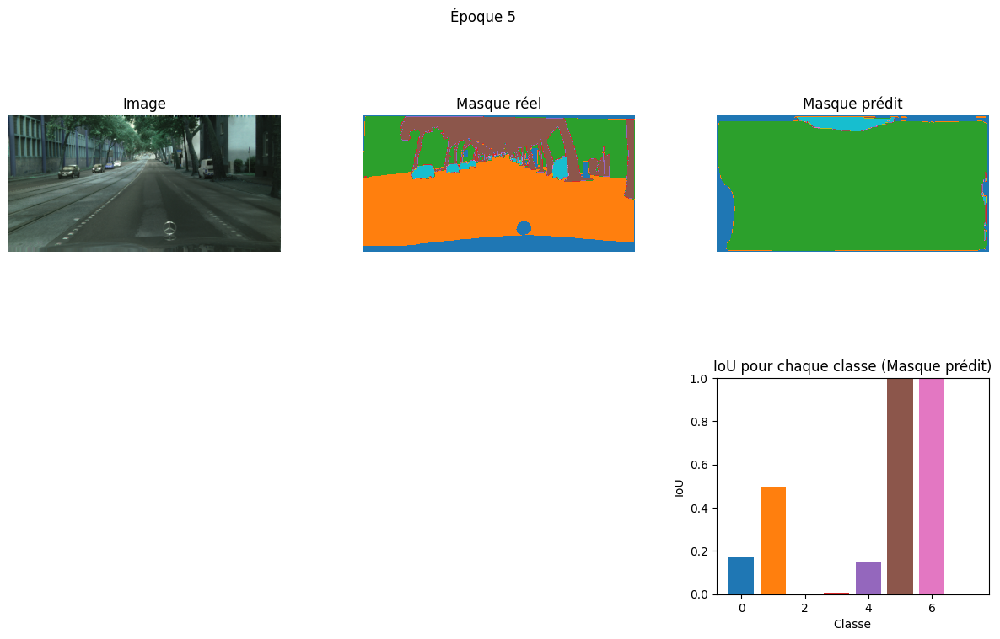

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.1705
Classe 1 : IoU = 0.4989
Classe 2 : IoU = 0.0000
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.1510
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 642s 21s/step - accuracy: 0.4188 - dice_coeff: 0.2817 - dice_loss: 0.7183 - jaccard_score: 0.1640 - loss: 1.5309 - total_loss: 3.2585 - val_accuracy: 0.4030 - val_dice_coeff: 0.2681 - val_dice_loss: 0.7319 - val_jaccard_score: 0.1548 - val_loss: 1.5921 - val_total_loss: 3.2851
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.4273 - dice_coeff: 0.2788 - dice_loss: 0.7212 - jaccard_score: 0.1620 - loss: 1.5495 - total_loss: 3.2278 
Epoch 6: val_jaccard_score did not improve from 0.15485
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


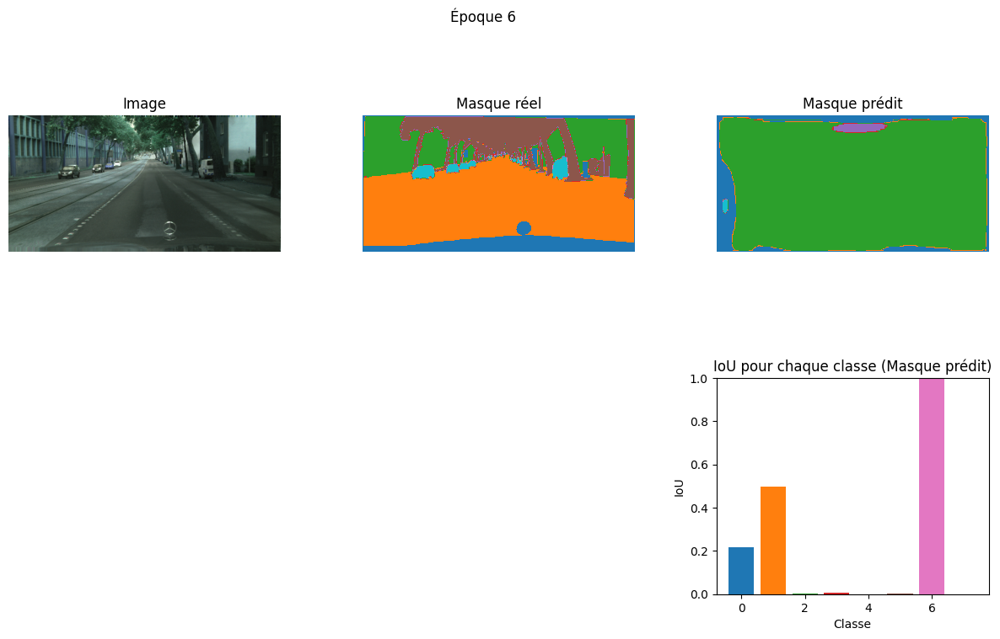

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.2167
Classe 1 : IoU = 0.4977
Classe 2 : IoU = 0.0047
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.0000
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 618s 21s/step - accuracy: 0.4273 - dice_coeff: 0.2789 - dice_loss: 0.7211 - jaccard_score: 0.1621 - loss: 1.5491 - total_loss: 3.2269 - val_accuracy: 0.3967 - val_dice_coeff: 0.2664 - val_dice_loss: 0.7336 - val_jaccard_score: 0.1537 - val_loss: 1.5960 - val_total_loss: 3.2291
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.4268 - dice_coeff: 0.2870 - dice_loss: 0.7130 - jaccard_score: 0.1677 - loss: 1.5169 - total_loss: 3.2161 
Epoch 7: val_jaccard_score improved from 0.15485 to 0.16205, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


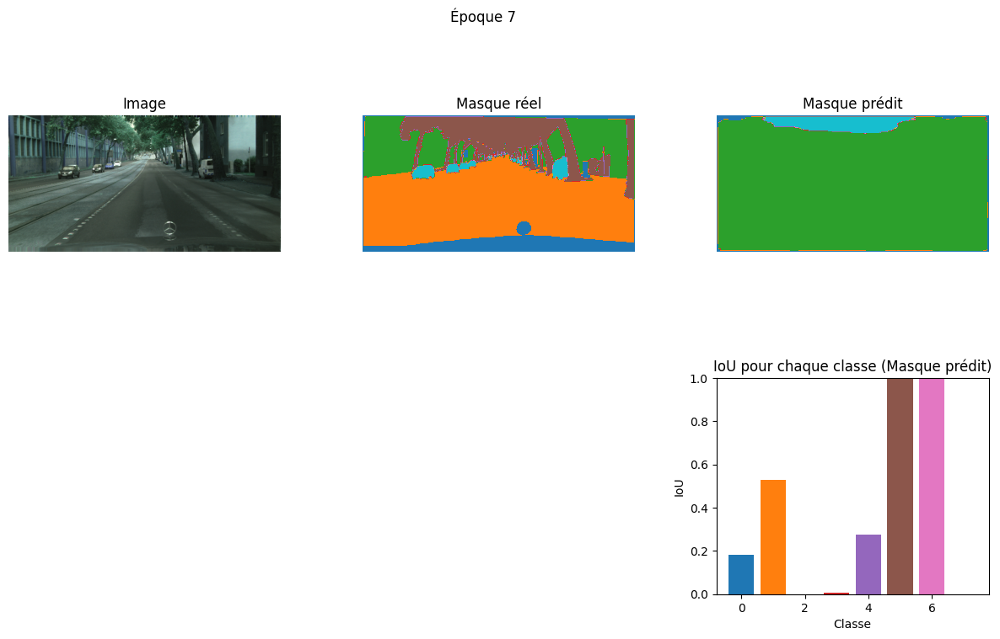

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.1833
Classe 1 : IoU = 0.5276
Classe 2 : IoU = 0.0004
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.2753
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 603s 20s/step - accuracy: 0.4270 - dice_coeff: 0.2871 - dice_loss: 0.7129 - jaccard_score: 0.1677 - loss: 1.5167 - total_loss: 3.2160 - val_accuracy: 0.4024 - val_dice_coeff: 0.2788 - val_dice_loss: 0.7212 - val_jaccard_score: 0.1621 - val_loss: 1.6102 - val_total_loss: 3.2708
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.4275 - dice_coeff: 0.2844 - dice_loss: 0.7156 - jaccard_score: 0.1658 - loss: 1.5215 - total_loss: 3.2185 
Epoch 8: val_jaccard_score did not improve from 0.16205
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


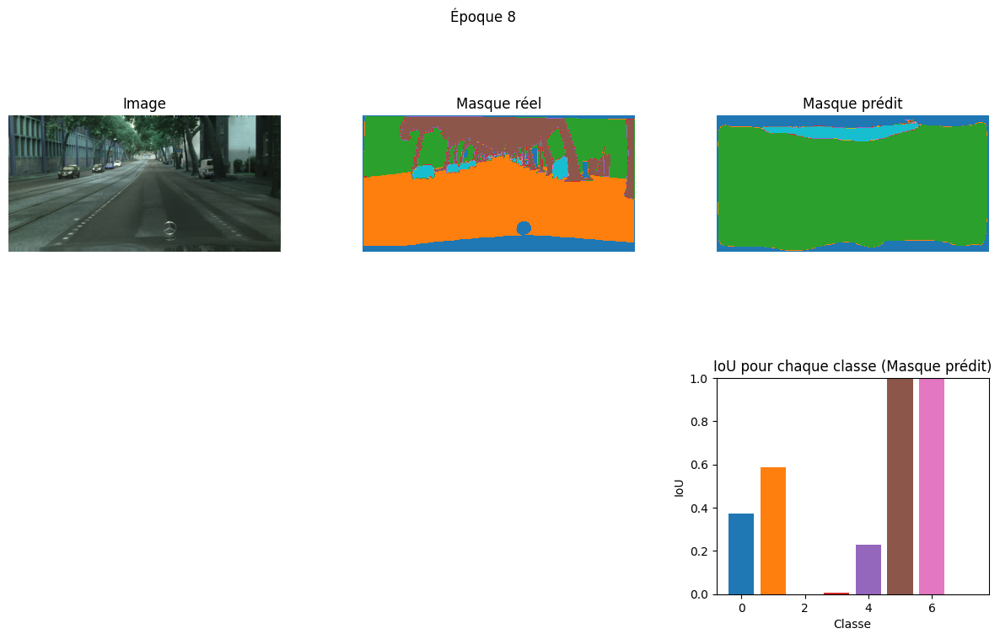

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.3748
Classe 1 : IoU = 0.5891
Classe 2 : IoU = 0.0000
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.2275
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 558s 19s/step - accuracy: 0.4278 - dice_coeff: 0.2846 - dice_loss: 0.7154 - jaccard_score: 0.1660 - loss: 1.5207 - total_loss: 3.2179 - val_accuracy: 0.4023 - val_dice_coeff: 0.2778 - val_dice_loss: 0.7222 - val_jaccard_score: 0.1614 - val_loss: 1.5823 - val_total_loss: 3.2527
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.4407 - dice_coeff: 0.3042 - dice_loss: 0.6958 - jaccard_score: 0.1795 - loss: 1.4602 - total_loss: 3.2096 
Epoch 9: val_jaccard_score improved from 0.16205 to 0.16860, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


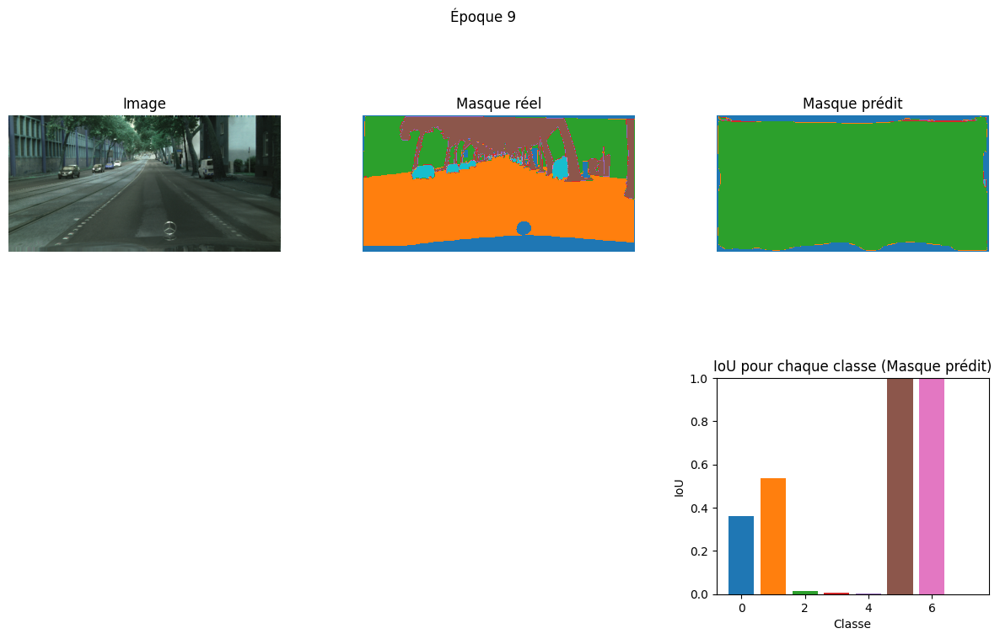

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.3610
Classe 1 : IoU = 0.5351
Classe 2 : IoU = 0.0142
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.0021
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 549s 18s/step - accuracy: 0.4407 - dice_coeff: 0.3040 - dice_loss: 0.6960 - jaccard_score: 0.1793 - loss: 1.4609 - total_loss: 3.2105 - val_accuracy: 0.4058 - val_dice_coeff: 0.2885 - val_dice_loss: 0.7115 - val_jaccard_score: 0.1686 - val_loss: 1.5758 - val_total_loss: 3.3307
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4444 - dice_coeff: 0.2989 - dice_loss: 0.7011 - jaccard_score: 0.1758 - loss: 1.4797 - total_loss: 3.2436 
Epoch 10: val_jaccard_score did not improve from 0.16860
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


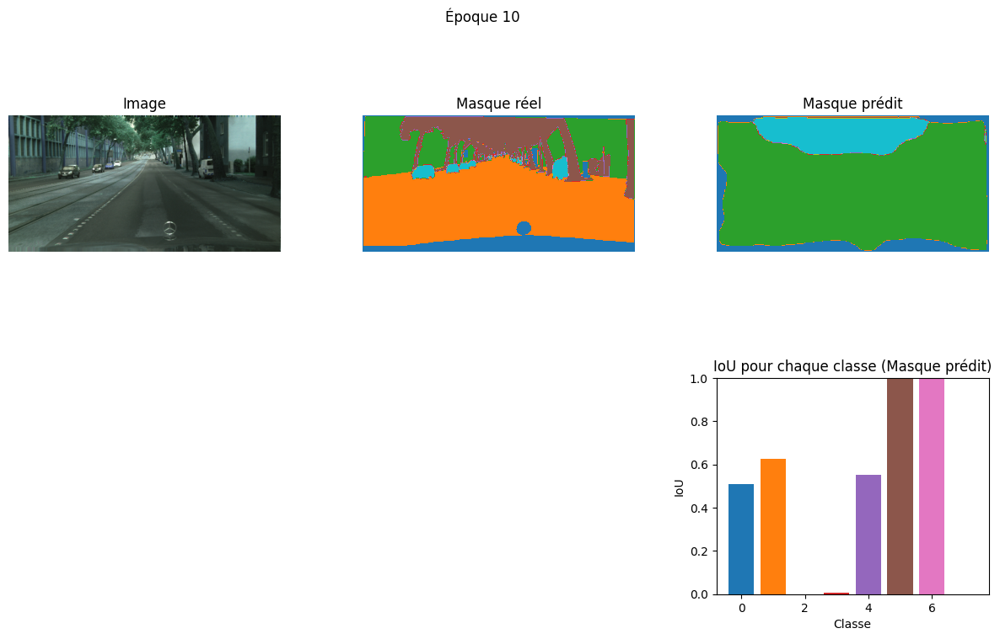

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5077
Classe 1 : IoU = 0.6247
Classe 2 : IoU = 0.0000
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.5524
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 578s 19s/step - accuracy: 0.4444 - dice_coeff: 0.2989 - dice_loss: 0.7011 - jaccard_score: 0.1758 - loss: 1.4796 - total_loss: 3.2436 - val_accuracy: 0.3976 - val_dice_coeff: 0.2688 - val_dice_loss: 0.7312 - val_jaccard_score: 0.1553 - val_loss: 1.5667 - val_total_loss: 3.3043
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.4538 - dice_coeff: 0.2972 - dice_loss: 0.7028 - jaccard_score: 0.1746 - loss: 1.4699 - total_loss: 3.2279 
Epoch 11: val_jaccard_score improved from 0.16860 to 0.17224, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


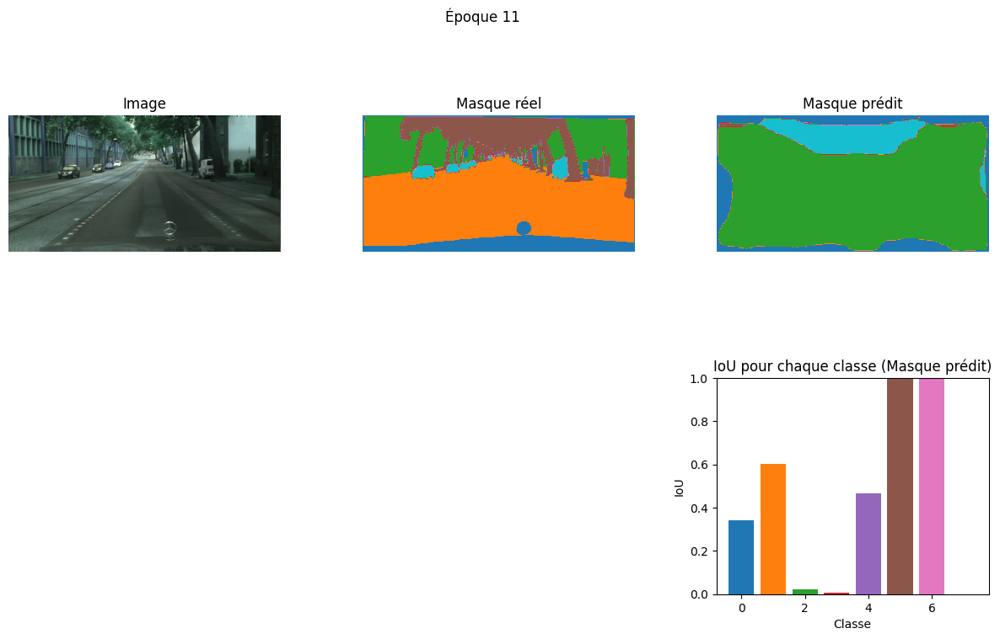

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.3412
Classe 1 : IoU = 0.6039
Classe 2 : IoU = 0.0205
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.4654
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 624s 21s/step - accuracy: 0.4537 - dice_coeff: 0.2974 - dice_loss: 0.7026 - jaccard_score: 0.1748 - loss: 1.4693 - total_loss: 3.2278 - val_accuracy: 0.3861 - val_dice_coeff: 0.2938 - val_dice_loss: 0.7062 - val_jaccard_score: 0.1722 - val_loss: 1.5944 - val_total_loss: 3.3702
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4487 - dice_coeff: 0.3102 - dice_loss: 0.6898 - jaccard_score: 0.1839 - loss: 1.4561 - total_loss: 3.2912 
Epoch 12: val_jaccard_score did not improve from 0.17224
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


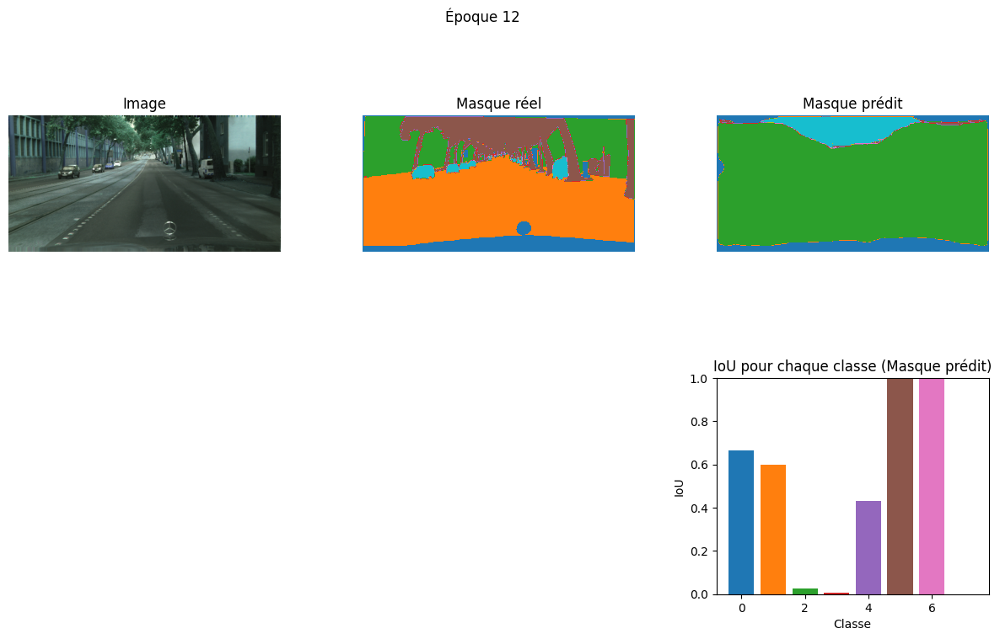

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6671
Classe 1 : IoU = 0.5998
Classe 2 : IoU = 0.0260
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.4331
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 576s 19s/step - accuracy: 0.4487 - dice_coeff: 0.3101 - dice_loss: 0.6899 - jaccard_score: 0.1838 - loss: 1.4560 - total_loss: 3.2908 - val_accuracy: 0.4020 - val_dice_coeff: 0.2912 - val_dice_loss: 0.7088 - val_jaccard_score: 0.1705 - val_loss: 1.5557 - val_total_loss: 3.3700
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4419 - dice_coeff: 0.3019 - dice_loss: 0.6981 - jaccard_score: 0.1779 - loss: 1.4555 - total_loss: 3.2531 
Epoch 13: val_jaccard_score did not improve from 0.17224
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


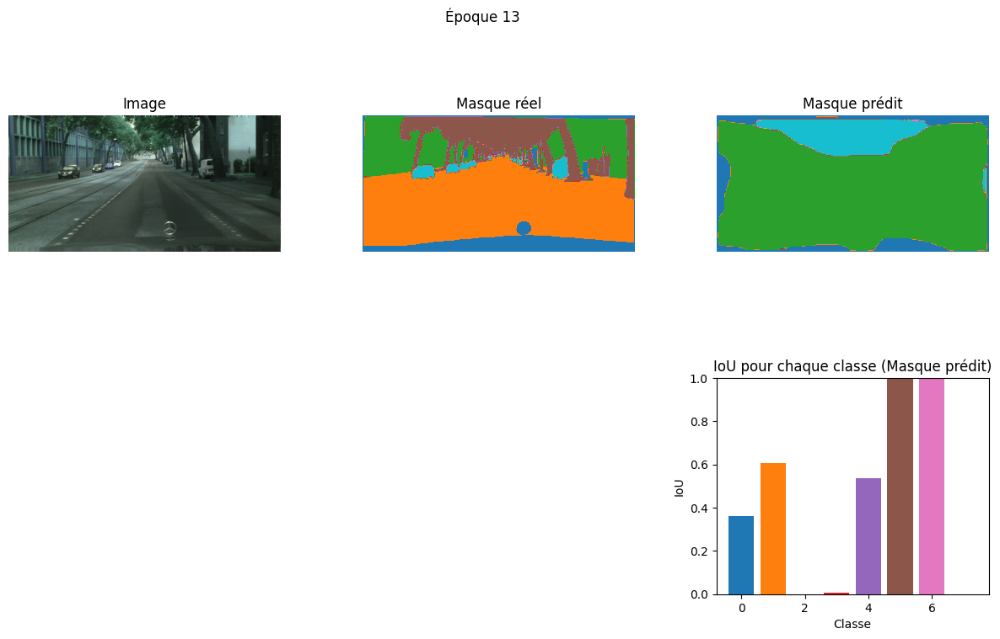

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.3594
Classe 1 : IoU = 0.6071
Classe 2 : IoU = 0.0002
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.5360
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 562s 19s/step - accuracy: 0.4422 - dice_coeff: 0.3022 - dice_loss: 0.6978 - jaccard_score: 0.1781 - loss: 1.4547 - total_loss: 3.2526 - val_accuracy: 0.3817 - val_dice_coeff: 0.2909 - val_dice_loss: 0.7091 - val_jaccard_score: 0.1703 - val_loss: 1.5690 - val_total_loss: 3.3560
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4644 - dice_coeff: 0.3271 - dice_loss: 0.6729 - jaccard_score: 0.1958 - loss: 1.3991 - total_loss: 3.1727 
Epoch 14: val_jaccard_score did not improve from 0.17224
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


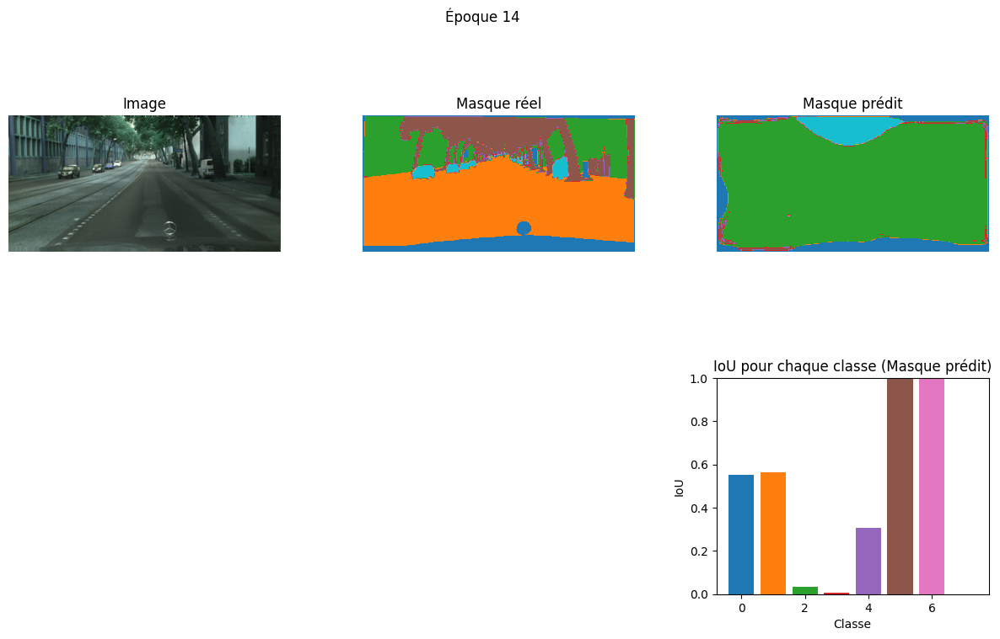

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5523
Classe 1 : IoU = 0.5634
Classe 2 : IoU = 0.0321
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.3084
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.0004
30/30 ━━━━━━━━━━━━━━━━━━━━ 572s 19s/step - accuracy: 0.4642 - dice_coeff: 0.3269 - dice_loss: 0.6731 - jaccard_score: 0.1956 - loss: 1.3995 - total_loss: 3.1727 - val_accuracy: 0.4014 - val_dice_coeff: 0.2774 - val_dice_loss: 0.7226 - val_jaccard_score: 0.1611 - val_loss: 1.5298 - val_total_loss: 3.3029
Epoch 15/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.4628 - dice_coeff: 0.3160 - dice_loss: 0.6840 - jaccard_score: 0.1879 - loss: 1.4212 - total_loss: 3.2249 
Epoch 15: val_jaccard_score did not improve from 0.17224
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


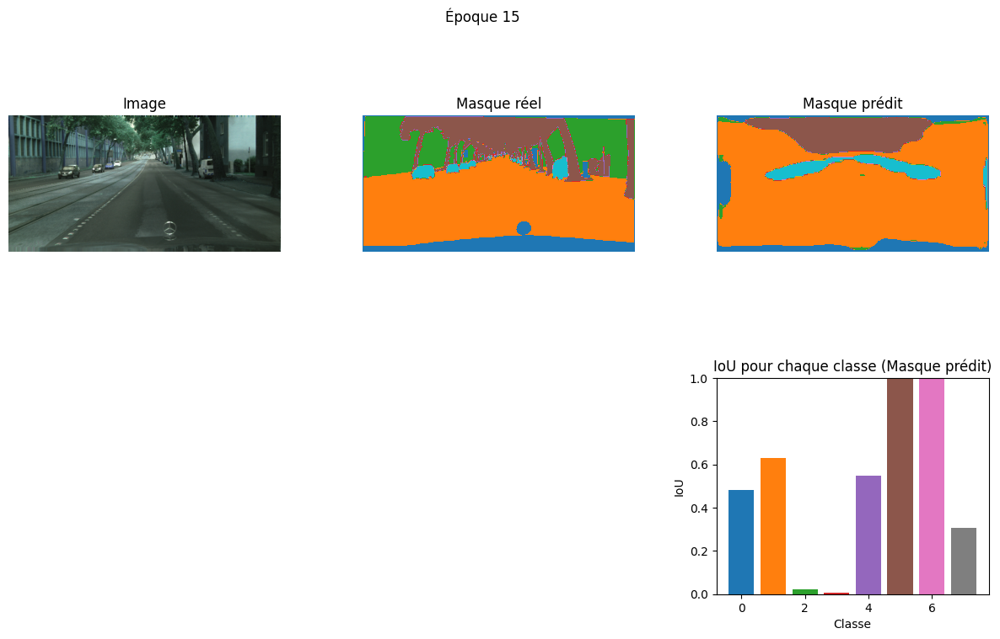

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4811
Classe 1 : IoU = 0.6319
Classe 2 : IoU = 0.0241
Classe 3 : IoU = 0.0057
Classe 4 : IoU = 0.5466
Classe 5 : IoU = 1.0000
Classe 6 : IoU = 1.0000
Classe 7 : IoU = 0.3054
30/30 ━━━━━━━━━━━━━━━━━━━━ 579s 19s/step - accuracy: 0.4627 - dice_coeff: 0.3162 - dice_loss: 0.6838 - jaccard_score: 0.1880 - loss: 1.4206 - total_loss: 3.2248 - val_accuracy: 0.3839 - val_dice_coeff: 0.2760 - val_dice_loss: 0.7240 - val_jaccard_score: 0.1602 - val_loss: 1.5385 - val_total_loss: 3.2986
Epoch 15: early stopping
Restoring model weights from the end of the best epoch: 11.


In [46]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback()]
)

#### Entraînement 2

In [47]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [48]:
filename = f"best_model_tensorflow_2.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [49]:
images_aug, masks_aug = augment_data_tf_extended(images, masks)

Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.4308 - dice_coeff: 0.2923 - dice_loss: 0.7077 - jaccard_score: 0.1713 - loss: 1.5058 - total_loss: 3.2596 
Epoch 1: val_jaccard_score improved from -inf to 0.16606, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


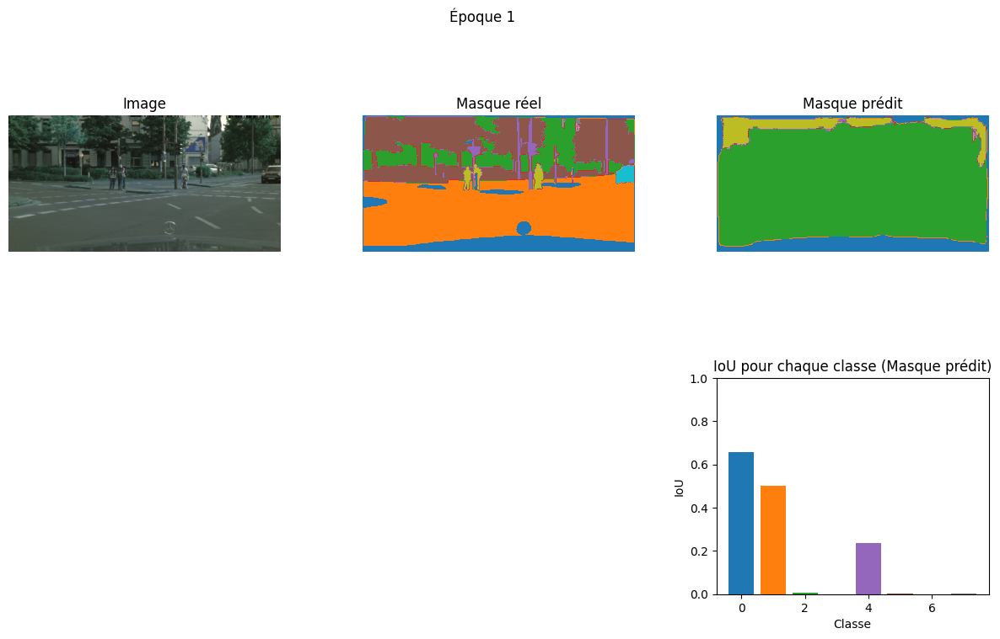

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6579
Classe 1 : IoU = 0.5024
Classe 2 : IoU = 0.0053
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.2384
Classe 5 : IoU = 0.0039
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 589s 20s/step - accuracy: 0.4309 - dice_coeff: 0.2923 - dice_loss: 0.7077 - jaccard_score: 0.1713 - loss: 1.5053 - total_loss: 3.2596 - val_accuracy: 0.4173 - val_dice_coeff: 0.2848 - val_dice_loss: 0.7152 - val_jaccard_score: 0.1661 - val_loss: 1.5144 - val_total_loss: 3.2237
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4431 - dice_coeff: 0.3014 - dice_loss: 0.6986 - jaccard_score: 0.1775 - loss: 1.4719 - total_loss: 3.1719 
Epoch 2: val_jaccard_score improved from 0.16606 to 0.16734, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


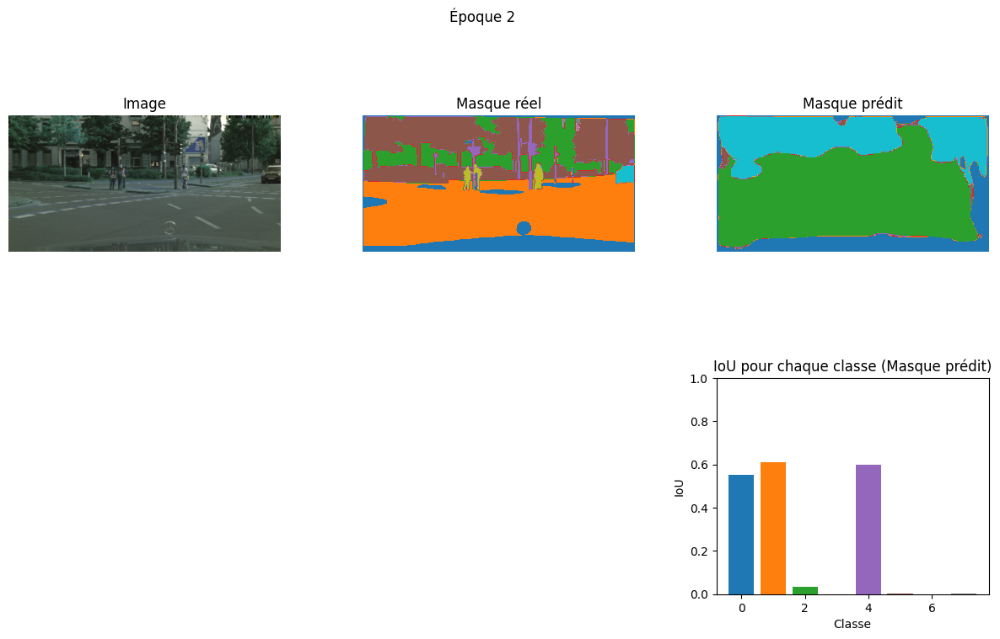

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5502
Classe 1 : IoU = 0.6092
Classe 2 : IoU = 0.0323
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.5979
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 574s 19s/step - accuracy: 0.4431 - dice_coeff: 0.3015 - dice_loss: 0.6985 - jaccard_score: 0.1776 - loss: 1.4714 - total_loss: 3.1729 - val_accuracy: 0.4185 - val_dice_coeff: 0.2866 - val_dice_loss: 0.7134 - val_jaccard_score: 0.1673 - val_loss: 1.5113 - val_total_loss: 3.3079
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4475 - dice_coeff: 0.3064 - dice_loss: 0.6936 - jaccard_score: 0.1811 - loss: 1.4481 - total_loss: 3.2256 
Epoch 3: val_jaccard_score improved from 0.16734 to 0.17134, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


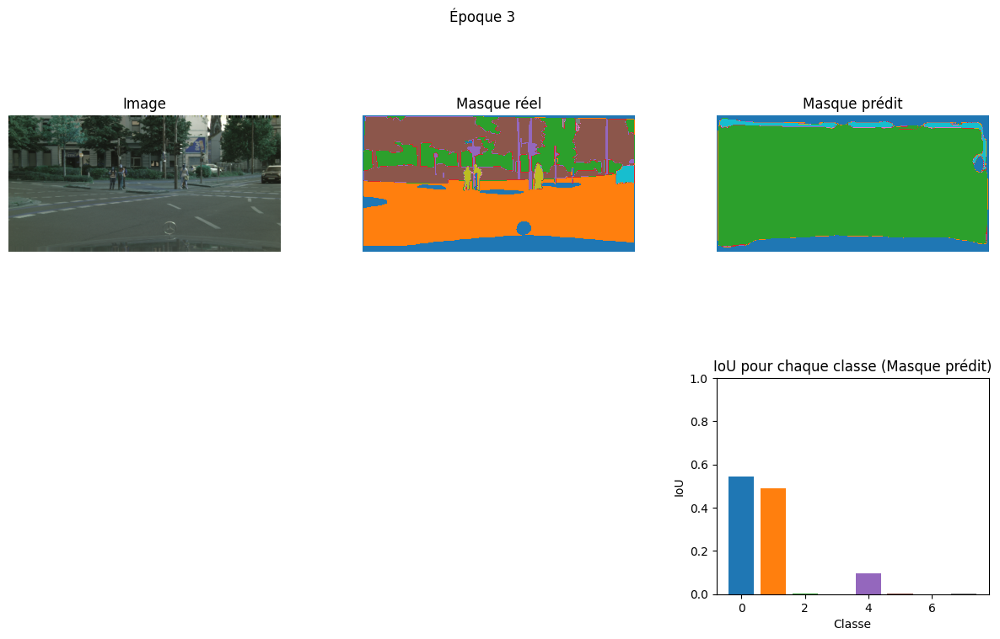

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5455
Classe 1 : IoU = 0.4879
Classe 2 : IoU = 0.0027
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.0980
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 576s 19s/step - accuracy: 0.4475 - dice_coeff: 0.3064 - dice_loss: 0.6936 - jaccard_score: 0.1811 - loss: 1.4482 - total_loss: 3.2252 - val_accuracy: 0.4183 - val_dice_coeff: 0.2925 - val_dice_loss: 0.7075 - val_jaccard_score: 0.1713 - val_loss: 1.5100 - val_total_loss: 3.2467
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4547 - dice_coeff: 0.3214 - dice_loss: 0.6786 - jaccard_score: 0.1915 - loss: 1.4035 - total_loss: 3.2003 
Epoch 4: val_jaccard_score did not improve from 0.17134
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


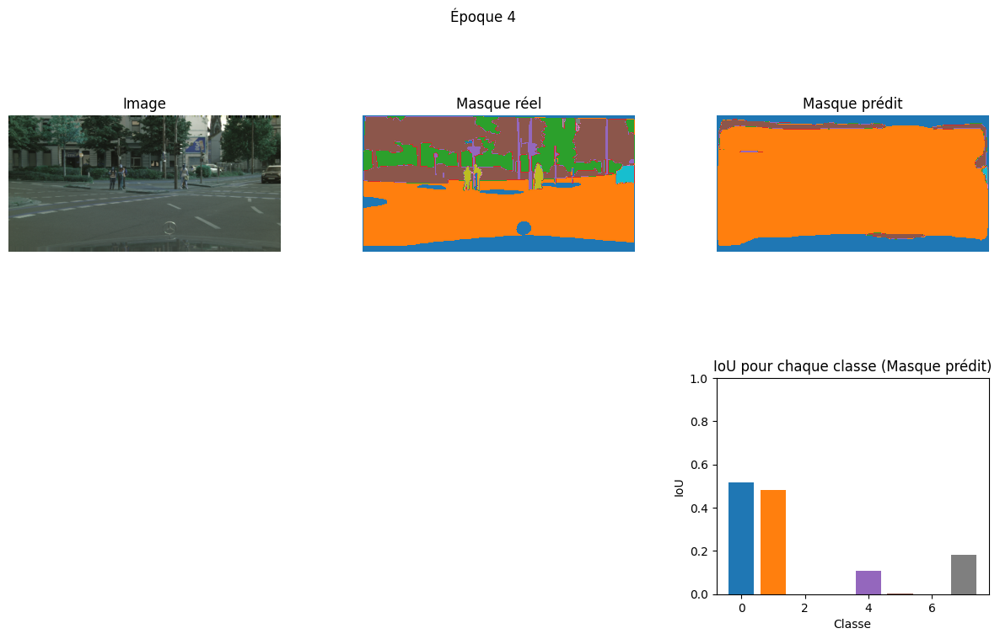

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5159
Classe 1 : IoU = 0.4805
Classe 2 : IoU = 0.0001
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.1082
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.1813
30/30 ━━━━━━━━━━━━━━━━━━━━ 579s 19s/step - accuracy: 0.4544 - dice_coeff: 0.3212 - dice_loss: 0.6788 - jaccard_score: 0.1914 - loss: 1.4041 - total_loss: 3.2005 - val_accuracy: 0.4202 - val_dice_coeff: 0.2857 - val_dice_loss: 0.7143 - val_jaccard_score: 0.1667 - val_loss: 1.4825 - val_total_loss: 3.1588
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4504 - dice_coeff: 0.3124 - dice_loss: 0.6876 - jaccard_score: 0.1852 - loss: 1.4190 - total_loss: 3.1525 
Epoch 5: val_jaccard_score did not improve from 0.17134
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


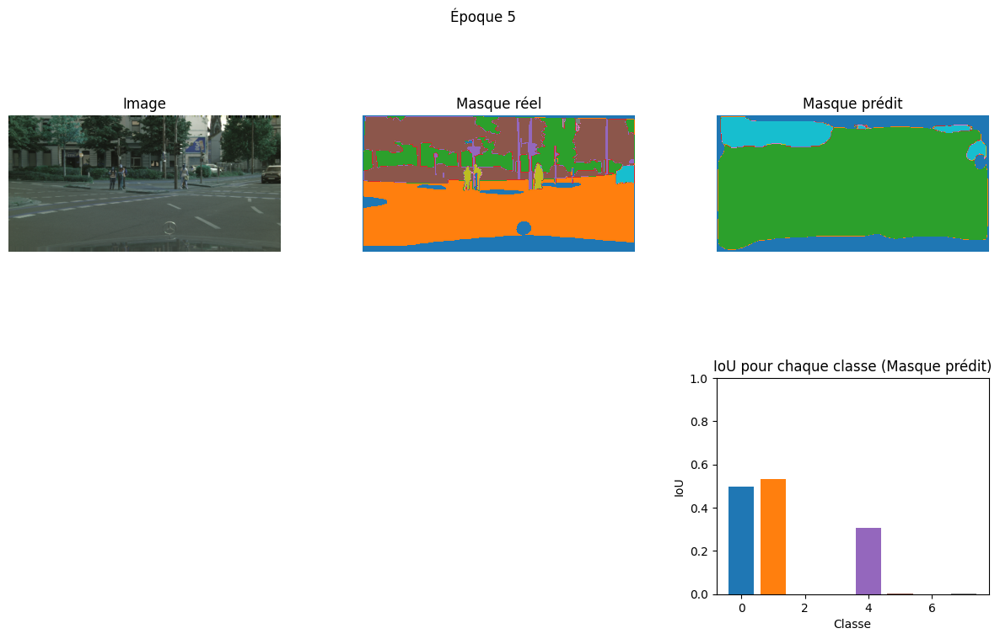

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4966
Classe 1 : IoU = 0.5335
Classe 2 : IoU = 0.0001
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.3080
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 576s 19s/step - accuracy: 0.4504 - dice_coeff: 0.3125 - dice_loss: 0.6875 - jaccard_score: 0.1853 - loss: 1.4189 - total_loss: 3.1533 - val_accuracy: 0.4223 - val_dice_coeff: 0.2906 - val_dice_loss: 0.7094 - val_jaccard_score: 0.1700 - val_loss: 1.4975 - val_total_loss: 3.2196
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4574 - dice_coeff: 0.3204 - dice_loss: 0.6796 - jaccard_score: 0.1909 - loss: 1.3848 - total_loss: 3.1731 
Epoch 6: val_jaccard_score improved from 0.17134 to 0.17570, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


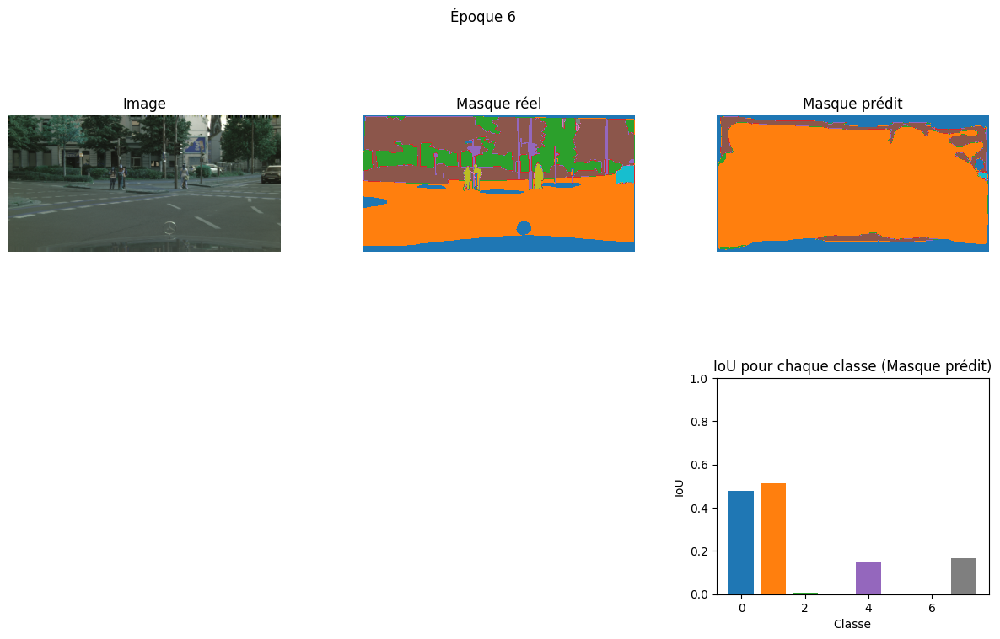

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4782
Classe 1 : IoU = 0.5115
Classe 2 : IoU = 0.0082
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.1503
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.1652
30/30 ━━━━━━━━━━━━━━━━━━━━ 572s 19s/step - accuracy: 0.4575 - dice_coeff: 0.3205 - dice_loss: 0.6795 - jaccard_score: 0.1909 - loss: 1.3849 - total_loss: 3.1736 - val_accuracy: 0.4243 - val_dice_coeff: 0.2989 - val_dice_loss: 0.7011 - val_jaccard_score: 0.1757 - val_loss: 1.4809 - val_total_loss: 3.2320
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4593 - dice_coeff: 0.3235 - dice_loss: 0.6765 - jaccard_score: 0.1930 - loss: 1.3805 - total_loss: 3.2114 
Epoch 7: val_jaccard_score improved from 0.17570 to 0.18769, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


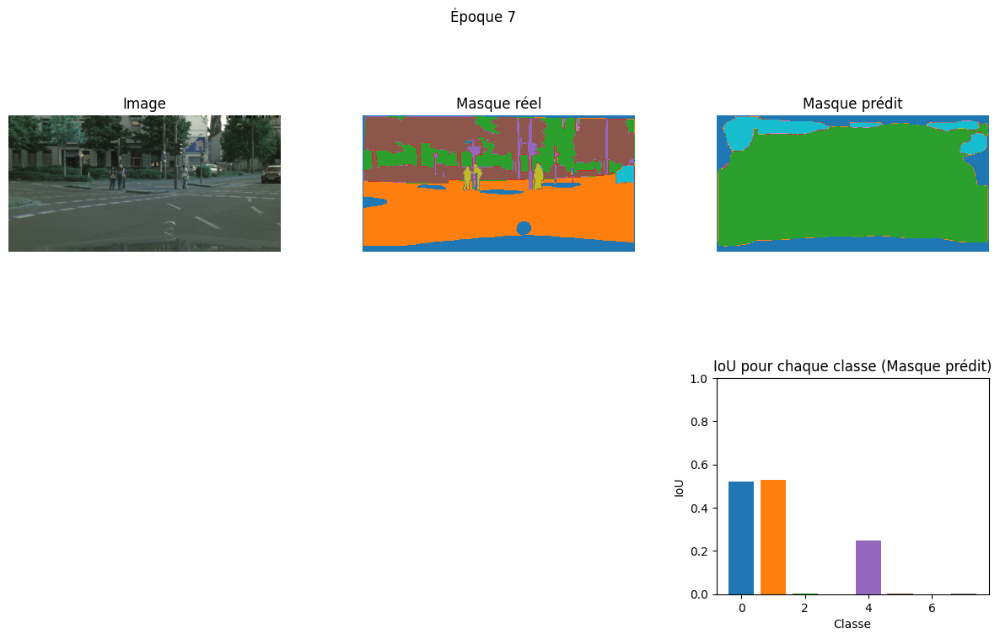

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5192
Classe 1 : IoU = 0.5270
Classe 2 : IoU = 0.0016
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.2465
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 567s 19s/step - accuracy: 0.4591 - dice_coeff: 0.3234 - dice_loss: 0.6766 - jaccard_score: 0.1930 - loss: 1.3811 - total_loss: 3.2116 - val_accuracy: 0.4221 - val_dice_coeff: 0.3160 - val_dice_loss: 0.6840 - val_jaccard_score: 0.1877 - val_loss: 1.5264 - val_total_loss: 3.2598
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4630 - dice_coeff: 0.3285 - dice_loss: 0.6715 - jaccard_score: 0.1966 - loss: 1.3762 - total_loss: 3.1739 
Epoch 8: val_jaccard_score improved from 0.18769 to 0.18844, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


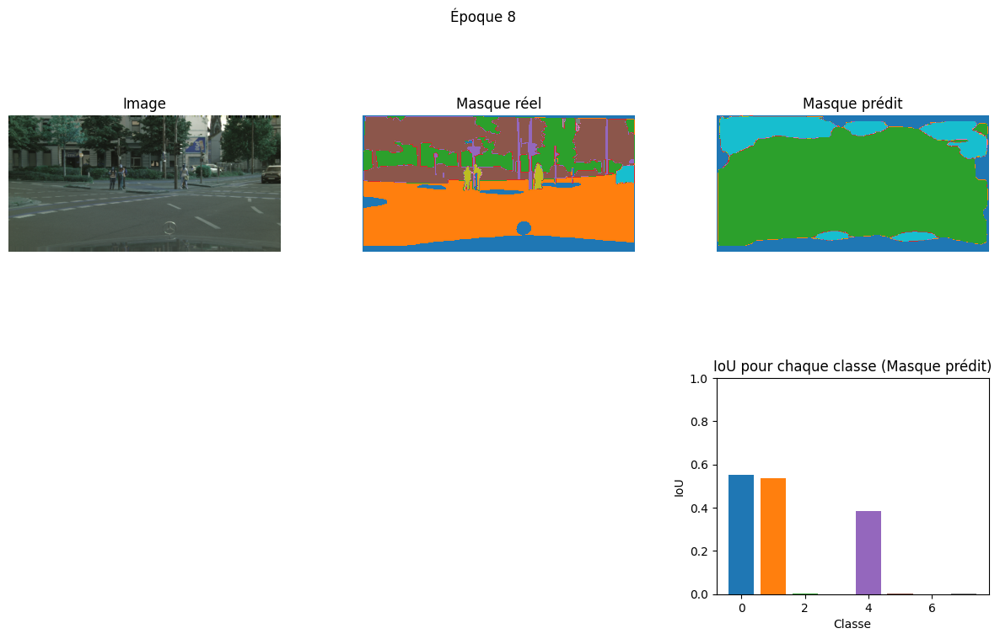

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5511
Classe 1 : IoU = 0.5367
Classe 2 : IoU = 0.0014
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.3843
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 571s 19s/step - accuracy: 0.4630 - dice_coeff: 0.3284 - dice_loss: 0.6716 - jaccard_score: 0.1966 - loss: 1.3766 - total_loss: 3.1731 - val_accuracy: 0.4274 - val_dice_coeff: 0.3170 - val_dice_loss: 0.6830 - val_jaccard_score: 0.1884 - val_loss: 1.4913 - val_total_loss: 3.1178
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4694 - dice_coeff: 0.3346 - dice_loss: 0.6654 - jaccard_score: 0.2011 - loss: 1.3551 - total_loss: 3.1107 
Epoch 9: val_jaccard_score improved from 0.18844 to 0.18948, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


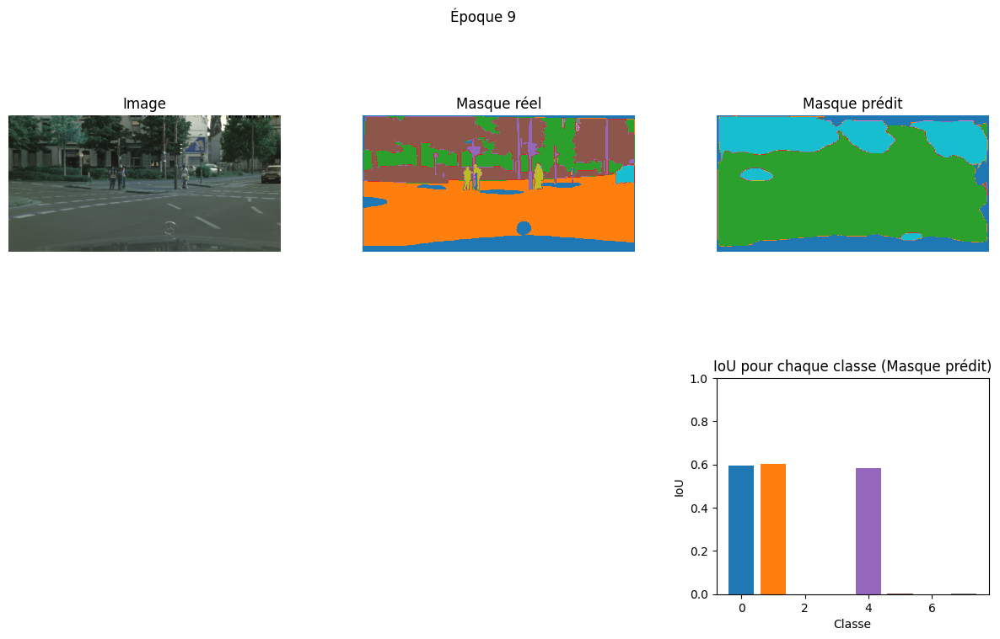

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5965
Classe 1 : IoU = 0.6036
Classe 2 : IoU = 0.0001
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.5818
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 571s 19s/step - accuracy: 0.4692 - dice_coeff: 0.3346 - dice_loss: 0.6654 - jaccard_score: 0.2010 - loss: 1.3552 - total_loss: 3.1107 - val_accuracy: 0.4290 - val_dice_coeff: 0.3185 - val_dice_loss: 0.6815 - val_jaccard_score: 0.1895 - val_loss: 1.4778 - val_total_loss: 3.1628
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4901 - dice_coeff: 0.3519 - dice_loss: 0.6481 - jaccard_score: 0.2139 - loss: 1.3245 - total_loss: 3.0986 
Epoch 10: val_jaccard_score did not improve from 0.18948
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


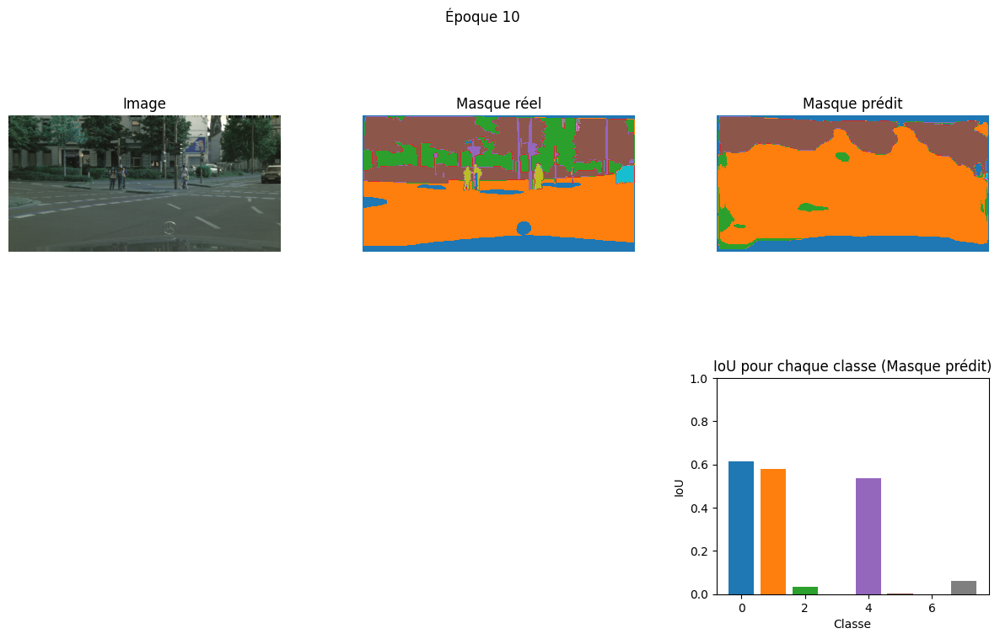

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6162
Classe 1 : IoU = 0.5784
Classe 2 : IoU = 0.0333
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.5358
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0599
30/30 ━━━━━━━━━━━━━━━━━━━━ 563s 19s/step - accuracy: 0.4895 - dice_coeff: 0.3516 - dice_loss: 0.6484 - jaccard_score: 0.2136 - loss: 1.3254 - total_loss: 3.0994 - val_accuracy: 0.4190 - val_dice_coeff: 0.3135 - val_dice_loss: 0.6865 - val_jaccard_score: 0.1860 - val_loss: 1.5189 - val_total_loss: 3.2709
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4692 - dice_coeff: 0.3435 - dice_loss: 0.6565 - jaccard_score: 0.2075 - loss: 1.3328 - total_loss: 3.1317 
Epoch 11: val_jaccard_score did not improve from 0.18948
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


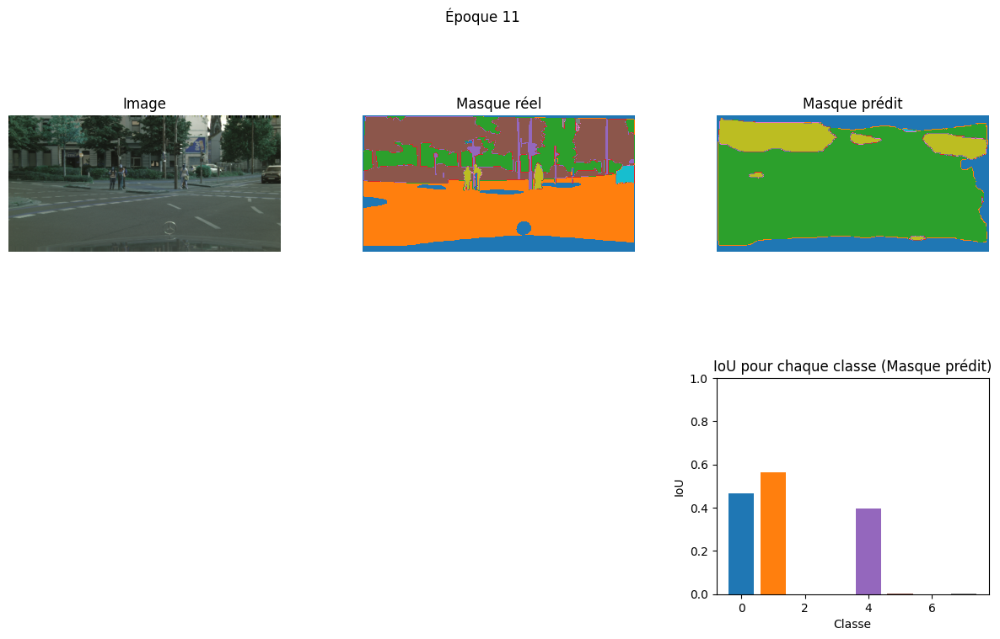

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4680
Classe 1 : IoU = 0.5646
Classe 2 : IoU = 0.0001
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.3953
Classe 5 : IoU = 0.0029
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 566s 19s/step - accuracy: 0.4692 - dice_coeff: 0.3434 - dice_loss: 0.6566 - jaccard_score: 0.2074 - loss: 1.3332 - total_loss: 3.1319 - val_accuracy: 0.4262 - val_dice_coeff: 0.3153 - val_dice_loss: 0.6847 - val_jaccard_score: 0.1872 - val_loss: 1.5384 - val_total_loss: 3.2050
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4683 - dice_coeff: 0.3458 - dice_loss: 0.6542 - jaccard_score: 0.2092 - loss: 1.3216 - total_loss: 3.1262 
Epoch 12: val_jaccard_score did not improve from 0.18948
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


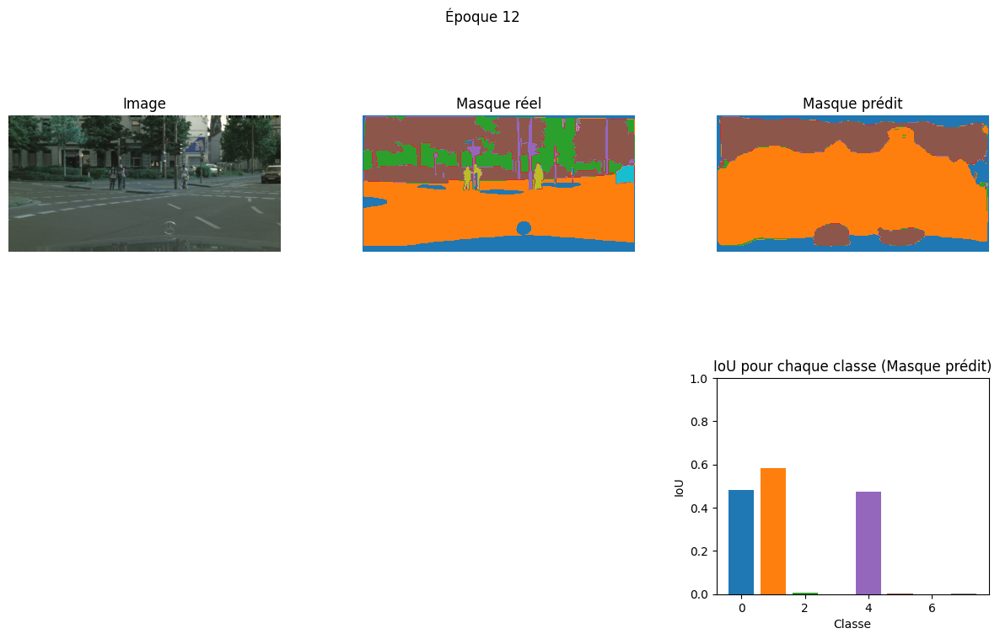

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4817
Classe 1 : IoU = 0.5847
Classe 2 : IoU = 0.0073
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.4729
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0038
30/30 ━━━━━━━━━━━━━━━━━━━━ 572s 19s/step - accuracy: 0.4683 - dice_coeff: 0.3458 - dice_loss: 0.6542 - jaccard_score: 0.2092 - loss: 1.3222 - total_loss: 3.1269 - val_accuracy: 0.4302 - val_dice_coeff: 0.3056 - val_dice_loss: 0.6944 - val_jaccard_score: 0.1804 - val_loss: 1.5012 - val_total_loss: 3.2225
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4698 - dice_coeff: 0.3440 - dice_loss: 0.6560 - jaccard_score: 0.2079 - loss: 1.3277 - total_loss: 3.1036 
Epoch 13: val_jaccard_score improved from 0.18948 to 0.18960, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


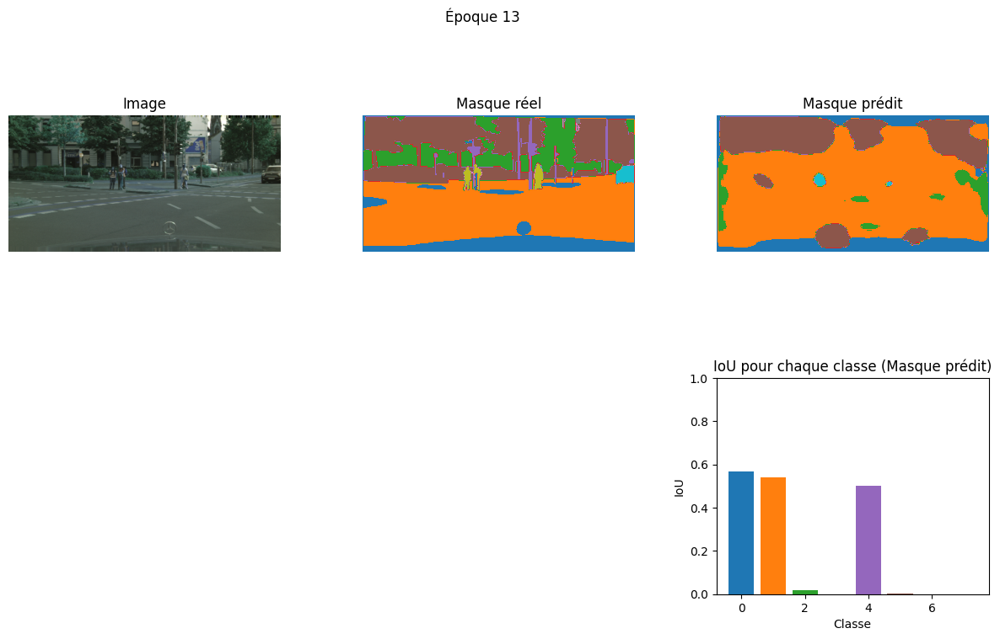

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5675
Classe 1 : IoU = 0.5405
Classe 2 : IoU = 0.0176
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.5004
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0006
30/30 ━━━━━━━━━━━━━━━━━━━━ 571s 19s/step - accuracy: 0.4700 - dice_coeff: 0.3441 - dice_loss: 0.6559 - jaccard_score: 0.2080 - loss: 1.3275 - total_loss: 3.1038 - val_accuracy: 0.4150 - val_dice_coeff: 0.3185 - val_dice_loss: 0.6815 - val_jaccard_score: 0.1896 - val_loss: 1.5668 - val_total_loss: 3.3698
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4800 - dice_coeff: 0.3526 - dice_loss: 0.6474 - jaccard_score: 0.2143 - loss: 1.3225 - total_loss: 3.1295 
Epoch 14: val_jaccard_score did not improve from 0.18960
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


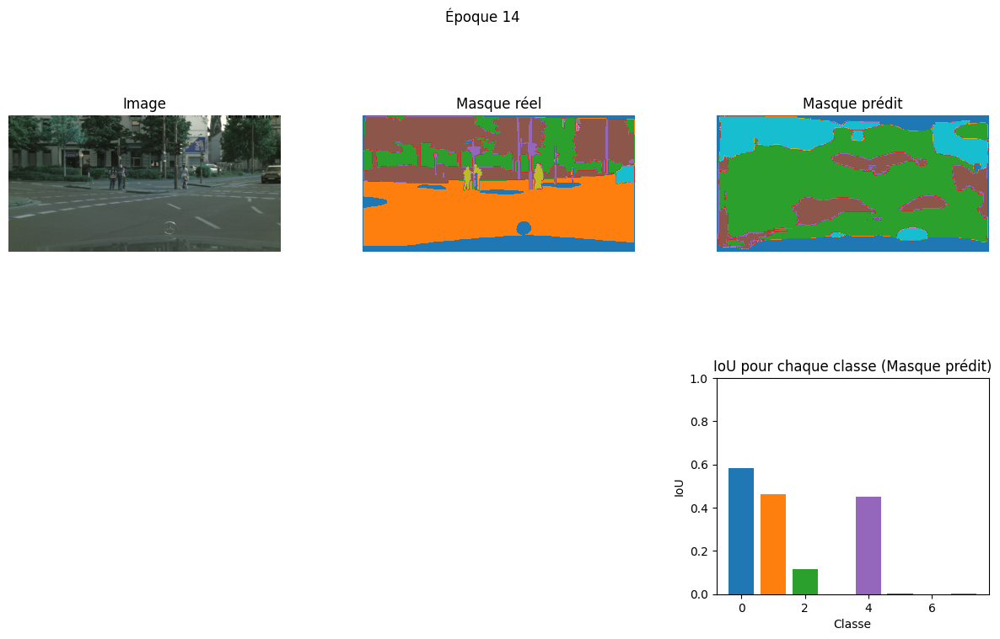

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.5831
Classe 1 : IoU = 0.4613
Classe 2 : IoU = 0.1173
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.4526
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 570s 19s/step - accuracy: 0.4805 - dice_coeff: 0.3528 - dice_loss: 0.6472 - jaccard_score: 0.2145 - loss: 1.3218 - total_loss: 3.1288 - val_accuracy: 0.4020 - val_dice_coeff: 0.3160 - val_dice_loss: 0.6840 - val_jaccard_score: 0.1877 - val_loss: 1.5808 - val_total_loss: 3.4600
Epoch 15/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.4983 - dice_coeff: 0.3689 - dice_loss: 0.6311 - jaccard_score: 0.2263 - loss: 1.2789 - total_loss: 3.1068 
Epoch 15: val_jaccard_score improved from 0.18960 to 0.20014, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


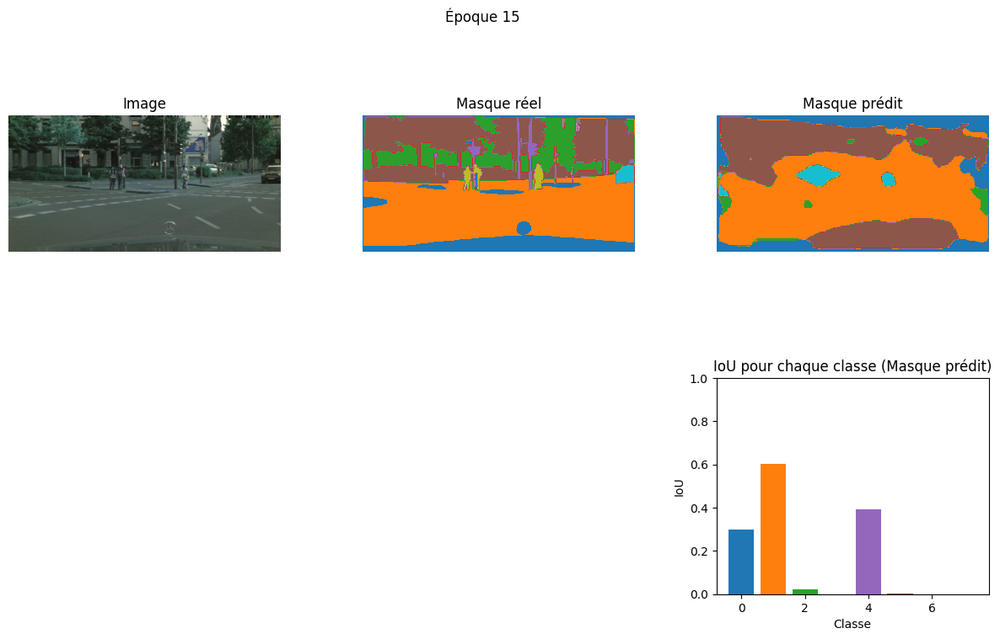

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.2997
Classe 1 : IoU = 0.6026
Classe 2 : IoU = 0.0206
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.3938
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0003
30/30 ━━━━━━━━━━━━━━━━━━━━ 573s 19s/step - accuracy: 0.4984 - dice_coeff: 0.3689 - dice_loss: 0.6311 - jaccard_score: 0.2263 - loss: 1.2787 - total_loss: 3.1070 - val_accuracy: 0.4195 - val_dice_coeff: 0.3333 - val_dice_loss: 0.6667 - val_jaccard_score: 0.2001 - val_loss: 1.5697 - val_total_loss: 3.2383
Epoch 16/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.5353 - dice_coeff: 0.3999 - dice_loss: 0.6001 - jaccard_score: 0.2504 - loss: 1.2192 - total_loss: 3.0458 
Epoch 16: val_jaccard_score did not improve from 0.20014
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


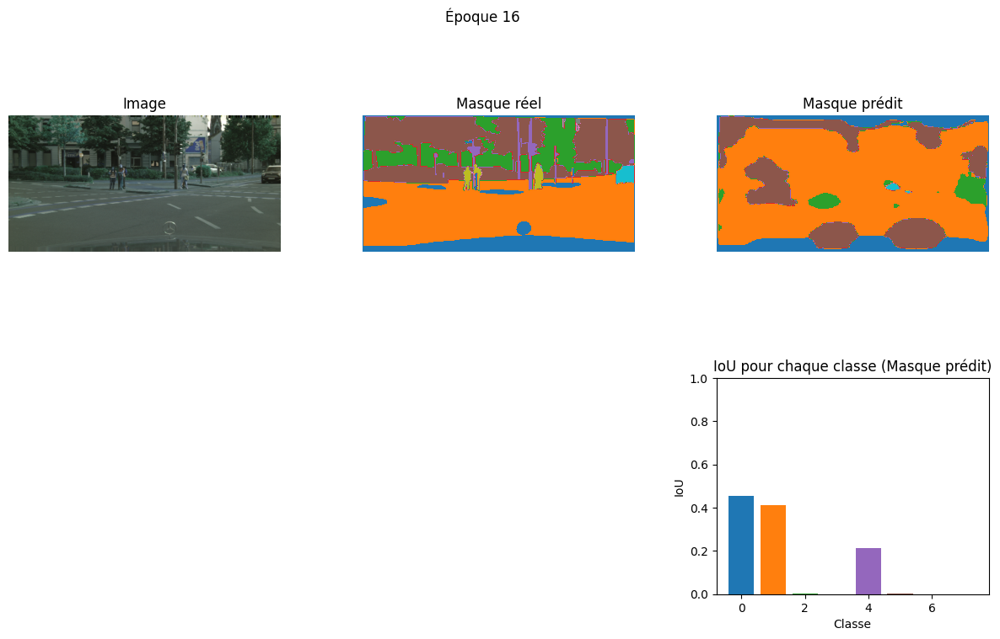

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4543
Classe 1 : IoU = 0.4128
Classe 2 : IoU = 0.0031
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.2142
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0007
30/30 ━━━━━━━━━━━━━━━━━━━━ 569s 19s/step - accuracy: 0.5346 - dice_coeff: 0.3994 - dice_loss: 0.6006 - jaccard_score: 0.2500 - loss: 1.2206 - total_loss: 3.0458 - val_accuracy: 0.4112 - val_dice_coeff: 0.3129 - val_dice_loss: 0.6871 - val_jaccard_score: 0.1856 - val_loss: 1.5385 - val_total_loss: 3.3344
Epoch 17/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.5196 - dice_coeff: 0.3854 - dice_loss: 0.6146 - jaccard_score: 0.2391 - loss: 1.2381 - total_loss: 3.0746 
Epoch 17: val_jaccard_score did not improve from 0.20014
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


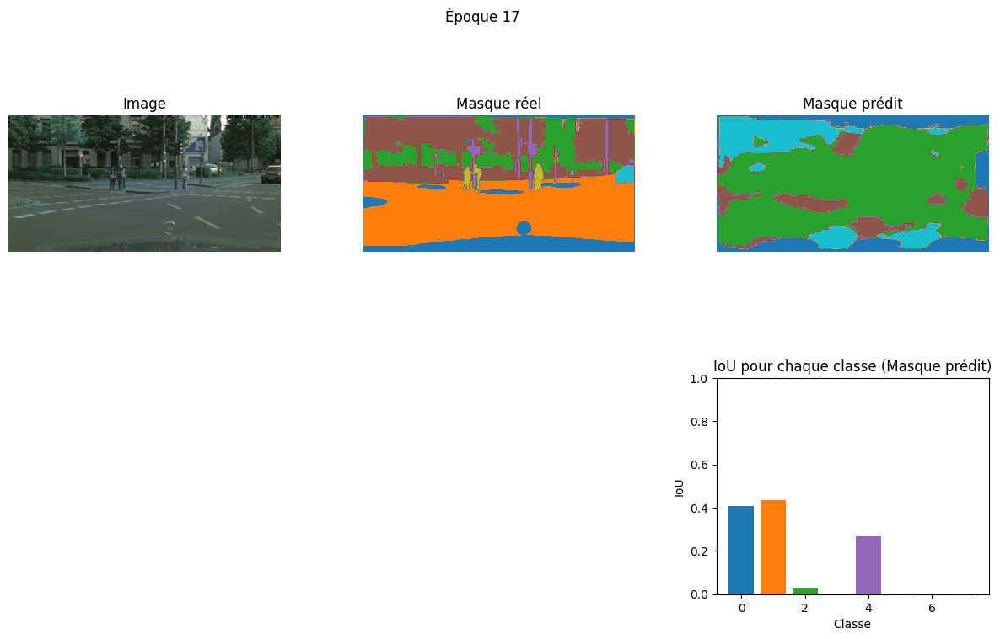

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.4084
Classe 1 : IoU = 0.4357
Classe 2 : IoU = 0.0264
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.2665
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0010
30/30 ━━━━━━━━━━━━━━━━━━━━ 567s 19s/step - accuracy: 0.5195 - dice_coeff: 0.3854 - dice_loss: 0.6146 - jaccard_score: 0.2391 - loss: 1.2384 - total_loss: 3.0751 - val_accuracy: 0.4059 - val_dice_coeff: 0.3241 - val_dice_loss: 0.6759 - val_jaccard_score: 0.1935 - val_loss: 1.5991 - val_total_loss: 3.3482
Epoch 18/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.5285 - dice_coeff: 0.3942 - dice_loss: 0.6058 - jaccard_score: 0.2457 - loss: 1.2252 - total_loss: 3.0774 
Epoch 18: val_jaccard_score did not improve from 0.20014
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


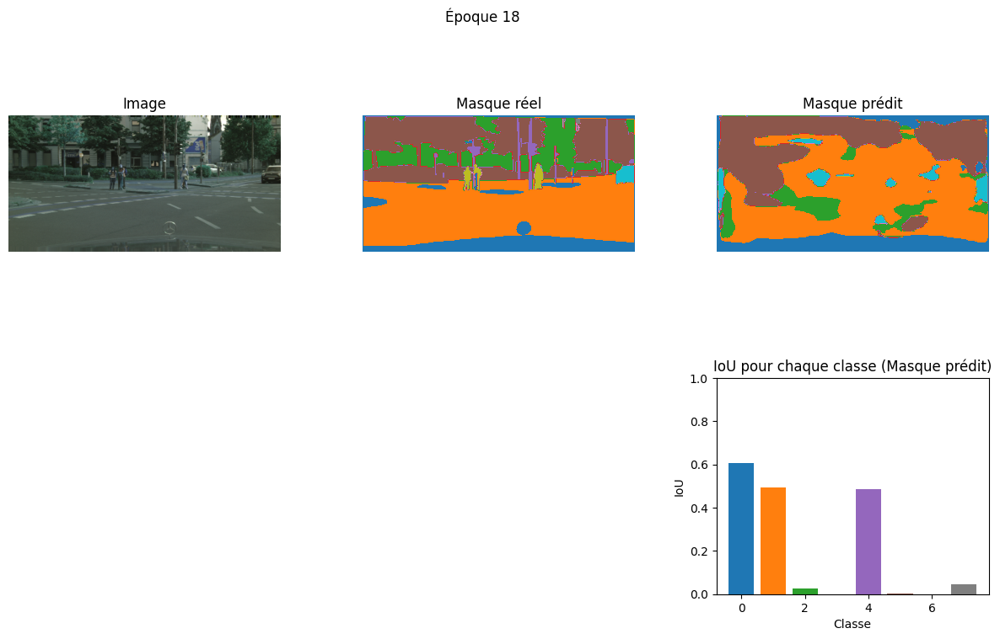

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.6075
Classe 1 : IoU = 0.4934
Classe 2 : IoU = 0.0247
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.4862
Classe 5 : IoU = 0.0043
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0439
30/30 ━━━━━━━━━━━━━━━━━━━━ 575s 19s/step - accuracy: 0.5285 - dice_coeff: 0.3943 - dice_loss: 0.6057 - jaccard_score: 0.2458 - loss: 1.2251 - total_loss: 3.0774 - val_accuracy: 0.3915 - val_dice_coeff: 0.3044 - val_dice_loss: 0.6956 - val_jaccard_score: 0.1796 - val_loss: 1.5987 - val_total_loss: 3.4018
Epoch 19/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.5530 - dice_coeff: 0.4115 - dice_loss: 0.5885 - jaccard_score: 0.2594 - loss: 1.1933 - total_loss: 3.0791 
Epoch 19: val_jaccard_score did not improve from 0.20014
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


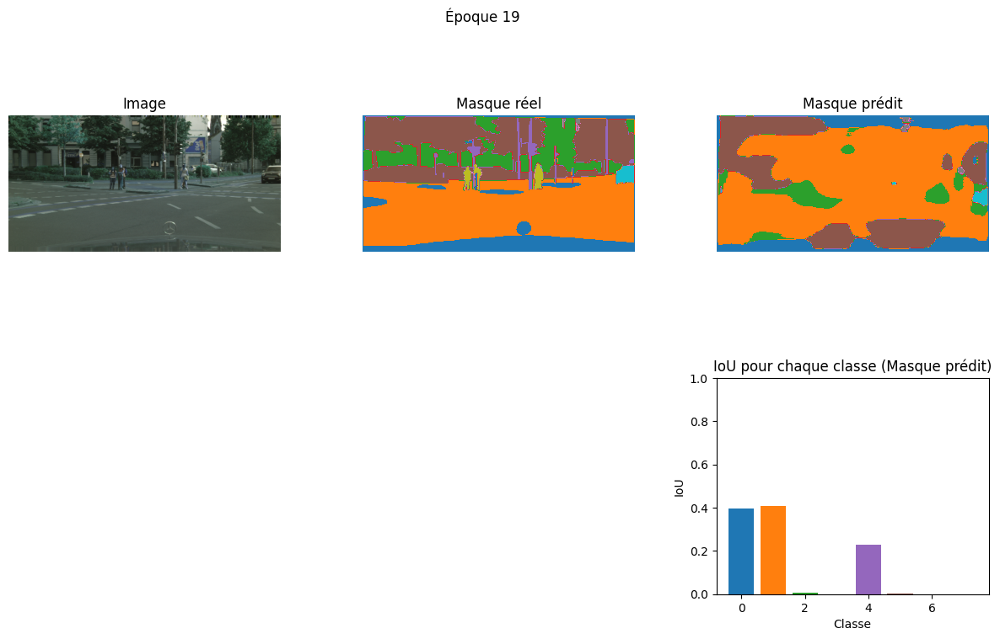

IoU pour chaque classe (Masque prédit) :
Classe 0 : IoU = 0.3979
Classe 1 : IoU = 0.4096
Classe 2 : IoU = 0.0077
Classe 3 : IoU = 0.0003
Classe 4 : IoU = 0.2278
Classe 5 : IoU = 0.0014
Classe 6 : IoU = 0.0007
Classe 7 : IoU = 0.0006
30/30 ━━━━━━━━━━━━━━━━━━━━ 579s 19s/step - accuracy: 0.5526 - dice_coeff: 0.4113 - dice_loss: 0.5887 - jaccard_score: 0.2592 - loss: 1.1936 - total_loss: 3.0786 - val_accuracy: 0.3906 - val_dice_coeff: 0.3132 - val_dice_loss: 0.6868 - val_jaccard_score: 0.1857 - val_loss: 1.6338 - val_total_loss: 3.4071
Epoch 19: early stopping
Restoring model weights from the end of the best epoch: 15.


In [50]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback()]
)